In [1]:
# Import modules

import pandas as pd
import lightgbm as lgb
import optuna
import time
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px


In [2]:

master_path = '../../Master_v2.xlsx'
all_data = pd.read_excel(master_path)

print(all_data.head())

     price     priceper  year dateoftransfer         borough  postcode  \
0   490000  10208.33333  2022     2022-01-21  city of london  EC4A 1EP   
1   802500  10422.07792  2015     2015-10-16  city of london  EC1Y 0ST   
2  1200000  15189.87342  2019     2019-08-16  city of london  EC2Y 5AG   
3   626250  12780.61224  2015     2015-03-03  city of london  EC2Y 5AG   
4   938400  14436.92308  2015     2015-01-29  city of london  EC2Y 5AG   

                            transactionid  tfarea area_bin propertytype  ...  \
0  {DE2D0CDF-F797-51EE-E053-6C04A8C00671}    48.0       Q1            F  ...   
1  {23B6165E-9D97-FCF4-E050-A8C0620577FA}    77.0       Q2            F  ...   
2  {93E6821D-E5C2-40FD-E053-6B04A8C0C1DF}    79.0       Q3            F  ...   
3  {637497CC-ECF1-4AFD-B581-E63781F99F4B}    49.0       Q1            F  ...   
4  {74550953-773F-4D4F-A43E-1E79826CD95B}    65.0       Q2            F  ...   

    central       ptal  crime_lagged_1yr  cpih_lagged_1yr  \
0  0.190356  

In [3]:
#Handle missing values
initial_rows = len(all_data.index)
all_data = all_data.dropna()
print(f"Number of rows removed for NA: {initial_rows - len(all_data.index)}")


Number of rows removed for NA: 247500


In [4]:
#Remove outliers >2.0million
all_data = all_data.drop(all_data[all_data['price'] >= 2000000].index)
# all_data = all_data.drop(all_data[all_data['price'] <= 210000].index)

print(f"Total number of rows for train/test/validation: {len(all_data.index)}")

Total number of rows for train/test/validation: 581471


In [5]:
# Shuffle rows within years
all_data = all_data.groupby('year').apply(lambda x: x.sample(frac=1, random_state=42)).reset_index(drop=True)

/var/folders/_6/n4f9pfd14lv1q8nl3892x2v80000gn/T/ipykernel_16956/709444405.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  all_data = all_data.groupby('year').apply(lambda x: x.sample(frac=1, random_state=42)).reset_index(drop=True)


In [6]:
#Define features and target: Uses price as as target and area as predictor
# Create outward postcode (e.g., "SW1A") for location signal
all_data['outward_postcode'] = all_data['postcode'].str.split().str[0]

target = 'price'
features = ['tfarea', 'propertytype', 'duration', 'education', 'culture', 'central', 'ptal', 'crime_lagged_1yr', 'cpih_lagged_1yr', 'unemployment_lagged_1yr', 'mortgage_lagged_1yr', 'avg_price_lagged_1yr', 'borough', 'postcode', 'lat', 'long']
categorical_features = ['propertytype', 'duration', 'borough', 'postcode']

#Split into train/test based on time
test_data = all_data[all_data['year'] == 2024]
train_full = all_data.drop(all_data[all_data['year'] == 2024].index)
print(f"Length of test data {len(test_data)}")
print(f"Length of training data {len(train_full)}")

# Test split
X_test = test_data[features].copy()
# Convert categorical columns to category dtype (LightGBM requires category, not object/string)
for col in categorical_features:
    X_test[col] = X_test[col].astype('category')
Y_test = test_data[target]

# Train split
X_train_full = train_full[features].copy()
# Convert categorical columns to category dtype (LightGBM requires category, not object/string)
for col in categorical_features:
    X_train_full[col] = X_train_full[col].astype('category')
Y_train_full = train_full[target]
Y_train_full_log = np.log(Y_train_full)

Length of test data 33598
Length of training data 547873


In [7]:
# Time series split function

def time_series_split(df, n_splits=5):
    """
    Generate train/validation splits at year boundaries
    """
    years = sorted(df['year'].unique())
    total_years = len(years)

    splits = []

    for i in range(n_splits):
        # Expanding training window
        train_end_year_idx = total_years - n_splits + i
        train_years = years[:train_end_year_idx]

        # Validation window
        val_start_idx = train_end_year_idx
        val_end_idx = val_start_idx + 1
        val_years = years[val_start_idx:val_end_idx]

        # Note down index, so that the list returned is not abhorrently large
        train_idx = df[df['year'].isin(train_years)].index.values
        val_idx = df[df['year'].isin(val_years)].index.values

        splits.append((train_idx, val_idx))

        print(f"Fold {i+1}: Train on {train_years[0]} to {train_years[-1]}"
              f"({len(train_years)} years, {len(train_idx):,} samples) "
              f"Validate on {val_years[0]} to {val_years[-1]}"
              f"({len(val_years)} years, {len(val_idx):,} samples)")
    
    return splits

In [8]:
# Segmentation thresholds
LOW_MAX = 250_000
HIGH_MIN = 1_100_000
segments = {
    "low": (-np.inf, LOW_MAX),
    "mid": (LOW_MAX, HIGH_MIN),
    "high": (HIGH_MIN, np.inf),
}

# Loss choice: Huber for tails, L2 for mid bulk
segment_loss = {
    "low": ("huber", 0.9),
    "mid": ("regression", None),
    "high": ("huber", 0.9),
}

# Prepare segment-specific training data
segment_data = {}
for name, (low, high) in segments.items():
    seg_train = train_full[(train_full[target] > low) & (train_full[target] <= high)].copy().reset_index(drop=True)

    X_train = seg_train[features].copy()
    for col in categorical_features:
        X_train[col] = X_train[col].astype("category")

    y_train = seg_train[target]

    segment_data[name] = {
        "train_df": seg_train,
        "X_train": X_train,
        "y_train": y_train,
        "y_train_log": np.log(y_train),
    }

segment_data.keys()

dict_keys(['low', 'mid', 'high'])

In [9]:
# Optuna objective factory (uses time-series split)

def objective_factory(X_full, y_full, y_full_log, df_train, loss, alpha):
    def objective(trial):
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 1500),
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
            "num_leaves": trial.suggest_int("num_leaves", 20, 150),
            "max_depth": trial.suggest_int("max_depth", 3, 20),
            "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
            "subsample": trial.suggest_float("subsample", 0.5, 1.0),
            "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
            "objective": loss,
            "random_state": 42,
            "verbosity": -1,
        }
        if loss == "huber":
            params["alpha"] = alpha

        year_splits = time_series_split(df_train)
        cv_scores = []

        for train_idx, val_idx in year_splits:
            X_train, X_val = X_full.iloc[train_idx], X_full.iloc[val_idx]
            y_train_log, y_val_log = y_full_log.iloc[train_idx], y_full_log.iloc[val_idx]
            y_val_raw = y_full.iloc[val_idx]

            model = lgb.LGBMRegressor(**params)
            model.fit(
                X_train,
                y_train_log,
                eval_set=[(X_val, y_val_log)],
                callbacks=[lgb.early_stopping(50, verbose=False)],
            )

            preds = np.exp(model.predict(X_val))
            cv_scores.append(np.sqrt(mean_squared_error(y_val_raw, preds)))

        return np.mean(cv_scores)

    return objective

In [10]:
# Run Optuna tuning per segment (series for stability)
from tqdm.auto import tqdm

n_trials = 200
segment_studies = {}

for name, data in segment_data.items():
    loss, alpha = segment_loss[name]
    study = optuna.create_study(direction="minimize")

    pbar = tqdm(total=n_trials, desc=f"{name} segment")

    def print_trial(study, trial):
        pbar.set_postfix_str(f"best RMSE {study.best_value:,.0f}")
        pbar.update(1)

    study.optimize(
        objective_factory(
            data["X_train"],
            data["y_train"],
            data["y_train_log"],
            data["train_df"],
            loss,
            alpha,
        ),
        n_trials=n_trials,
        callbacks=[print_trial],
    )

    pbar.close()
    segment_studies[name] = study

    print(
        f"{name}: best RMSE {study.best_value:,.2f} | params {study.best_params}"
    )

[I 2026-01-21 17:37:41,427] A new study created in memory with name: no-name-390b8f1a-b6ce-4084-b968-b25cf32b8218


low segment:   0%|          | 0/200 [00:00<?, ?it/s]

Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:37:48,839] Trial 0 finished with value: 37164.69956578073 and parameters: {'n_estimators': 1232, 'learning_rate': 0.12306580495601287, 'num_leaves': 138, 'max_depth': 5, 'min_child_samples': 72, 'subsample': 0.7777037037248755, 'colsample_bytree': 0.77511524178223}. Best is trial 0 with value: 37164.69956578073.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:38:02,271] Trial 1 finished with value: 37431.73312607094 and parameters: {'n_estimators': 823, 'learning_rate': 0.014115557283699664, 'num_leaves': 100, 'max_depth': 7, 'min_child_samples': 41, 'subsample': 0.6042443012049198, 'colsample_bytree': 0.509701980291452}. Best is trial 0 with value: 37164.69956578073.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:38:06,164] Trial 2 finished with value: 37183.48879869675 and parameters: {'n_estimators': 830, 'learning_rate': 0.23648169636806127, 'num_leaves': 24, 'max_depth': 8, 'min_child_samples': 68, 'subsample': 0.617219263513707, 'colsample_bytree': 0.9702255553925261}. Best is trial 0 with value: 37164.69956578073.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:38:14,004] Trial 3 finished with value: 37221.068226783726 and parameters: {'n_estimators': 1154, 'learning_rate': 0.06943865506796693, 'num_leaves': 63, 'max_depth': 4, 'min_child_samples': 25, 'subsample': 0.8416231639040599, 'colsample_bytree': 0.6506389170094142}. Best is trial 0 with value: 37164.69956578073.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:38:18,573] Trial 4 finished with value: 37304.89966313959 and parameters: {'n_estimators': 876, 'learning_rate': 0.25033497466908766, 'num_leaves': 120, 'max_depth': 6, 'min_child_samples': 74, 'subsample': 0.8776486001006043, 'colsample_bytree': 0.6162038017277873}. Best is trial 0 with value: 37164.69956578073.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:38:23,169] Trial 5 finished with value: 37404.88209179447 and parameters: {'n_estimators': 1310, 'learning_rate': 0.26244332419828115, 'num_leaves': 77, 'max_depth': 17, 'min_child_samples': 92, 'subsample': 0.6748835586159478, 'colsample_bytree': 0.604102440413921}. Best is trial 0 with value: 37164.69956578073.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:38:33,201] Trial 6 finished with value: 36874.1051869059 and parameters: {'n_estimators': 364, 'learning_rate': 0.08296989340879009, 'num_leaves': 118, 'max_depth': 14, 'min_child_samples': 68, 'subsample': 0.9398554772419381, 'colsample_bytree': 0.7158468646265398}. Best is trial 6 with value: 36874.1051869059.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:38:45,019] Trial 7 finished with value: 36638.894864914895 and parameters: {'n_estimators': 1074, 'learning_rate': 0.06732773534080456, 'num_leaves': 98, 'max_depth': 19, 'min_child_samples': 51, 'subsample': 0.5574413285912785, 'colsample_bytree': 0.5646163133102897}. Best is trial 7 with value: 36638.894864914895.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:38:50,209] Trial 8 finished with value: 37298.565289922095 and parameters: {'n_estimators': 1499, 'learning_rate': 0.19512502228324158, 'num_leaves': 36, 'max_depth': 4, 'min_child_samples': 29, 'subsample': 0.7823245419639266, 'colsample_bytree': 0.7875381874779753}. Best is trial 7 with value: 36638.894864914895.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:38:55,041] Trial 9 finished with value: 37000.22111627243 and parameters: {'n_estimators': 963, 'learning_rate': 0.19069500567785308, 'num_leaves': 45, 'max_depth': 13, 'min_child_samples': 40, 'subsample': 0.9279769490085421, 'colsample_bytree': 0.6616076373997805}. Best is trial 7 with value: 36638.894864914895.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:39:11,860] Trial 10 finished with value: 36835.557273775674 and parameters: {'n_estimators': 324, 'learning_rate': 0.010832361674036249, 'num_leaves': 149, 'max_depth': 20, 'min_child_samples': 9, 'subsample': 0.5151296744704628, 'colsample_bytree': 0.8674154279798887}. Best is trial 7 with value: 36638.894864914895.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:39:26,938] Trial 11 finished with value: 36250.74346026501 and parameters: {'n_estimators': 356, 'learning_rate': 0.031640355982463716, 'num_leaves': 136, 'max_depth': 20, 'min_child_samples': 5, 'subsample': 0.5223297039914971, 'colsample_bytree': 0.893285702141621}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:39:31,502] Trial 12 finished with value: 36797.076483530494 and parameters: {'n_estimators': 105, 'learning_rate': 0.06489560774747344, 'num_leaves': 98, 'max_depth': 20, 'min_child_samples': 8, 'subsample': 0.5046652619521305, 'colsample_bytree': 0.9069859702389832}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:39:40,843] Trial 13 finished with value: 36834.96492977231 and parameters: {'n_estimators': 606, 'learning_rate': 0.10889900262653548, 'num_leaves': 126, 'max_depth': 17, 'min_child_samples': 95, 'subsample': 0.5837867806705735, 'colsample_bytree': 0.5093105736677523}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:40:05,179] Trial 14 finished with value: 36681.20668196697 and parameters: {'n_estimators': 582, 'learning_rate': 0.04189620437104806, 'num_leaves': 97, 'max_depth': 17, 'min_child_samples': 52, 'subsample': 0.6879454705876203, 'colsample_bytree': 0.8458629101785904}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:40:12,425] Trial 15 finished with value: 36860.04334217381 and parameters: {'n_estimators': 1068, 'learning_rate': 0.11691129328253103, 'num_leaves': 79, 'max_depth': 10, 'min_child_samples': 21, 'subsample': 0.5589551255694977, 'colsample_bytree': 0.9833545499927773}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:40:35,434] Trial 16 finished with value: 36564.0912980787 and parameters: {'n_estimators': 598, 'learning_rate': 0.04033087417488895, 'num_leaves': 110, 'max_depth': 15, 'min_child_samples': 54, 'subsample': 0.6678633125170715, 'colsample_bytree': 0.7257103082733413}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:40:43,675] Trial 17 finished with value: 36950.67531017212 and parameters: {'n_estimators': 594, 'learning_rate': 0.1601571396521965, 'num_leaves': 136, 'max_depth': 15, 'min_child_samples': 42, 'subsample': 0.6872393409546582, 'colsample_bytree': 0.7247475569879653}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:40:52,433] Trial 18 finished with value: 37128.3599217878 and parameters: {'n_estimators': 349, 'learning_rate': 0.03801412714778008, 'num_leaves': 112, 'max_depth': 10, 'min_child_samples': 82, 'subsample': 0.7292974511668797, 'colsample_bytree': 0.8367566956883502}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:40:59,498] Trial 19 finished with value: 36879.674976456496 and parameters: {'n_estimators': 134, 'learning_rate': 0.15163137046708053, 'num_leaves': 149, 'max_depth': 15, 'min_child_samples': 59, 'subsample': 0.6369889472141662, 'colsample_bytree': 0.8080898287136663}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:41:18,622] Trial 20 finished with value: 36467.40665708704 and parameters: {'n_estimators': 490, 'learning_rate': 0.03859498950604513, 'num_leaves': 133, 'max_depth': 18, 'min_child_samples': 18, 'subsample': 0.7473119034085468, 'colsample_bytree': 0.899905406596539}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:41:49,430] Trial 21 finished with value: 36519.345314830265 and parameters: {'n_estimators': 482, 'learning_rate': 0.03906759141102507, 'num_leaves': 135, 'max_depth': 18, 'min_child_samples': 19, 'subsample': 0.8339654173496045, 'colsample_bytree': 0.9241597920806689}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:41:54,099] Trial 22 finished with value: 37414.25871283022 and parameters: {'n_estimators': 451, 'learning_rate': 0.2955465007975381, 'num_leaves': 133, 'max_depth': 18, 'min_child_samples': 17, 'subsample': 0.8176918131197873, 'colsample_bytree': 0.9381340944530755}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:42:03,223] Trial 23 finished with value: 36426.67936851316 and parameters: {'n_estimators': 246, 'learning_rate': 0.09786373022316036, 'num_leaves': 142, 'max_depth': 18, 'min_child_samples': 6, 'subsample': 0.9950424796903197, 'colsample_bytree': 0.9013736707849171}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:42:12,025] Trial 24 finished with value: 36504.45364723499 and parameters: {'n_estimators': 234, 'learning_rate': 0.09292133630150332, 'num_leaves': 144, 'max_depth': 20, 'min_child_samples': 5, 'subsample': 0.9731780228003599, 'colsample_bytree': 0.8925506533754892}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:42:20,759] Trial 25 finished with value: 36548.84860847517 and parameters: {'n_estimators': 233, 'learning_rate': 0.09392262100128251, 'num_leaves': 126, 'max_depth': 12, 'min_child_samples': 14, 'subsample': 0.8904222946495066, 'colsample_bytree': 0.9542256326380083}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:42:26,981] Trial 26 finished with value: 36953.556200605395 and parameters: {'n_estimators': 462, 'learning_rate': 0.14112576384965256, 'num_leaves': 128, 'max_depth': 16, 'min_child_samples': 28, 'subsample': 0.7281877470921427, 'colsample_bytree': 0.9953103155546255}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:42:42,107] Trial 27 finished with value: 36582.18430993987 and parameters: {'n_estimators': 693, 'learning_rate': 0.0537033461677914, 'num_leaves': 112, 'max_depth': 19, 'min_child_samples': 34, 'subsample': 0.9986231236564326, 'colsample_bytree': 0.8828321656000837}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:42:53,059] Trial 28 finished with value: 36533.75441989745 and parameters: {'n_estimators': 226, 'learning_rate': 0.030518899164140488, 'num_leaves': 142, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.7638626043566704, 'colsample_bytree': 0.8264315242602811}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:43:01,532] Trial 29 finished with value: 36743.672314499505 and parameters: {'n_estimators': 720, 'learning_rate': 0.1328220070109431, 'num_leaves': 141, 'max_depth': 16, 'min_child_samples': 6, 'subsample': 0.7859321889889218, 'colsample_bytree': 0.7823467084901972}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:43:08,616] Trial 30 finished with value: 36689.1320499187 and parameters: {'n_estimators': 422, 'learning_rate': 0.10522576921662408, 'num_leaves': 64, 'max_depth': 19, 'min_child_samples': 23, 'subsample': 0.8870164789173369, 'colsample_bytree': 0.8517192715802309}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:43:18,069] Trial 31 finished with value: 36497.13593815944 and parameters: {'n_estimators': 252, 'learning_rate': 0.08888648966389057, 'num_leaves': 145, 'max_depth': 20, 'min_child_samples': 5, 'subsample': 0.9747822732747431, 'colsample_bytree': 0.8955159033653051}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:43:32,907] Trial 32 finished with value: 36715.466461238604 and parameters: {'n_estimators': 274, 'learning_rate': 0.023050141083281225, 'num_leaves': 150, 'max_depth': 20, 'min_child_samples': 15, 'subsample': 0.9389151729965513, 'colsample_bytree': 0.9380490893196411}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:43:40,770] Trial 33 finished with value: 36621.8982006914 and parameters: {'n_estimators': 169, 'learning_rate': 0.05697450900226686, 'num_leaves': 131, 'max_depth': 18, 'min_child_samples': 11, 'subsample': 0.9917144741181522, 'colsample_bytree': 0.9124412148604493}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:43:52,097] Trial 34 finished with value: 36414.65877750633 and parameters: {'n_estimators': 370, 'learning_rate': 0.08987220557537695, 'num_leaves': 141, 'max_depth': 19, 'min_child_samples': 5, 'subsample': 0.9183084259187796, 'colsample_bytree': 0.8820037066464737}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:44:03,092] Trial 35 finished with value: 36749.52506014607 and parameters: {'n_estimators': 516, 'learning_rate': 0.07475024828768159, 'num_leaves': 118, 'max_depth': 16, 'min_child_samples': 31, 'subsample': 0.9116762540774225, 'colsample_bytree': 0.9589003581006741}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:44:21,944] Trial 36 finished with value: 36798.25741037216 and parameters: {'n_estimators': 380, 'learning_rate': 0.01150092857751733, 'num_leaves': 138, 'max_depth': 19, 'min_child_samples': 19, 'subsample': 0.8558113080778394, 'colsample_bytree': 0.8693907456227072}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:44:31,689] Trial 37 finished with value: 36700.53719336486 and parameters: {'n_estimators': 312, 'learning_rate': 0.05416922269825157, 'num_leaves': 124, 'max_depth': 8, 'min_child_samples': 10, 'subsample': 0.9523961307792538, 'colsample_bytree': 0.7519385654078685}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:44:38,168] Trial 38 finished with value: 36959.042443743245 and parameters: {'n_estimators': 709, 'learning_rate': 0.16916464686472532, 'num_leaves': 117, 'max_depth': 17, 'min_child_samples': 24, 'subsample': 0.806741715892135, 'colsample_bytree': 0.9723943911581145}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:44:48,424] Trial 39 finished with value: 36667.113755230865 and parameters: {'n_estimators': 523, 'learning_rate': 0.08069211192092035, 'num_leaves': 105, 'max_depth': 13, 'min_child_samples': 39, 'subsample': 0.8632836684599565, 'colsample_bytree': 0.821025368169372}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:44:50,016] Trial 40 finished with value: 38216.672194286904 and parameters: {'n_estimators': 171, 'learning_rate': 0.12687751533030517, 'num_leaves': 84, 'max_depth': 3, 'min_child_samples': 14, 'subsample': 0.9109593510591188, 'colsample_bytree': 0.8087679806127153}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:45:00,951] Trial 41 finished with value: 36447.54897493475 and parameters: {'n_estimators': 400, 'learning_rate': 0.09431996541683606, 'num_leaves': 143, 'max_depth': 19, 'min_child_samples': 5, 'subsample': 0.9651239134281696, 'colsample_bytree': 0.9101463230080262}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:45:10,485] Trial 42 finished with value: 36494.73417163238 and parameters: {'n_estimators': 372, 'learning_rate': 0.10145877164072335, 'num_leaves': 138, 'max_depth': 19, 'min_child_samples': 5, 'subsample': 0.9634549519106532, 'colsample_bytree': 0.8693853175100661}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:45:22,745] Trial 43 finished with value: 36381.217577601456 and parameters: {'n_estimators': 310, 'learning_rate': 0.06356480281802707, 'num_leaves': 131, 'max_depth': 18, 'min_child_samples': 11, 'subsample': 0.9208398913111837, 'colsample_bytree': 0.9270867522417338}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:45:35,324] Trial 44 finished with value: 36393.09197354094 and parameters: {'n_estimators': 398, 'learning_rate': 0.06883191437789442, 'num_leaves': 121, 'max_depth': 17, 'min_child_samples': 10, 'subsample': 0.9209008059528172, 'colsample_bytree': 0.9316330534297317}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:45:47,901] Trial 45 finished with value: 36578.402853936444 and parameters: {'n_estimators': 301, 'learning_rate': 0.06994982207911013, 'num_leaves': 123, 'max_depth': 17, 'min_child_samples': 11, 'subsample': 0.9160379539568744, 'colsample_bytree': 0.9353259798428482}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:45:57,324] Trial 46 finished with value: 37024.655945309656 and parameters: {'n_estimators': 171, 'learning_rate': 0.02510623582744785, 'num_leaves': 105, 'max_depth': 16, 'min_child_samples': 10, 'subsample': 0.8930154834297024, 'colsample_bytree': 0.9612455617035265}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:47:52,357] Trial 47 finished with value: 37035.631479706186 and parameters: {'n_estimators': 104, 'learning_rate': 0.056395634439391135, 'num_leaves': 129, 'max_depth': 14, 'min_child_samples': 27, 'subsample': 0.9378525303115206, 'colsample_bytree': 0.9953979949545219}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:48:04,721] Trial 48 finished with value: 36889.23699389967 and parameters: {'n_estimators': 860, 'learning_rate': 0.07877267643612042, 'num_leaves': 24, 'max_depth': 20, 'min_child_samples': 34, 'subsample': 0.863463987669058, 'colsample_bytree': 0.8557449343527701}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:48:14,866] Trial 49 finished with value: 36665.15664894658 and parameters: {'n_estimators': 331, 'learning_rate': 0.1175570114756149, 'num_leaves': 150, 'max_depth': 19, 'min_child_samples': 22, 'subsample': 0.5330389794678615, 'colsample_bytree': 0.6901983996614651}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:48:25,218] Trial 50 finished with value: 36811.190782472055 and parameters: {'n_estimators': 1436, 'learning_rate': 0.06641920003772614, 'num_leaves': 94, 'max_depth': 17, 'min_child_samples': 86, 'subsample': 0.9830603903725104, 'colsample_bytree': 0.8808900313212384}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:48:31,951] Trial 51 finished with value: 36560.33130632424 and parameters: {'n_estimators': 423, 'learning_rate': 0.09956877812512029, 'num_leaves': 142, 'max_depth': 19, 'min_child_samples': 8, 'subsample': 0.9574514743285808, 'colsample_bytree': 0.9230659884931858}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:48:44,233] Trial 52 finished with value: 36574.90327994535 and parameters: {'n_estimators': 374, 'learning_rate': 0.11084543648197298, 'num_leaves': 137, 'max_depth': 18, 'min_child_samples': 16, 'subsample': 0.9231198224248359, 'colsample_bytree': 0.5441181358158143}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:48:52,896] Trial 53 finished with value: 36900.099391733136 and parameters: {'n_estimators': 391, 'learning_rate': 0.08578202121726575, 'num_leaves': 120, 'max_depth': 17, 'min_child_samples': 100, 'subsample': 0.9513593464424275, 'colsample_bytree': 0.9156130088377162}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:48:57,288] Trial 54 finished with value: 37010.206104807476 and parameters: {'n_estimators': 548, 'learning_rate': 0.21110151128819762, 'num_leaves': 145, 'max_depth': 20, 'min_child_samples': 8, 'subsample': 0.6175851098231804, 'colsample_bytree': 0.9437288684139005}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:49:07,965] Trial 55 finished with value: 36528.52585423465 and parameters: {'n_estimators': 298, 'learning_rate': 0.05419105498619844, 'num_leaves': 132, 'max_depth': 19, 'min_child_samples': 12, 'subsample': 0.8971728318900193, 'colsample_bytree': 0.9715173074971629}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:49:19,379] Trial 56 finished with value: 36699.276250402116 and parameters: {'n_estimators': 922, 'learning_rate': 0.06506584975575587, 'num_leaves': 139, 'max_depth': 18, 'min_child_samples': 72, 'subsample': 0.9312947350151909, 'colsample_bytree': 0.9063839900771097}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:51:37,103] Trial 57 finished with value: 37059.66821437836 and parameters: {'n_estimators': 203, 'learning_rate': 0.13760413311952868, 'num_leaves': 65, 'max_depth': 6, 'min_child_samples': 8, 'subsample': 0.9810929158154782, 'colsample_bytree': 0.8769591741082203}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:51:52,222] Trial 58 finished with value: 36514.280877729856 and parameters: {'n_estimators': 639, 'learning_rate': 0.04522474940970687, 'num_leaves': 146, 'max_depth': 16, 'min_child_samples': 19, 'subsample': 0.8744158667877237, 'colsample_bytree': 0.8443212320541278}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:51:58,471] Trial 59 finished with value: 36915.966620920386 and parameters: {'n_estimators': 788, 'learning_rate': 0.12023782181582053, 'num_leaves': 129, 'max_depth': 10, 'min_child_samples': 60, 'subsample': 0.6585690241209221, 'colsample_bytree': 0.9214638827000047}. Best is trial 11 with value: 36250.74346026501.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:52:51,849] Trial 60 finished with value: 36165.56041503074 and parameters: {'n_estimators': 1232, 'learning_rate': 0.020462840060049933, 'num_leaves': 115, 'max_depth': 15, 'min_child_samples': 5, 'subsample': 0.9581527860496226, 'colsample_bytree': 0.8900233752356717}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:53:17,815] Trial 61 finished with value: 36643.508544282675 and parameters: {'n_estimators': 1197, 'learning_rate': 0.01920261713961422, 'num_leaves': 38, 'max_depth': 15, 'min_child_samples': 5, 'subsample': 0.9630745212365692, 'colsample_bytree': 0.8931396338047023}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:53:41,543] Trial 62 finished with value: 36307.1045876466 and parameters: {'n_estimators': 1305, 'learning_rate': 0.031085055406695733, 'num_leaves': 124, 'max_depth': 18, 'min_child_samples': 14, 'subsample': 0.9977122113433001, 'colsample_bytree': 0.947724041322046}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:54:01,161] Trial 63 finished with value: 36448.31936064259 and parameters: {'n_estimators': 1370, 'learning_rate': 0.030702335798271328, 'num_leaves': 114, 'max_depth': 18, 'min_child_samples': 14, 'subsample': 0.9459257228750115, 'colsample_bytree': 0.9504625352970743}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:54:18,120] Trial 64 finished with value: 36354.575967544806 and parameters: {'n_estimators': 1290, 'learning_rate': 0.046696933942028875, 'num_leaves': 107, 'max_depth': 17, 'min_child_samples': 9, 'subsample': 0.9846715835108991, 'colsample_bytree': 0.9804453962983088}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:54:32,743] Trial 65 finished with value: 36613.35497044785 and parameters: {'n_estimators': 1280, 'learning_rate': 0.04696218243171044, 'num_leaves': 107, 'max_depth': 15, 'min_child_samples': 17, 'subsample': 0.8387837510273971, 'colsample_bytree': 0.9799733728854814}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:54:54,974] Trial 66 finished with value: 36330.89856663456 and parameters: {'n_estimators': 1144, 'learning_rate': 0.03313115901241433, 'num_leaves': 123, 'max_depth': 17, 'min_child_samples': 12, 'subsample': 0.982489370899199, 'colsample_bytree': 0.9331905926359486}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:55:16,338] Trial 67 finished with value: 36576.079375682035 and parameters: {'n_estimators': 1094, 'learning_rate': 0.031687311779721755, 'num_leaves': 115, 'max_depth': 17, 'min_child_samples': 21, 'subsample': 0.9861462853022659, 'colsample_bytree': 0.9915006305036926}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:56:08,181] Trial 68 finished with value: 36385.83208536006 and parameters: {'n_estimators': 1283, 'learning_rate': 0.01749186174215859, 'num_leaves': 123, 'max_depth': 14, 'min_child_samples': 12, 'subsample': 0.7095407577118311, 'colsample_bytree': 0.9321091527844474}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:56:49,529] Trial 69 finished with value: 36620.13525484966 and parameters: {'n_estimators': 1329, 'learning_rate': 0.01060347571778099, 'num_leaves': 110, 'max_depth': 13, 'min_child_samples': 25, 'subsample': 0.7139557739538495, 'colsample_bytree': 0.9634148171572068}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:57:14,095] Trial 70 finished with value: 36400.35380687773 and parameters: {'n_estimators': 1140, 'learning_rate': 0.02531814525914365, 'num_leaves': 126, 'max_depth': 14, 'min_child_samples': 13, 'subsample': 0.5706667110498178, 'colsample_bytree': 0.9442992473825069}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:57:50,190] Trial 71 finished with value: 36384.56695614732 and parameters: {'n_estimators': 1285, 'learning_rate': 0.019826620670267785, 'num_leaves': 121, 'max_depth': 15, 'min_child_samples': 11, 'subsample': 0.5989619103294916, 'colsample_bytree': 0.9822765170533804}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:58:27,533] Trial 72 finished with value: 36540.90023393735 and parameters: {'n_estimators': 1218, 'learning_rate': 0.017787062565347476, 'num_leaves': 123, 'max_depth': 15, 'min_child_samples': 16, 'subsample': 0.5267832686154852, 'colsample_bytree': 0.9789092005291719}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:58:47,059] Trial 73 finished with value: 36614.14738456684 and parameters: {'n_estimators': 1270, 'learning_rate': 0.0349588835628041, 'num_leaves': 93, 'max_depth': 14, 'min_child_samples': 20, 'subsample': 0.6055667831479703, 'colsample_bytree': 0.9530848697429251}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:59:01,129] Trial 74 finished with value: 36814.71215844954 and parameters: {'n_estimators': 1009, 'learning_rate': 0.04655121756909851, 'num_leaves': 103, 'max_depth': 11, 'min_child_samples': 47, 'subsample': 0.5010367545668595, 'colsample_bytree': 0.9979342111892919}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:59:29,141] Trial 75 finished with value: 36332.62996863459 and parameters: {'n_estimators': 1412, 'learning_rate': 0.02042821287344982, 'num_leaves': 109, 'max_depth': 16, 'min_child_samples': 8, 'subsample': 0.5480369194849779, 'colsample_bytree': 0.9291431918266235}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 17:59:43,407] Trial 76 finished with value: 36346.64326050015 and parameters: {'n_estimators': 1405, 'learning_rate': 0.03914377504361609, 'num_leaves': 111, 'max_depth': 16, 'min_child_samples': 8, 'subsample': 0.5561601008497637, 'colsample_bytree': 0.9657969339554041}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:00:00,453] Trial 77 finished with value: 36353.781457112025 and parameters: {'n_estimators': 1474, 'learning_rate': 0.035092004651614925, 'num_leaves': 102, 'max_depth': 16, 'min_child_samples': 7, 'subsample': 0.5375681289354494, 'colsample_bytree': 0.9663621672016018}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:00:17,965] Trial 78 finished with value: 36272.668565008076 and parameters: {'n_estimators': 1486, 'learning_rate': 0.03781845488663722, 'num_leaves': 100, 'max_depth': 16, 'min_child_samples': 7, 'subsample': 0.5356688705163657, 'colsample_bytree': 0.964298152211897}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:00:33,069] Trial 79 finished with value: 36339.25505623133 and parameters: {'n_estimators': 1473, 'learning_rate': 0.04000569164118745, 'num_leaves': 90, 'max_depth': 16, 'min_child_samples': 8, 'subsample': 0.5460522084640486, 'colsample_bytree': 0.9620183199167277}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:00:47,702] Trial 80 finished with value: 36287.35986522528 and parameters: {'n_estimators': 1396, 'learning_rate': 0.03930144800627924, 'num_leaves': 90, 'max_depth': 16, 'min_child_samples': 8, 'subsample': 0.549476816824818, 'colsample_bytree': 0.9466130610939452}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:01:05,147] Trial 81 finished with value: 36357.56049074114 and parameters: {'n_estimators': 1396, 'learning_rate': 0.02848843794551277, 'num_leaves': 88, 'max_depth': 16, 'min_child_samples': 8, 'subsample': 0.5607287482945639, 'colsample_bytree': 0.947917226561401}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:01:19,801] Trial 82 finished with value: 36494.62754950019 and parameters: {'n_estimators': 1499, 'learning_rate': 0.040835291566946645, 'num_leaves': 99, 'max_depth': 16, 'min_child_samples': 16, 'subsample': 0.5462976338539162, 'colsample_bytree': 0.9003050027993363}. Best is trial 60 with value: 36165.56041503074.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:01:38,269] Trial 83 finished with value: 36099.261197727115 and parameters: {'n_estimators': 1341, 'learning_rate': 0.03868593447163314, 'num_leaves': 78, 'max_depth': 15, 'min_child_samples': 7, 'subsample': 0.5781985689773135, 'colsample_bytree': 0.6303191939093057}. Best is trial 83 with value: 36099.261197727115.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:02:17,305] Trial 84 finished with value: 36528.39810235963 and parameters: {'n_estimators': 1339, 'learning_rate': 0.01052624813855395, 'num_leaves': 70, 'max_depth': 13, 'min_child_samples': 14, 'subsample': 0.5812814342370609, 'colsample_bytree': 0.6377670642812269}. Best is trial 83 with value: 36099.261197727115.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:02:43,515] Trial 85 finished with value: 36083.18778206265 and parameters: {'n_estimators': 1468, 'learning_rate': 0.023877084446307675, 'num_leaves': 82, 'max_depth': 15, 'min_child_samples': 7, 'subsample': 0.5154620790710192, 'colsample_bytree': 0.5913083597245548}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:03:07,776] Trial 86 finished with value: 36136.02250013845 and parameters: {'n_estimators': 1426, 'learning_rate': 0.02355210523018543, 'num_leaves': 73, 'max_depth': 15, 'min_child_samples': 5, 'subsample': 0.519019514946454, 'colsample_bytree': 0.5634088499263421}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:03:31,928] Trial 87 finished with value: 36136.33278450329 and parameters: {'n_estimators': 1369, 'learning_rate': 0.02736543309240475, 'num_leaves': 80, 'max_depth': 14, 'min_child_samples': 5, 'subsample': 0.5147242324345136, 'colsample_bytree': 0.5890477706892815}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:03:47,008] Trial 88 finished with value: 36190.6976032351 and parameters: {'n_estimators': 1363, 'learning_rate': 0.06042307973037337, 'num_leaves': 78, 'max_depth': 14, 'min_child_samples': 6, 'subsample': 0.5157246358071217, 'colsample_bytree': 0.5856851622184865}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:04:00,630] Trial 89 finished with value: 36144.200529173875 and parameters: {'n_estimators': 1359, 'learning_rate': 0.050045865785714516, 'num_leaves': 78, 'max_depth': 14, 'min_child_samples': 5, 'subsample': 0.5147721057419741, 'colsample_bytree': 0.5868136789538947}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:04:14,461] Trial 90 finished with value: 36252.36251212573 and parameters: {'n_estimators': 1446, 'learning_rate': 0.05198871302757498, 'num_leaves': 77, 'max_depth': 12, 'min_child_samples': 5, 'subsample': 0.5108507123479556, 'colsample_bytree': 0.5886602747489637}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:04:27,766] Trial 91 finished with value: 36277.951573715705 and parameters: {'n_estimators': 1445, 'learning_rate': 0.05652199429685789, 'num_leaves': 77, 'max_depth': 12, 'min_child_samples': 5, 'subsample': 0.5202695992923314, 'colsample_bytree': 0.5984125900148856}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:04:44,007] Trial 92 finished with value: 36121.01268297214 and parameters: {'n_estimators': 1363, 'learning_rate': 0.050281062776653854, 'num_leaves': 80, 'max_depth': 14, 'min_child_samples': 5, 'subsample': 0.5107302513764591, 'colsample_bytree': 0.5670565512290725}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:04:59,200] Trial 93 finished with value: 36144.597677890924 and parameters: {'n_estimators': 1361, 'learning_rate': 0.052376099669736643, 'num_leaves': 82, 'max_depth': 12, 'min_child_samples': 5, 'subsample': 0.5116377962838752, 'colsample_bytree': 0.576480952551596}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:05:13,489] Trial 94 finished with value: 36246.96839186641 and parameters: {'n_estimators': 1368, 'learning_rate': 0.06095865858413569, 'num_leaves': 82, 'max_depth': 14, 'min_child_samples': 10, 'subsample': 0.5188737006271611, 'colsample_bytree': 0.5452816739243599}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:05:26,811] Trial 95 finished with value: 36310.80155617181 and parameters: {'n_estimators': 1335, 'learning_rate': 0.06351005257751278, 'num_leaves': 82, 'max_depth': 14, 'min_child_samples': 11, 'subsample': 0.5054075077849925, 'colsample_bytree': 0.5451428858698429}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:05:29,714] Trial 96 finished with value: 37170.91879621627 and parameters: {'n_estimators': 1367, 'learning_rate': 0.26297453324248354, 'num_leaves': 71, 'max_depth': 13, 'min_child_samples': 10, 'subsample': 0.5209870174840674, 'colsample_bytree': 0.575130173599445}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:05:38,612] Trial 97 finished with value: 36392.29962046798 and parameters: {'n_estimators': 1253, 'learning_rate': 0.0778079979736736, 'num_leaves': 73, 'max_depth': 14, 'min_child_samples': 6, 'subsample': 0.5126470976937859, 'colsample_bytree': 0.619247832619775}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:05:53,520] Trial 98 finished with value: 36256.63919958046 and parameters: {'n_estimators': 1355, 'learning_rate': 0.048989729640193484, 'num_leaves': 82, 'max_depth': 13, 'min_child_samples': 10, 'subsample': 0.5000403748414098, 'colsample_bytree': 0.5391856019948876}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:06:05,304] Trial 99 finished with value: 36265.51878523966 and parameters: {'n_estimators': 1232, 'learning_rate': 0.061042752784728246, 'num_leaves': 57, 'max_depth': 15, 'min_child_samples': 5, 'subsample': 0.5715729962592653, 'colsample_bytree': 0.5604075173063099}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:06:16,586] Trial 100 finished with value: 36410.381413862924 and parameters: {'n_estimators': 1424, 'learning_rate': 0.07329865588372912, 'num_leaves': 74, 'max_depth': 15, 'min_child_samples': 18, 'subsample': 0.5278900802022837, 'colsample_bytree': 0.5242447322497293}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:06:39,115] Trial 101 finished with value: 36140.63709195777 and parameters: {'n_estimators': 1378, 'learning_rate': 0.025784672384772105, 'num_leaves': 81, 'max_depth': 11, 'min_child_samples': 7, 'subsample': 0.5172073056478079, 'colsample_bytree': 0.5743256350450681}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:07:02,951] Trial 102 finished with value: 36223.54151185287 and parameters: {'n_estimators': 1383, 'learning_rate': 0.025684475095272954, 'num_leaves': 85, 'max_depth': 9, 'min_child_samples': 7, 'subsample': 0.5154118437012738, 'colsample_bytree': 0.5719323870456869}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:07:35,129] Trial 103 finished with value: 36364.29654827933 and parameters: {'n_estimators': 1383, 'learning_rate': 0.02469513893984964, 'num_leaves': 67, 'max_depth': 8, 'min_child_samples': 7, 'subsample': 0.5368759545003595, 'colsample_bytree': 0.6153379152131513}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:08:01,751] Trial 104 finished with value: 36401.57553231255 and parameters: {'n_estimators': 1182, 'learning_rate': 0.015449358321496841, 'num_leaves': 86, 'max_depth': 11, 'min_child_samples': 13, 'subsample': 0.5120492710050233, 'colsample_bytree': 0.5713453116507595}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:08:25,640] Trial 105 finished with value: 36150.89196382275 and parameters: {'n_estimators': 1317, 'learning_rate': 0.026105232519241968, 'num_leaves': 78, 'max_depth': 10, 'min_child_samples': 7, 'subsample': 0.5654161553672858, 'colsample_bytree': 0.5876251236492221}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:08:38,986] Trial 106 finished with value: 36362.81761754762 and parameters: {'n_estimators': 1322, 'learning_rate': 0.045378147282867154, 'num_leaves': 57, 'max_depth': 12, 'min_child_samples': 15, 'subsample': 0.5632114743438287, 'colsample_bytree': 0.5896492129676996}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:09:01,653] Trial 107 finished with value: 36243.67933463938 and parameters: {'n_estimators': 1447, 'learning_rate': 0.02754061536946895, 'num_leaves': 79, 'max_depth': 11, 'min_child_samples': 12, 'subsample': 0.5832931240910446, 'colsample_bytree': 0.5014456800381031}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:09:26,713] Trial 108 finished with value: 36500.73208316934 and parameters: {'n_estimators': 1249, 'learning_rate': 0.013949719201803948, 'num_leaves': 79, 'max_depth': 9, 'min_child_samples': 9, 'subsample': 0.5274143216632583, 'colsample_bytree': 0.55997140161318}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:09:39,906] Trial 109 finished with value: 36288.64309976412 and parameters: {'n_estimators': 1316, 'learning_rate': 0.05101668419872482, 'num_leaves': 75, 'max_depth': 10, 'min_child_samples': 5, 'subsample': 0.638999437936377, 'colsample_bytree': 0.6305699863725269}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:09:59,390] Trial 110 finished with value: 36380.377911064796 and parameters: {'n_estimators': 1459, 'learning_rate': 0.02140270745343005, 'num_leaves': 61, 'max_depth': 13, 'min_child_samples': 10, 'subsample': 0.5411485720706948, 'colsample_bytree': 0.6749352443809257}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:10:22,207] Trial 111 finished with value: 36185.828783380726 and parameters: {'n_estimators': 1350, 'learning_rate': 0.024942285242496434, 'num_leaves': 69, 'max_depth': 9, 'min_child_samples': 7, 'subsample': 0.51177871263777, 'colsample_bytree': 0.5814991342319413}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:10:42,165] Trial 112 finished with value: 36182.85902047153 and parameters: {'n_estimators': 1345, 'learning_rate': 0.031592453214739157, 'num_leaves': 69, 'max_depth': 10, 'min_child_samples': 7, 'subsample': 0.5004275426118189, 'colsample_bytree': 0.5871814893745835}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:11:01,303] Trial 113 finished with value: 36229.57703042645 and parameters: {'n_estimators': 1429, 'learning_rate': 0.033318360326816315, 'num_leaves': 68, 'max_depth': 9, 'min_child_samples': 7, 'subsample': 0.5010595404781184, 'colsample_bytree': 0.6069770621630436}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:11:23,367] Trial 114 finished with value: 36464.88658242217 and parameters: {'n_estimators': 1345, 'learning_rate': 0.02242078480473775, 'num_leaves': 72, 'max_depth': 9, 'min_child_samples': 12, 'subsample': 0.5303076510971935, 'colsample_bytree': 0.5977761539592494}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:11:37,710] Trial 115 finished with value: 36215.41757714585 and parameters: {'n_estimators': 1310, 'learning_rate': 0.043768668553460545, 'num_leaves': 62, 'max_depth': 10, 'min_child_samples': 9, 'subsample': 0.5710189459934445, 'colsample_bytree': 0.5251063580929404}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:12:06,780] Trial 116 finished with value: 36249.349703246335 and parameters: {'n_estimators': 1415, 'learning_rate': 0.01523250827490235, 'num_leaves': 81, 'max_depth': 11, 'min_child_samples': 5, 'subsample': 0.5537112813012353, 'colsample_bytree': 0.5541947246633323}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:12:28,494] Trial 117 finished with value: 36355.424952524285 and parameters: {'n_estimators': 1256, 'learning_rate': 0.0283986005810761, 'num_leaves': 69, 'max_depth': 10, 'min_child_samples': 15, 'subsample': 0.5104056229532151, 'colsample_bytree': 0.5747550955004423}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:12:44,283] Trial 118 finished with value: 36797.081348869535 and parameters: {'n_estimators': 1312, 'learning_rate': 0.035132747883031994, 'num_leaves': 75, 'max_depth': 8, 'min_child_samples': 58, 'subsample': 0.5953487488375045, 'colsample_bytree': 0.5824377822825243}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:13:21,688] Trial 119 finished with value: 36432.02801268535 and parameters: {'n_estimators': 1214, 'learning_rate': 0.010223140766529944, 'num_leaves': 87, 'max_depth': 15, 'min_child_samples': 13, 'subsample': 0.5231432431473722, 'colsample_bytree': 0.6497909655686211}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:13:42,666] Trial 120 finished with value: 36305.37928848843 and parameters: {'n_estimators': 1396, 'learning_rate': 0.0226273238378336, 'num_leaves': 66, 'max_depth': 10, 'min_child_samples': 9, 'subsample': 0.5370422604606727, 'colsample_bytree': 0.6124946962460516}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:14:01,411] Trial 121 finished with value: 36218.470943803244 and parameters: {'n_estimators': 1362, 'learning_rate': 0.029700496900375593, 'num_leaves': 76, 'max_depth': 14, 'min_child_samples': 7, 'subsample': 0.5101910123736046, 'colsample_bytree': 0.5883107491415122}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:14:15,957] Trial 122 finished with value: 36119.70384709588 and parameters: {'n_estimators': 1347, 'learning_rate': 0.04267515283228887, 'num_leaves': 79, 'max_depth': 15, 'min_child_samples': 6, 'subsample': 0.5215376081952017, 'colsample_bytree': 0.6229625796624615}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:14:30,610] Trial 123 finished with value: 36192.49932830232 and parameters: {'n_estimators': 1300, 'learning_rate': 0.04463032081845133, 'num_leaves': 81, 'max_depth': 15, 'min_child_samples': 7, 'subsample': 0.5277962955191834, 'colsample_bytree': 0.5971679318198306}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:14:48,540] Trial 124 finished with value: 36235.22729508666 and parameters: {'n_estimators': 1334, 'learning_rate': 0.03703167162901107, 'num_leaves': 95, 'max_depth': 12, 'min_child_samples': 11, 'subsample': 0.5026776702480045, 'colsample_bytree': 0.6301441336197624}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:14:54,245] Trial 125 finished with value: 36906.21193074401 and parameters: {'n_estimators': 1420, 'learning_rate': 0.18118357946628677, 'num_leaves': 91, 'max_depth': 15, 'min_child_samples': 5, 'subsample': 0.5421742212973043, 'colsample_bytree': 0.5294497444768232}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:15:11,013] Trial 126 finished with value: 36217.175471737355 and parameters: {'n_estimators': 1499, 'learning_rate': 0.05191678880919788, 'num_leaves': 85, 'max_depth': 11, 'min_child_samples': 9, 'subsample': 0.5202353249420606, 'colsample_bytree': 0.554428210324117}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:15:35,304] Trial 127 finished with value: 36308.724838309354 and parameters: {'n_estimators': 1463, 'learning_rate': 0.017590675676274543, 'num_leaves': 72, 'max_depth': 9, 'min_child_samples': 7, 'subsample': 0.5641768953483476, 'colsample_bytree': 0.6223491686843218}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:15:50,290] Trial 128 finished with value: 36289.02919539075 and parameters: {'n_estimators': 1385, 'learning_rate': 0.04153194470954292, 'num_leaves': 59, 'max_depth': 14, 'min_child_samples': 11, 'subsample': 0.5312872116032313, 'colsample_bytree': 0.6072799262171499}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:16:07,500] Trial 129 finished with value: 36123.49439435443 and parameters: {'n_estimators': 1188, 'learning_rate': 0.03253950685401617, 'num_leaves': 83, 'max_depth': 13, 'min_child_samples': 5, 'subsample': 0.5532683992158773, 'colsample_bytree': 0.7479439324717294}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:16:24,144] Trial 130 finished with value: 36146.200278796096 and parameters: {'n_estimators': 1169, 'learning_rate': 0.03202434998693592, 'num_leaves': 83, 'max_depth': 13, 'min_child_samples': 5, 'subsample': 0.7941356952603321, 'colsample_bytree': 0.7429459508972327}. Best is trial 85 with value: 36083.18778206265.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:16:46,193] Trial 131 finished with value: 35992.99517274437 and parameters: {'n_estimators': 1195, 'learning_rate': 0.03207664578812468, 'num_leaves': 84, 'max_depth': 13, 'min_child_samples': 5, 'subsample': 0.7889533873638548, 'colsample_bytree': 0.5663454662129782}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:17:02,748] Trial 132 finished with value: 36151.043865253334 and parameters: {'n_estimators': 1107, 'learning_rate': 0.0361169121699232, 'num_leaves': 84, 'max_depth': 13, 'min_child_samples': 9, 'subsample': 0.7900095053954123, 'colsample_bytree': 0.7637981447433814}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:17:14,707] Trial 133 finished with value: 36276.96004944445 and parameters: {'n_estimators': 1117, 'learning_rate': 0.0491401395479151, 'num_leaves': 84, 'max_depth': 13, 'min_child_samples': 9, 'subsample': 0.7582321773337005, 'colsample_bytree': 0.7497558324492558}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:17:32,051] Trial 134 finished with value: 36033.51752794154 and parameters: {'n_estimators': 1174, 'learning_rate': 0.03785469741647311, 'num_leaves': 88, 'max_depth': 13, 'min_child_samples': 5, 'subsample': 0.7880160631436955, 'colsample_bytree': 0.7690817109389035}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:17:45,930] Trial 135 finished with value: 36192.9052653733 and parameters: {'n_estimators': 1180, 'learning_rate': 0.05437361214351701, 'num_leaves': 88, 'max_depth': 12, 'min_child_samples': 5, 'subsample': 0.8108546632188373, 'colsample_bytree': 0.7890052261825341}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:17:50,341] Trial 136 finished with value: 37014.24745139577 and parameters: {'n_estimators': 995, 'learning_rate': 0.21492423053229426, 'num_leaves': 79, 'max_depth': 13, 'min_child_samples': 5, 'subsample': 0.7724968249073302, 'colsample_bytree': 0.6965401161999919}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:18:06,257] Trial 137 finished with value: 36393.97212565308 and parameters: {'n_estimators': 1149, 'learning_rate': 0.04034289395471183, 'num_leaves': 92, 'max_depth': 12, 'min_child_samples': 13, 'subsample': 0.7978658295995879, 'colsample_bytree': 0.751765460865121}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:18:25,152] Trial 138 finished with value: 36768.28054883866 and parameters: {'n_estimators': 1191, 'learning_rate': 0.03238365504184714, 'num_leaves': 88, 'max_depth': 14, 'min_child_samples': 83, 'subsample': 0.8137105702059736, 'colsample_bytree': 0.7636185804609896}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:18:39,793] Trial 139 finished with value: 36256.315232673995 and parameters: {'n_estimators': 1288, 'learning_rate': 0.04344466114835339, 'num_leaves': 80, 'max_depth': 13, 'min_child_samples': 10, 'subsample': 0.8310539281587264, 'colsample_bytree': 0.7298657239457127}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:19:00,211] Trial 140 finished with value: 36090.942704972884 and parameters: {'n_estimators': 1043, 'learning_rate': 0.027351763060284723, 'num_leaves': 77, 'max_depth': 14, 'min_child_samples': 5, 'subsample': 0.7765218136819345, 'colsample_bytree': 0.5659868189607974}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:19:22,725] Trial 141 finished with value: 36169.6417134905 and parameters: {'n_estimators': 1053, 'learning_rate': 0.02482306547039719, 'num_leaves': 83, 'max_depth': 14, 'min_child_samples': 7, 'subsample': 0.7775877948332773, 'colsample_bytree': 0.5661544021089056}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:19:38,598] Trial 142 finished with value: 36293.43623281522 and parameters: {'n_estimators': 1040, 'learning_rate': 0.034244855413663504, 'num_leaves': 76, 'max_depth': 13, 'min_child_samples': 5, 'subsample': 0.7511081140257583, 'colsample_bytree': 0.7338563693903465}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:19:58,802] Trial 143 finished with value: 36130.696883347424 and parameters: {'n_estimators': 1171, 'learning_rate': 0.029060032482299082, 'num_leaves': 79, 'max_depth': 14, 'min_child_samples': 9, 'subsample': 0.7920691216106864, 'colsample_bytree': 0.5639827800650611}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:20:08,736] Trial 144 finished with value: 36305.18752939433 and parameters: {'n_estimators': 1136, 'learning_rate': 0.05836353307386369, 'num_leaves': 74, 'max_depth': 14, 'min_child_samples': 9, 'subsample': 0.7998393236961313, 'colsample_bytree': 0.797294664061777}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:20:39,443] Trial 145 finished with value: 36146.46789952166 and parameters: {'n_estimators': 1173, 'learning_rate': 0.017477519397801546, 'num_leaves': 87, 'max_depth': 14, 'min_child_samples': 5, 'subsample': 0.7844445293480162, 'colsample_bytree': 0.5642624734314379}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:21:05,801] Trial 146 finished with value: 36193.63021082299 and parameters: {'n_estimators': 914, 'learning_rate': 0.03933847529385421, 'num_leaves': 96, 'max_depth': 15, 'min_child_samples': 11, 'subsample': 0.8271347834880259, 'colsample_bytree': 0.5388133797732687}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:21:23,377] Trial 147 finished with value: 36188.11105366092 and parameters: {'n_estimators': 1216, 'learning_rate': 0.050744108779779765, 'num_leaves': 81, 'max_depth': 13, 'min_child_samples': 7, 'subsample': 0.7673063916705061, 'colsample_bytree': 0.5574988627630796}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:21:30,738] Trial 148 finished with value: 36911.707182222555 and parameters: {'n_estimators': 1236, 'learning_rate': 0.14874844965063388, 'num_leaves': 84, 'max_depth': 13, 'min_child_samples': 69, 'subsample': 0.7929670832066217, 'colsample_bytree': 0.7064546643649509}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:21:50,309] Trial 149 finished with value: 36566.25390422293 and parameters: {'n_estimators': 1261, 'learning_rate': 0.028929791304468065, 'num_leaves': 90, 'max_depth': 12, 'min_child_samples': 45, 'subsample': 0.8204591320541662, 'colsample_bytree': 0.5762475455286562}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:22:06,650] Trial 150 finished with value: 36075.45372183189 and parameters: {'n_estimators': 1099, 'learning_rate': 0.047239795608394, 'num_leaves': 77, 'max_depth': 14, 'min_child_samples': 9, 'subsample': 0.7345134719911163, 'colsample_bytree': 0.6519257190442465}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:22:21,281] Trial 151 finished with value: 36196.279508446496 and parameters: {'n_estimators': 1163, 'learning_rate': 0.046183420219469765, 'num_leaves': 77, 'max_depth': 14, 'min_child_samples': 9, 'subsample': 0.7427599299393367, 'colsample_bytree': 0.643607821673044}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:22:32,751] Trial 152 finished with value: 36276.120443310334 and parameters: {'n_estimators': 1081, 'learning_rate': 0.06829745888424298, 'num_leaves': 81, 'max_depth': 15, 'min_child_samples': 5, 'subsample': 0.7650731828531007, 'colsample_bytree': 0.659157909379338}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:22:50,264] Trial 153 finished with value: 36233.45894189617 and parameters: {'n_estimators': 1110, 'learning_rate': 0.03256625403632155, 'num_leaves': 74, 'max_depth': 14, 'min_child_samples': 12, 'subsample': 0.8032360925664954, 'colsample_bytree': 0.7719288965392282}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:23:07,694] Trial 154 finished with value: 36162.975485481984 and parameters: {'n_estimators': 1038, 'learning_rate': 0.039619553137533535, 'num_leaves': 79, 'max_depth': 15, 'min_child_samples': 7, 'subsample': 0.7739641408097812, 'colsample_bytree': 0.6040191520707361}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:23:32,785] Trial 155 finished with value: 36159.54060200589 and parameters: {'n_estimators': 1200, 'learning_rate': 0.019032661711062236, 'num_leaves': 86, 'max_depth': 14, 'min_child_samples': 9, 'subsample': 0.7373114933995994, 'colsample_bytree': 0.5973183616072653}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:23:47,099] Trial 156 finished with value: 36117.947877685445 and parameters: {'n_estimators': 785, 'learning_rate': 0.047593456281683204, 'num_leaves': 83, 'max_depth': 13, 'min_child_samples': 5, 'subsample': 0.7860064682286059, 'colsample_bytree': 0.7411905787798213}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:23:59,409] Trial 157 finished with value: 36266.48166216023 and parameters: {'n_estimators': 754, 'learning_rate': 0.05665973559168667, 'num_leaves': 72, 'max_depth': 15, 'min_child_samples': 7, 'subsample': 0.5204921550849666, 'colsample_bytree': 0.6752520800601298}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:24:13,580] Trial 158 finished with value: 36299.012053662096 and parameters: {'n_estimators': 846, 'learning_rate': 0.04807313210209158, 'num_leaves': 77, 'max_depth': 12, 'min_child_samples': 14, 'subsample': 0.7831977624019661, 'colsample_bytree': 0.6263107615761656}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:24:29,783] Trial 159 finished with value: 36162.019522722985 and parameters: {'n_estimators': 827, 'learning_rate': 0.044801360822193846, 'num_leaves': 80, 'max_depth': 14, 'min_child_samples': 11, 'subsample': 0.710576979595054, 'colsample_bytree': 0.5524853680832844}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:24:48,845] Trial 160 finished with value: 36145.57436493385 and parameters: {'n_estimators': 784, 'learning_rate': 0.027344984236840886, 'num_leaves': 89, 'max_depth': 13, 'min_child_samples': 8, 'subsample': 0.7550611045162059, 'colsample_bytree': 0.5654083550826655}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:25:12,229] Trial 161 finished with value: 36221.807939706116 and parameters: {'n_estimators': 938, 'learning_rate': 0.025943794567915568, 'num_leaves': 89, 'max_depth': 13, 'min_child_samples': 8, 'subsample': 0.7574342387759027, 'colsample_bytree': 0.5645629321719913}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:25:30,006] Trial 162 finished with value: 36034.99665696422 and parameters: {'n_estimators': 787, 'learning_rate': 0.03790942079418377, 'num_leaves': 85, 'max_depth': 13, 'min_child_samples': 5, 'subsample': 0.7792707421481102, 'colsample_bytree': 0.5686899654442226}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:25:48,526] Trial 163 finished with value: 36176.92519241016 and parameters: {'n_estimators': 743, 'learning_rate': 0.03656943497208336, 'num_leaves': 85, 'max_depth': 14, 'min_child_samples': 5, 'subsample': 0.7824466361648807, 'colsample_bytree': 0.5770874811739416}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:26:01,423] Trial 164 finished with value: 36172.23203172884 and parameters: {'n_estimators': 684, 'learning_rate': 0.05119837511002116, 'num_leaves': 76, 'max_depth': 13, 'min_child_samples': 7, 'subsample': 0.6952043035937007, 'colsample_bytree': 0.7181937276646488}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:26:18,334] Trial 165 finished with value: 36244.54480897862 and parameters: {'n_estimators': 873, 'learning_rate': 0.0402162506893052, 'num_leaves': 82, 'max_depth': 14, 'min_child_samples': 10, 'subsample': 0.5478430767901135, 'colsample_bytree': 0.5316095309203019}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:26:33,664] Trial 166 finished with value: 36186.15825117675 and parameters: {'n_estimators': 1440, 'learning_rate': 0.05973664339903924, 'num_leaves': 79, 'max_depth': 12, 'min_child_samples': 5, 'subsample': 0.531661418529312, 'colsample_bytree': 0.549031422070639}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:27:05,416] Trial 167 finished with value: 36192.23993446221 and parameters: {'n_estimators': 1396, 'learning_rate': 0.014095398828249825, 'num_leaves': 86, 'max_depth': 15, 'min_child_samples': 7, 'subsample': 0.8052229008404843, 'colsample_bytree': 0.516637010077781}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:27:24,276] Trial 168 finished with value: 36464.303490187194 and parameters: {'n_estimators': 795, 'learning_rate': 0.035951129782328756, 'num_leaves': 93, 'max_depth': 14, 'min_child_samples': 36, 'subsample': 0.7752789263828043, 'colsample_bytree': 0.5950722323732577}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:27:41,807] Trial 169 finished with value: 36348.62644770879 and parameters: {'n_estimators': 767, 'learning_rate': 0.02273217260065886, 'num_leaves': 83, 'max_depth': 12, 'min_child_samples': 10, 'subsample': 0.5211085749793022, 'colsample_bytree': 0.5789654803615347}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:27:56,545] Trial 170 finished with value: 36214.95826080956 and parameters: {'n_estimators': 1069, 'learning_rate': 0.04225825127772578, 'num_leaves': 71, 'max_depth': 13, 'min_child_samples': 12, 'subsample': 0.5073830824809811, 'colsample_bytree': 0.6091811428943839}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:28:12,327] Trial 171 finished with value: 36287.91198019967 and parameters: {'n_estimators': 733, 'learning_rate': 0.02953169231942182, 'num_leaves': 74, 'max_depth': 13, 'min_child_samples': 7, 'subsample': 0.7580238628881517, 'colsample_bytree': 0.574734568093362}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:28:32,732] Trial 172 finished with value: 36367.19918767768 and parameters: {'n_estimators': 798, 'learning_rate': 0.021959287590700996, 'num_leaves': 78, 'max_depth': 14, 'min_child_samples': 9, 'subsample': 0.7483851617477959, 'colsample_bytree': 0.5634944066953973}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:29:02,044] Trial 173 finished with value: 36132.826566060096 and parameters: {'n_estimators': 845, 'learning_rate': 0.03054306080668476, 'num_leaves': 87, 'max_depth': 15, 'min_child_samples': 5, 'subsample': 0.7670296303709198, 'colsample_bytree': 0.5697098219701036}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:29:10,253] Trial 174 finished with value: 36698.52524578652 and parameters: {'n_estimators': 648, 'learning_rate': 0.04609589223262847, 'num_leaves': 28, 'max_depth': 15, 'min_child_samples': 5, 'subsample': 0.7890647419100921, 'colsample_bytree': 0.5383656729847616}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:29:31,714] Trial 175 finished with value: 36053.75980831837 and parameters: {'n_estimators': 1006, 'learning_rate': 0.035087631653193146, 'num_leaves': 81, 'max_depth': 15, 'min_child_samples': 5, 'subsample': 0.7706867137434418, 'colsample_bytree': 0.5503426719779488}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:29:52,140] Trial 176 finished with value: 36119.28081088139 and parameters: {'n_estimators': 954, 'learning_rate': 0.031339422585960806, 'num_leaves': 84, 'max_depth': 15, 'min_child_samples': 7, 'subsample': 0.7296975198787329, 'colsample_bytree': 0.5559501426689585}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:30:15,629] Trial 177 finished with value: 36060.68092521494 and parameters: {'n_estimators': 1087, 'learning_rate': 0.031217023660783147, 'num_leaves': 85, 'max_depth': 15, 'min_child_samples': 7, 'subsample': 0.7363374734237751, 'colsample_bytree': 0.5459740578546877}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:30:35,366] Trial 178 finished with value: 36110.6309598335 and parameters: {'n_estimators': 1004, 'learning_rate': 0.03283192129709364, 'num_leaves': 86, 'max_depth': 15, 'min_child_samples': 9, 'subsample': 0.7391005310266394, 'colsample_bytree': 0.5494578474172583}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:30:53,824] Trial 179 finished with value: 36180.45482817477 and parameters: {'n_estimators': 985, 'learning_rate': 0.03639786584011925, 'num_leaves': 87, 'max_depth': 15, 'min_child_samples': 9, 'subsample': 0.7666100289381235, 'colsample_bytree': 0.5488983442711004}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:31:15,259] Trial 180 finished with value: 36131.591526875345 and parameters: {'n_estimators': 969, 'learning_rate': 0.032054361266412944, 'num_leaves': 93, 'max_depth': 16, 'min_child_samples': 11, 'subsample': 0.7271638719816595, 'colsample_bytree': 0.5185389440543717}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:31:36,707] Trial 181 finished with value: 36162.447502602816 and parameters: {'n_estimators': 1015, 'learning_rate': 0.03232903281743494, 'num_leaves': 93, 'max_depth': 16, 'min_child_samples': 11, 'subsample': 0.728486898011075, 'colsample_bytree': 0.5117637032506394}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:31:56,850] Trial 182 finished with value: 36064.00099233733 and parameters: {'n_estimators': 968, 'learning_rate': 0.035870454857405816, 'num_leaves': 91, 'max_depth': 16, 'min_child_samples': 8, 'subsample': 0.7229490154371233, 'colsample_bytree': 0.5313660556600145}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:32:14,391] Trial 183 finished with value: 36157.8946564508 and parameters: {'n_estimators': 958, 'learning_rate': 0.04128500529633338, 'num_leaves': 91, 'max_depth': 16, 'min_child_samples': 13, 'subsample': 0.7294617056441081, 'colsample_bytree': 0.5334895638225798}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:32:17,563] Trial 184 finished with value: 37183.41557318678 and parameters: {'n_estimators': 903, 'learning_rate': 0.29537244810872026, 'num_leaves': 86, 'max_depth': 16, 'min_child_samples': 8, 'subsample': 0.7334166294597125, 'colsample_bytree': 0.5186591167666945}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:32:41,456] Trial 185 finished with value: 36114.99270023182 and parameters: {'n_estimators': 978, 'learning_rate': 0.03461797283116207, 'num_leaves': 96, 'max_depth': 15, 'min_child_samples': 10, 'subsample': 0.7163900957939546, 'colsample_bytree': 0.5455285844503143}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:33:02,609] Trial 186 finished with value: 36138.67526978546 and parameters: {'n_estimators': 962, 'learning_rate': 0.03592094779520452, 'num_leaves': 94, 'max_depth': 15, 'min_child_samples': 16, 'subsample': 0.7147861725519288, 'colsample_bytree': 0.5027161616935009}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:33:23,337] Trial 187 finished with value: 36165.78854949772 and parameters: {'n_estimators': 1015, 'learning_rate': 0.040878248689632864, 'num_leaves': 99, 'max_depth': 16, 'min_child_samples': 11, 'subsample': 0.719533326660221, 'colsample_bytree': 0.5459934596445435}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:33:46,817] Trial 188 finished with value: 36087.72592110326 and parameters: {'n_estimators': 982, 'learning_rate': 0.03237488948194146, 'num_leaves': 91, 'max_depth': 16, 'min_child_samples': 9, 'subsample': 0.7034578288780705, 'colsample_bytree': 0.5386434478647041}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:34:03,082] Trial 189 finished with value: 36130.83115945011 and parameters: {'n_estimators': 1037, 'learning_rate': 0.044768265324934546, 'num_leaves': 90, 'max_depth': 15, 'min_child_samples': 8, 'subsample': 0.6855723928448801, 'colsample_bytree': 0.5341731669748763}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:34:37,462] Trial 190 finished with value: 36159.90798810787 and parameters: {'n_estimators': 932, 'learning_rate': 0.019525878574589012, 'num_leaves': 98, 'max_depth': 16, 'min_child_samples': 9, 'subsample': 0.7391534751092079, 'colsample_bytree': 0.5425261003048075}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:34:55,679] Trial 191 finished with value: 36163.72970662573 and parameters: {'n_estimators': 1023, 'learning_rate': 0.04458600202269248, 'num_leaves': 91, 'max_depth': 15, 'min_child_samples': 7, 'subsample': 0.703589000508206, 'colsample_bytree': 0.5294909344511999}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:35:14,542] Trial 192 finished with value: 36076.79440621144 and parameters: {'n_estimators': 1056, 'learning_rate': 0.036430963053560736, 'num_leaves': 96, 'max_depth': 15, 'min_child_samples': 8, 'subsample': 0.6879708232270179, 'colsample_bytree': 0.5531780836841395}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:35:34,879] Trial 193 finished with value: 36049.29366074534 and parameters: {'n_estimators': 987, 'learning_rate': 0.036670059798817045, 'num_leaves': 97, 'max_depth': 15, 'min_child_samples': 7, 'subsample': 0.7207608382377633, 'colsample_bytree': 0.5520205374956814}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:35:55,352] Trial 194 finished with value: 36078.129065308385 and parameters: {'n_estimators': 1071, 'learning_rate': 0.036754453765469604, 'num_leaves': 96, 'max_depth': 15, 'min_child_samples': 7, 'subsample': 0.7005182297847063, 'colsample_bytree': 0.5554282467799787}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:36:12,667] Trial 195 finished with value: 36183.579238359656 and parameters: {'n_estimators': 1063, 'learning_rate': 0.03836407021770983, 'num_leaves': 103, 'max_depth': 15, 'min_child_samples': 7, 'subsample': 0.6975445605228774, 'colsample_bytree': 0.553535038348243}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:36:32,668] Trial 196 finished with value: 36166.44667727665 and parameters: {'n_estimators': 986, 'learning_rate': 0.03678331324911429, 'num_leaves': 96, 'max_depth': 15, 'min_child_samples': 13, 'subsample': 0.6742385239215041, 'colsample_bytree': 0.5526152354200524}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:36:48,858] Trial 197 finished with value: 36215.37882164525 and parameters: {'n_estimators': 1088, 'learning_rate': 0.04931330112315285, 'num_leaves': 97, 'max_depth': 16, 'min_child_samples': 10, 'subsample': 0.7212157377576965, 'colsample_bytree': 0.5424702797390921}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:37:06,296] Trial 198 finished with value: 36098.91195950822 and parameters: {'n_estimators': 1001, 'learning_rate': 0.053421290385230684, 'num_leaves': 101, 'max_depth': 15, 'min_child_samples': 7, 'subsample': 0.6863741332919725, 'colsample_bytree': 0.5560282115363283}. Best is trial 131 with value: 35992.99517274437.


Fold 1: Train on 2016 to 2018(3 years, 19,831 samples) Validate on 2019 to 2019(1 years, 5,118 samples)
Fold 2: Train on 2016 to 2019(4 years, 24,949 samples) Validate on 2020 to 2020(1 years, 3,820 samples)
Fold 3: Train on 2016 to 2020(5 years, 28,769 samples) Validate on 2021 to 2021(1 years, 5,246 samples)
Fold 4: Train on 2016 to 2021(6 years, 34,015 samples) Validate on 2022 to 2022(1 years, 4,179 samples)
Fold 5: Train on 2016 to 2022(7 years, 38,194 samples) Validate on 2023 to 2023(1 years, 3,310 samples)


[I 2026-01-21 18:37:22,036] Trial 199 finished with value: 36623.373835895785 and parameters: {'n_estimators': 1003, 'learning_rate': 0.04027609087178123, 'num_leaves': 102, 'max_depth': 15, 'min_child_samples': 91, 'subsample': 0.6484210463012863, 'colsample_bytree': 0.5380900819640033}. Best is trial 131 with value: 35992.99517274437.
[I 2026-01-21 18:37:22,042] A new study created in memory with name: no-name-cf2b75d4-5aff-4c88-9889-8ddd690fa109


low: best RMSE 35,993.00 | params {'n_estimators': 1195, 'learning_rate': 0.03207664578812468, 'num_leaves': 84, 'max_depth': 13, 'min_child_samples': 5, 'subsample': 0.7889533873638548, 'colsample_bytree': 0.5663454662129782}


mid segment:   0%|          | 0/200 [00:00<?, ?it/s]

Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 18:40:15,159] Trial 0 finished with value: 93310.2793918476 and parameters: {'n_estimators': 1082, 'learning_rate': 0.044920386609133424, 'num_leaves': 69, 'max_depth': 12, 'min_child_samples': 16, 'subsample': 0.5532836611532079, 'colsample_bytree': 0.8146554826564849}. Best is trial 0 with value: 93310.2793918476.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 18:40:48,693] Trial 1 finished with value: 94977.1082793673 and parameters: {'n_estimators': 472, 'learning_rate': 0.2779218066044143, 'num_leaves': 34, 'max_depth': 5, 'min_child_samples': 100, 'subsample': 0.7256013796485071, 'colsample_bytree': 0.7253809593043289}. Best is trial 0 with value: 93310.2793918476.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 18:42:54,600] Trial 2 finished with value: 92846.79114013516 and parameters: {'n_estimators': 1025, 'learning_rate': 0.09816096950338335, 'num_leaves': 110, 'max_depth': 12, 'min_child_samples': 83, 'subsample': 0.6443378943542724, 'colsample_bytree': 0.7550146847255179}. Best is trial 2 with value: 92846.79114013516.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 18:43:55,958] Trial 3 finished with value: 93271.59663550537 and parameters: {'n_estimators': 1368, 'learning_rate': 0.256032921789324, 'num_leaves': 95, 'max_depth': 7, 'min_child_samples': 44, 'subsample': 0.8183880725505188, 'colsample_bytree': 0.7796068666040987}. Best is trial 2 with value: 92846.79114013516.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 18:44:33,218] Trial 4 finished with value: 93001.59843996512 and parameters: {'n_estimators': 205, 'learning_rate': 0.24851530469995517, 'num_leaves': 89, 'max_depth': 16, 'min_child_samples': 87, 'subsample': 0.7843834627358603, 'colsample_bytree': 0.5975810850412568}. Best is trial 2 with value: 92846.79114013516.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 18:45:17,994] Trial 5 finished with value: 101282.51451155485 and parameters: {'n_estimators': 877, 'learning_rate': 0.03281512342667044, 'num_leaves': 64, 'max_depth': 3, 'min_child_samples': 47, 'subsample': 0.5407594929359064, 'colsample_bytree': 0.775894558392458}. Best is trial 2 with value: 92846.79114013516.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 18:46:30,845] Trial 6 finished with value: 93440.03211007372 and parameters: {'n_estimators': 1301, 'learning_rate': 0.2739021167989776, 'num_leaves': 41, 'max_depth': 6, 'min_child_samples': 63, 'subsample': 0.5473079156895493, 'colsample_bytree': 0.8434229230977701}. Best is trial 2 with value: 92846.79114013516.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 18:50:22,573] Trial 7 finished with value: 95252.85072747951 and parameters: {'n_estimators': 1430, 'learning_rate': 0.01493635948124492, 'num_leaves': 77, 'max_depth': 9, 'min_child_samples': 16, 'subsample': 0.9139361138892281, 'colsample_bytree': 0.9312297071648669}. Best is trial 2 with value: 92846.79114013516.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 18:51:57,440] Trial 8 finished with value: 92977.66710153314 and parameters: {'n_estimators': 750, 'learning_rate': 0.13657919284562592, 'num_leaves': 52, 'max_depth': 12, 'min_child_samples': 72, 'subsample': 0.6412146302419816, 'colsample_bytree': 0.7827503194563026}. Best is trial 2 with value: 92846.79114013516.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 18:53:03,633] Trial 9 finished with value: 93015.24789930093 and parameters: {'n_estimators': 410, 'learning_rate': 0.23495781496079543, 'num_leaves': 128, 'max_depth': 20, 'min_child_samples': 45, 'subsample': 0.6980342398612309, 'colsample_bytree': 0.7726088960562323}. Best is trial 2 with value: 92846.79114013516.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 18:54:54,808] Trial 10 finished with value: 92460.54436571652 and parameters: {'n_estimators': 1021, 'learning_rate': 0.11679654433276197, 'num_leaves': 149, 'max_depth': 16, 'min_child_samples': 78, 'subsample': 0.9917635783188732, 'colsample_bytree': 0.6132284940767804}. Best is trial 10 with value: 92460.54436571652.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 18:57:11,700] Trial 11 finished with value: 92112.15026557012 and parameters: {'n_estimators': 1003, 'learning_rate': 0.11609110499353545, 'num_leaves': 149, 'max_depth': 16, 'min_child_samples': 77, 'subsample': 0.9949322423815962, 'colsample_bytree': 0.6043134449715103}. Best is trial 11 with value: 92112.15026557012.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 18:58:31,137] Trial 12 finished with value: 93514.06417005605 and parameters: {'n_estimators': 711, 'learning_rate': 0.18172076787507901, 'num_leaves': 149, 'max_depth': 17, 'min_child_samples': 68, 'subsample': 0.9982589415349292, 'colsample_bytree': 0.5151998328409555}. Best is trial 11 with value: 92112.15026557012.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:00:53,804] Trial 13 finished with value: 92169.10017621075 and parameters: {'n_estimators': 1142, 'learning_rate': 0.09509093533560595, 'num_leaves': 140, 'max_depth': 16, 'min_child_samples': 87, 'subsample': 0.9953283176368736, 'colsample_bytree': 0.6399401323233094}. Best is trial 11 with value: 92112.15026557012.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:03:49,387] Trial 14 finished with value: 92674.84684333275 and parameters: {'n_estimators': 1190, 'learning_rate': 0.0779884683781486, 'num_leaves': 123, 'max_depth': 19, 'min_child_samples': 98, 'subsample': 0.8862404211269428, 'colsample_bytree': 0.6681427578906283}. Best is trial 11 with value: 92112.15026557012.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:05:16,535] Trial 15 finished with value: 91984.12192987755 and parameters: {'n_estimators': 892, 'learning_rate': 0.17071138046776904, 'num_leaves': 134, 'max_depth': 14, 'min_child_samples': 56, 'subsample': 0.9121657632968588, 'colsample_bytree': 0.5313076414022166}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:06:06,080] Trial 16 finished with value: 93718.03260366933 and parameters: {'n_estimators': 594, 'learning_rate': 0.18784342419951433, 'num_leaves': 110, 'max_depth': 10, 'min_child_samples': 32, 'subsample': 0.9032727990827003, 'colsample_bytree': 0.5277704019837057}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:07:29,088] Trial 17 finished with value: 92185.7832435399 and parameters: {'n_estimators': 891, 'learning_rate': 0.1741714707068696, 'num_leaves': 131, 'max_depth': 14, 'min_child_samples': 60, 'subsample': 0.8466748819910386, 'colsample_bytree': 0.5638102771102036}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:09:22,416] Trial 18 finished with value: 92230.62348918109 and parameters: {'n_estimators': 911, 'learning_rate': 0.14817617857611176, 'num_leaves': 110, 'max_depth': 14, 'min_child_samples': 31, 'subsample': 0.9425571429211912, 'colsample_bytree': 0.7000024690728368}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:10:25,153] Trial 19 finished with value: 92348.00185195649 and parameters: {'n_estimators': 618, 'learning_rate': 0.2102990541324931, 'num_leaves': 121, 'max_depth': 18, 'min_child_samples': 55, 'subsample': 0.849253972202164, 'colsample_bytree': 0.5632187980206314}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:12:11,000] Trial 20 finished with value: 93068.83856903666 and parameters: {'n_estimators': 1262, 'learning_rate': 0.13166102720610637, 'num_leaves': 137, 'max_depth': 14, 'min_child_samples': 34, 'subsample': 0.9600436793926079, 'colsample_bytree': 0.9844247976341512}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:14:51,513] Trial 21 finished with value: 92442.57398935905 and parameters: {'n_estimators': 1143, 'learning_rate': 0.07514997962391573, 'num_leaves': 140, 'max_depth': 16, 'min_child_samples': 89, 'subsample': 0.957480009105886, 'colsample_bytree': 0.6221541049801136}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:17:08,569] Trial 22 finished with value: 92528.2328357953 and parameters: {'n_estimators': 948, 'learning_rate': 0.1042899560434422, 'num_leaves': 147, 'max_depth': 14, 'min_child_samples': 76, 'subsample': 0.9967336234695855, 'colsample_bytree': 0.6542605313417158}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:18:34,152] Trial 23 finished with value: 93434.54235899312 and parameters: {'n_estimators': 1178, 'learning_rate': 0.16000506173177736, 'num_leaves': 100, 'max_depth': 18, 'min_child_samples': 90, 'subsample': 0.9319652049259415, 'colsample_bytree': 0.5009463617278611}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:20:53,695] Trial 24 finished with value: 92281.10536224445 and parameters: {'n_estimators': 777, 'learning_rate': 0.07419823418201654, 'num_leaves': 136, 'max_depth': 15, 'min_child_samples': 66, 'subsample': 0.8783385487865781, 'colsample_bytree': 0.562436982161132}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:22:30,549] Trial 25 finished with value: 92868.50689642431 and parameters: {'n_estimators': 1049, 'learning_rate': 0.21224508468649556, 'num_leaves': 120, 'max_depth': 20, 'min_child_samples': 81, 'subsample': 0.9597999345198363, 'colsample_bytree': 0.6663017329152116}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:24:02,210] Trial 26 finished with value: 94200.87573901155 and parameters: {'n_estimators': 1227, 'learning_rate': 0.12076464501828457, 'num_leaves': 20, 'max_depth': 10, 'min_child_samples': 55, 'subsample': 0.7913223416928243, 'colsample_bytree': 0.5889987309107287}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:26:34,219] Trial 27 finished with value: 92485.46158658517 and parameters: {'n_estimators': 836, 'learning_rate': 0.0908118657834733, 'num_leaves': 143, 'max_depth': 13, 'min_child_samples': 93, 'subsample': 0.8636420225005926, 'colsample_bytree': 0.6451646483956095}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:28:12,901] Trial 28 finished with value: 92805.55520874195 and parameters: {'n_estimators': 977, 'learning_rate': 0.1651287494820467, 'num_leaves': 133, 'max_depth': 17, 'min_child_samples': 71, 'subsample': 0.9197742258257159, 'colsample_bytree': 0.6987034608629824}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:31:14,262] Trial 29 finished with value: 92163.7201086294 and parameters: {'n_estimators': 1493, 'learning_rate': 0.061059501929188846, 'num_leaves': 119, 'max_depth': 11, 'min_child_samples': 11, 'subsample': 0.9696455626701481, 'colsample_bytree': 0.5444687736285558}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:34:12,159] Trial 30 finished with value: 92323.81990210175 and parameters: {'n_estimators': 1475, 'learning_rate': 0.053272789069695625, 'num_leaves': 117, 'max_depth': 11, 'min_child_samples': 13, 'subsample': 0.9636633039019757, 'colsample_bytree': 0.5317572048282487}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:36:36,026] Trial 31 finished with value: 93159.70460387433 and parameters: {'n_estimators': 1337, 'learning_rate': 0.047359989534269814, 'num_leaves': 129, 'max_depth': 8, 'min_child_samples': 24, 'subsample': 0.9808636523222231, 'colsample_bytree': 0.5477987499077723}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:39:16,425] Trial 32 finished with value: 92029.75552335974 and parameters: {'n_estimators': 1114, 'learning_rate': 0.06955138213426565, 'num_leaves': 150, 'max_depth': 13, 'min_child_samples': 7, 'subsample': 0.5040286678668688, 'colsample_bytree': 0.5830086642155372}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:42:04,282] Trial 33 finished with value: 92085.20939541365 and parameters: {'n_estimators': 1084, 'learning_rate': 0.057913469401556936, 'num_leaves': 150, 'max_depth': 12, 'min_child_samples': 8, 'subsample': 0.5956225883381773, 'colsample_bytree': 0.5808880071139586}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:45:21,909] Trial 34 finished with value: 93229.67630193595 and parameters: {'n_estimators': 1082, 'learning_rate': 0.020454042058402996, 'num_leaves': 150, 'max_depth': 13, 'min_child_samples': 5, 'subsample': 0.5821345244528782, 'colsample_bytree': 0.5795106918349084}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:48:36,879] Trial 35 finished with value: 92712.7179791072 and parameters: {'n_estimators': 1086, 'learning_rate': 0.036745247615765336, 'num_leaves': 141, 'max_depth': 12, 'min_child_samples': 20, 'subsample': 0.5815341338470024, 'colsample_bytree': 0.6114808966257732}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:50:25,794] Trial 36 finished with value: 92456.74469561818 and parameters: {'n_estimators': 826, 'learning_rate': 0.11283064515855801, 'num_leaves': 143, 'max_depth': 13, 'min_child_samples': 8, 'subsample': 0.501895900098885, 'colsample_bytree': 0.7110659679172397}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:50:50,535] Trial 37 finished with value: 93869.17121933718 and parameters: {'n_estimators': 120, 'learning_rate': 0.14173068976916212, 'num_leaves': 127, 'max_depth': 15, 'min_child_samples': 40, 'subsample': 0.6677094567575438, 'colsample_bytree': 0.5894613124281289}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:53:13,462] Trial 38 finished with value: 92871.05129928143 and parameters: {'n_estimators': 980, 'learning_rate': 0.06556141311982036, 'num_leaves': 104, 'max_depth': 10, 'min_child_samples': 27, 'subsample': 0.7461305948322272, 'colsample_bytree': 0.7405602639010331}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:54:58,942] Trial 39 finished with value: 92674.95567909541 and parameters: {'n_estimators': 674, 'learning_rate': 0.08807355654632887, 'num_leaves': 85, 'max_depth': 15, 'min_child_samples': 18, 'subsample': 0.5014893242182789, 'colsample_bytree': 0.6286776786795285}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:56:45,040] Trial 40 finished with value: 93048.4778812362 and parameters: {'n_estimators': 1110, 'learning_rate': 0.12455898497425219, 'num_leaves': 66, 'max_depth': 8, 'min_child_samples': 39, 'subsample': 0.5998750009216864, 'colsample_bytree': 0.8517781546044699}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 19:59:20,061] Trial 41 finished with value: 92852.07092724025 and parameters: {'n_estimators': 1358, 'learning_rate': 0.0652741648609247, 'num_leaves': 134, 'max_depth': 12, 'min_child_samples': 11, 'subsample': 0.6242913483793464, 'colsample_bytree': 0.5050715397183897}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:02:36,999] Trial 42 finished with value: 92215.08342253351 and parameters: {'n_estimators': 1500, 'learning_rate': 0.056311145597640076, 'num_leaves': 145, 'max_depth': 11, 'min_child_samples': 5, 'subsample': 0.6902251020059743, 'colsample_bytree': 0.537804423871378}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:03:44,973] Trial 43 finished with value: 95389.35377552219 and parameters: {'n_estimators': 421, 'learning_rate': 0.02883725029342593, 'num_leaves': 136, 'max_depth': 11, 'min_child_samples': 50, 'subsample': 0.7901954413331671, 'colsample_bytree': 0.5503204806370756}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:05:13,533] Trial 44 finished with value: 97272.66716021189 and parameters: {'n_estimators': 1425, 'learning_rate': 0.04326808500066914, 'num_leaves': 114, 'max_depth': 4, 'min_child_samples': 12, 'subsample': 0.5373146449101748, 'colsample_bytree': 0.5999345812606294}. Best is trial 15 with value: 91984.12192987755.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:07:27,405] Trial 45 finished with value: 91953.07211793074 and parameters: {'n_estimators': 1257, 'learning_rate': 0.1043324618343763, 'num_leaves': 150, 'max_depth': 13, 'min_child_samples': 23, 'subsample': 0.5288309696899096, 'colsample_bytree': 0.579016455522551}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:09:32,160] Trial 46 finished with value: 92538.69167009072 and parameters: {'n_estimators': 1261, 'learning_rate': 0.10484066059246713, 'num_leaves': 150, 'max_depth': 13, 'min_child_samples': 22, 'subsample': 0.5243283643065161, 'colsample_bytree': 0.6756067663807421}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:10:37,905] Trial 47 finished with value: 92281.33047050546 and parameters: {'n_estimators': 1022, 'learning_rate': 0.1929597543063452, 'num_leaves': 145, 'max_depth': 15, 'min_child_samples': 16, 'subsample': 0.5684114986246847, 'colsample_bytree': 0.5830238495434117}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:13:17,824] Trial 48 finished with value: 92161.87003681526 and parameters: {'n_estimators': 1200, 'learning_rate': 0.08272943214699399, 'num_leaves': 125, 'max_depth': 13, 'min_child_samples': 28, 'subsample': 0.5246243122423525, 'colsample_bytree': 0.6045312196647759}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:14:20,357] Trial 49 finished with value: 93612.0608341141 and parameters: {'n_estimators': 945, 'learning_rate': 0.2996058893904571, 'num_leaves': 139, 'max_depth': 17, 'min_child_samples': 60, 'subsample': 0.6228992737923095, 'colsample_bytree': 0.524390153935877}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:16:24,415] Trial 50 finished with value: 92508.900226519 and parameters: {'n_estimators': 858, 'learning_rate': 0.1028103124454613, 'num_leaves': 150, 'max_depth': 14, 'min_child_samples': 48, 'subsample': 0.5624233170649109, 'colsample_bytree': 0.8191388358896693}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:18:19,077] Trial 51 finished with value: 92795.07091956587 and parameters: {'n_estimators': 1215, 'learning_rate': 0.0879463933818229, 'num_leaves': 58, 'max_depth': 13, 'min_child_samples': 26, 'subsample': 0.5310060224449219, 'colsample_bytree': 0.5705064580572582}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:21:00,611] Trial 52 finished with value: 92260.83664763227 and parameters: {'n_estimators': 1297, 'learning_rate': 0.07819773795383553, 'num_leaves': 126, 'max_depth': 12, 'min_child_samples': 41, 'subsample': 0.5195779683586239, 'colsample_bytree': 0.6041308373971699}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:23:12,191] Trial 53 finished with value: 92081.76619419442 and parameters: {'n_estimators': 1181, 'learning_rate': 0.1443605500742079, 'num_leaves': 132, 'max_depth': 16, 'min_child_samples': 34, 'subsample': 0.5416825554541461, 'colsample_bytree': 0.6271599050674923}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:24:55,262] Trial 54 finished with value: 92253.03928092195 and parameters: {'n_estimators': 1149, 'learning_rate': 0.15114504668093653, 'num_leaves': 73, 'max_depth': 17, 'min_child_samples': 37, 'subsample': 0.5529575034850585, 'colsample_bytree': 0.6325322985910459}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:26:52,255] Trial 55 finished with value: 92191.15598898582 and parameters: {'n_estimators': 1042, 'learning_rate': 0.13084469504715388, 'num_leaves': 132, 'max_depth': 18, 'min_child_samples': 16, 'subsample': 0.608263466832003, 'colsample_bytree': 0.5660416773054807}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:28:34,627] Trial 56 finished with value: 92805.61073494275 and parameters: {'n_estimators': 1138, 'learning_rate': 0.16847797771112677, 'num_leaves': 144, 'max_depth': 16, 'min_child_samples': 33, 'subsample': 0.5844496293953512, 'colsample_bytree': 0.890130947027505}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:29:51,787] Trial 57 finished with value: 93154.31406940734 and parameters: {'n_estimators': 909, 'learning_rate': 0.14095225703507303, 'num_leaves': 139, 'max_depth': 15, 'min_child_samples': 8, 'subsample': 0.5467556968207697, 'colsample_bytree': 0.5209229569136817}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:31:15,529] Trial 58 finished with value: 92682.17655612357 and parameters: {'n_estimators': 997, 'learning_rate': 0.20804515753446023, 'num_leaves': 147, 'max_depth': 14, 'min_child_samples': 45, 'subsample': 0.6645044675966328, 'colsample_bytree': 0.6774493542752985}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:32:54,128] Trial 59 finished with value: 92325.22786531865 and parameters: {'n_estimators': 1256, 'learning_rate': 0.15218127259161807, 'num_leaves': 92, 'max_depth': 19, 'min_child_samples': 21, 'subsample': 0.5120014405982751, 'colsample_bytree': 0.623769950855829}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:34:08,143] Trial 60 finished with value: 92227.54021769179 and parameters: {'n_estimators': 1058, 'learning_rate': 0.1810907322916815, 'num_leaves': 132, 'max_depth': 16, 'min_child_samples': 30, 'subsample': 0.8190697623273676, 'colsample_bytree': 0.5546917307258374}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:36:35,363] Trial 61 finished with value: 92218.38411833845 and parameters: {'n_estimators': 1186, 'learning_rate': 0.07869348977406469, 'num_leaves': 123, 'max_depth': 13, 'min_child_samples': 28, 'subsample': 0.5385296655285619, 'colsample_bytree': 0.6033952667528789}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:38:28,798] Trial 62 finished with value: 92400.65608086117 and parameters: {'n_estimators': 1300, 'learning_rate': 0.11240513208239998, 'num_leaves': 138, 'max_depth': 14, 'min_child_samples': 34, 'subsample': 0.5606028902303641, 'colsample_bytree': 0.5758437639641438}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:40:38,731] Trial 63 finished with value: 92177.01383569991 and parameters: {'n_estimators': 1403, 'learning_rate': 0.12351716670972704, 'num_leaves': 125, 'max_depth': 15, 'min_child_samples': 55, 'subsample': 0.5229829078185625, 'colsample_bytree': 0.641989907135107}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:42:56,311] Trial 64 finished with value: 92431.74689464891 and parameters: {'n_estimators': 1104, 'learning_rate': 0.09036944313824256, 'num_leaves': 142, 'max_depth': 12, 'min_child_samples': 84, 'subsample': 0.7329713928218969, 'colsample_bytree': 0.6526676065700249}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:44:57,580] Trial 65 finished with value: 93624.23173905746 and parameters: {'n_estimators': 943, 'learning_rate': 0.06868491892565547, 'num_leaves': 42, 'max_depth': 16, 'min_child_samples': 24, 'subsample': 0.5736438085018666, 'colsample_bytree': 0.61611464746701}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:47:01,585] Trial 66 finished with value: 92256.40205677254 and parameters: {'n_estimators': 1190, 'learning_rate': 0.09840625100684547, 'num_leaves': 146, 'max_depth': 13, 'min_child_samples': 77, 'subsample': 0.8985732397708841, 'colsample_bytree': 0.5906382743716178}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:48:58,666] Trial 67 finished with value: 92119.22340934609 and parameters: {'n_estimators': 1230, 'learning_rate': 0.10851452680997895, 'num_leaves': 135, 'max_depth': 10, 'min_child_samples': 14, 'subsample': 0.5112193695379131, 'colsample_bytree': 0.5319256052142766}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:50:09,059] Trial 68 finished with value: 93548.01158524308 and parameters: {'n_estimators': 1129, 'learning_rate': 0.13283570665342526, 'num_leaves': 135, 'max_depth': 9, 'min_child_samples': 14, 'subsample': 0.766605722576269, 'colsample_bytree': 0.5123116986208558}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:51:44,122] Trial 69 finished with value: 92499.67885666876 and parameters: {'n_estimators': 731, 'learning_rate': 0.11173981729211198, 'num_leaves': 130, 'max_depth': 10, 'min_child_samples': 8, 'subsample': 0.9410906776605993, 'colsample_bytree': 0.5384832054697114}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:52:52,195] Trial 70 finished with value: 92531.61408077399 and parameters: {'n_estimators': 1323, 'learning_rate': 0.1625409416980954, 'num_leaves': 142, 'max_depth': 9, 'min_child_samples': 100, 'subsample': 0.5024870941616132, 'colsample_bytree': 0.5567424397745332}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:55:06,219] Trial 71 finished with value: 92043.18788203425 and parameters: {'n_estimators': 1215, 'learning_rate': 0.0816487475084345, 'num_leaves': 150, 'max_depth': 11, 'min_child_samples': 18, 'subsample': 0.5383934369620387, 'colsample_bytree': 0.576673869354865}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 20:57:21,694] Trial 72 finished with value: 92252.5940840235 and parameters: {'n_estimators': 1240, 'learning_rate': 0.09787868149514051, 'num_leaves': 150, 'max_depth': 11, 'min_child_samples': 19, 'subsample': 0.5482186112754757, 'colsample_bytree': 0.575579886715296}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:00:02,581] Trial 73 finished with value: 92582.39645578327 and parameters: {'n_estimators': 1068, 'learning_rate': 0.0483013479441464, 'num_leaves': 146, 'max_depth': 10, 'min_child_samples': 10, 'subsample': 0.5160800649064339, 'colsample_bytree': 0.5355900852873879}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:01:16,947] Trial 74 finished with value: 93303.71266765101 and parameters: {'n_estimators': 1165, 'learning_rate': 0.1423747713511164, 'num_leaves': 138, 'max_depth': 6, 'min_child_samples': 15, 'subsample': 0.5382692400045935, 'colsample_bytree': 0.5896055982687033}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:02:57,590] Trial 75 finished with value: 93586.65259837535 and parameters: {'n_estimators': 1390, 'learning_rate': 0.10604511654282084, 'num_leaves': 141, 'max_depth': 12, 'min_child_samples': 7, 'subsample': 0.8330162149965412, 'colsample_bytree': 0.5018285414084793}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:03:42,859] Trial 76 finished with value: 93970.00281577813 and parameters: {'n_estimators': 286, 'learning_rate': 0.07116000038300747, 'num_leaves': 148, 'max_depth': 11, 'min_child_samples': 67, 'subsample': 0.710464137776094, 'colsample_bytree': 0.5633769182716009}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:04:58,617] Trial 77 finished with value: 93524.03891825853 and parameters: {'n_estimators': 1005, 'learning_rate': 0.11967021027378116, 'num_leaves': 134, 'max_depth': 8, 'min_child_samples': 18, 'subsample': 0.585932107344705, 'colsample_bytree': 0.5294230749437498}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:07:58,918] Trial 78 finished with value: 92500.68719871978 and parameters: {'n_estimators': 1289, 'learning_rate': 0.05708802146996229, 'num_leaves': 106, 'max_depth': 14, 'min_child_samples': 74, 'subsample': 0.555830544125803, 'colsample_bytree': 0.5525265820058243}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:09:47,788] Trial 79 finished with value: 93092.41797301036 and parameters: {'n_estimators': 1100, 'learning_rate': 0.127692951580759, 'num_leaves': 116, 'max_depth': 17, 'min_child_samples': 96, 'subsample': 0.6060502741887711, 'colsample_bytree': 0.514132811534462}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:14:12,298] Trial 80 finished with value: 93471.8121749225 and parameters: {'n_estimators': 1231, 'learning_rate': 0.027505906994661617, 'num_leaves': 129, 'max_depth': 12, 'min_child_samples': 23, 'subsample': 0.5075689361774803, 'colsample_bytree': 0.989655382669522}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:16:44,848] Trial 81 finished with value: 92253.90800936226 and parameters: {'n_estimators': 1186, 'learning_rate': 0.08462549971076004, 'num_leaves': 143, 'max_depth': 13, 'min_child_samples': 26, 'subsample': 0.524812075769755, 'colsample_bytree': 0.606779381200896}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:19:01,494] Trial 82 finished with value: 92356.1144996901 and parameters: {'n_estimators': 782, 'learning_rate': 0.0847146407519523, 'num_leaves': 147, 'max_depth': 13, 'min_child_samples': 61, 'subsample': 0.980894603705123, 'colsample_bytree': 0.5954943566641487}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:21:21,078] Trial 83 finished with value: 92575.28019080202 and parameters: {'n_estimators': 1216, 'learning_rate': 0.09280541249614076, 'num_leaves': 82, 'max_depth': 10, 'min_child_samples': 36, 'subsample': 0.5286558455044116, 'colsample_bytree': 0.6193981888157853}. Best is trial 45 with value: 91953.07211793074.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:24:35,140] Trial 84 finished with value: 91883.14300107813 and parameters: {'n_estimators': 1368, 'learning_rate': 0.061831829724297585, 'num_leaves': 138, 'max_depth': 12, 'min_child_samples': 12, 'subsample': 0.5707585350943926, 'colsample_bytree': 0.5730951619262471}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:27:22,592] Trial 85 finished with value: 91940.28603230632 and parameters: {'n_estimators': 1363, 'learning_rate': 0.06573935118776945, 'num_leaves': 136, 'max_depth': 11, 'min_child_samples': 10, 'subsample': 0.594751507663938, 'colsample_bytree': 0.574599508104088}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:30:37,416] Trial 86 finished with value: 92314.2511081054 and parameters: {'n_estimators': 1333, 'learning_rate': 0.04407555581567696, 'num_leaves': 150, 'max_depth': 12, 'min_child_samples': 5, 'subsample': 0.6420057969336898, 'colsample_bytree': 0.5800395973107114}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:33:33,545] Trial 87 finished with value: 92319.90089019356 and parameters: {'n_estimators': 1447, 'learning_rate': 0.06213718193000085, 'num_leaves': 140, 'max_depth': 11, 'min_child_samples': 10, 'subsample': 0.6249586794521091, 'colsample_bytree': 0.6339042621827471}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:37:20,805] Trial 88 finished with value: 92163.62051753844 and parameters: {'n_estimators': 1364, 'learning_rate': 0.03721337559357284, 'num_leaves': 145, 'max_depth': 14, 'min_child_samples': 18, 'subsample': 0.5937746344305741, 'colsample_bytree': 0.5464023146196828}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:40:17,238] Trial 89 finished with value: 92399.77084885887 and parameters: {'n_estimators': 1276, 'learning_rate': 0.0539611986908217, 'num_leaves': 137, 'max_depth': 12, 'min_child_samples': 13, 'subsample': 0.5712189538486957, 'colsample_bytree': 0.5710856406881069}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:41:35,885] Trial 90 finished with value: 92499.92776572655 and parameters: {'n_estimators': 1445, 'learning_rate': 0.1721280424373388, 'num_leaves': 142, 'max_depth': 15, 'min_child_samples': 10, 'subsample': 0.616183882110416, 'colsample_bytree': 0.6640650834776844}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:44:02,411] Trial 91 finished with value: 92219.63559108049 and parameters: {'n_estimators': 1336, 'learning_rate': 0.07307495429467352, 'num_leaves': 135, 'max_depth': 11, 'min_child_samples': 13, 'subsample': 0.5484477360928531, 'colsample_bytree': 0.584108954261053}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:45:14,299] Trial 92 finished with value: 92622.97293053332 and parameters: {'n_estimators': 877, 'learning_rate': 0.1584180106525817, 'num_leaves': 131, 'max_depth': 9, 'min_child_samples': 7, 'subsample': 0.5663449187373543, 'colsample_bytree': 0.5405549055534461}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 21:47:48,415] Trial 93 finished with value: 95259.10601319445 and parameters: {'n_estimators': 963, 'learning_rate': 0.012728105930833115, 'num_leaves': 146, 'max_depth': 10, 'min_child_samples': 17, 'subsample': 0.511581932453381, 'colsample_bytree': 0.561747693502935}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 22:57:51,449] Trial 94 finished with value: 92420.90336454159 and parameters: {'n_estimators': 1378, 'learning_rate': 0.0797524489764082, 'num_leaves': 138, 'max_depth': 11, 'min_child_samples': 21, 'subsample': 0.9211489639358271, 'colsample_bytree': 0.7663293786871234}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 23:04:14,000] Trial 95 finished with value: 92690.39303377728 and parameters: {'n_estimators': 1130, 'learning_rate': 0.06179395083391301, 'num_leaves': 122, 'max_depth': 12, 'min_child_samples': 14, 'subsample': 0.5944331273329855, 'colsample_bytree': 0.9673424751106157}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 23:09:08,174] Trial 96 finished with value: 92861.86176646045 and parameters: {'n_estimators': 1035, 'learning_rate': 0.11554589538334915, 'num_leaves': 143, 'max_depth': 18, 'min_child_samples': 11, 'subsample': 0.5384764536316482, 'colsample_bytree': 0.5227556680337458}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 23:13:06,149] Trial 97 finished with value: 92334.22441435649 and parameters: {'n_estimators': 1247, 'learning_rate': 0.10623073928525406, 'num_leaves': 128, 'max_depth': 10, 'min_child_samples': 43, 'subsample': 0.654718264369122, 'colsample_bytree': 0.5703253096537055}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 23:20:40,252] Trial 98 finished with value: 92142.37252277634 and parameters: {'n_estimators': 1412, 'learning_rate': 0.04992761443998895, 'num_leaves': 150, 'max_depth': 13, 'min_child_samples': 16, 'subsample': 0.5736450018602568, 'colsample_bytree': 0.6133574354214575}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 23:24:44,849] Trial 99 finished with value: 92580.34275803318 and parameters: {'n_estimators': 1083, 'learning_rate': 0.09963415317402274, 'num_leaves': 133, 'max_depth': 9, 'min_child_samples': 6, 'subsample': 0.5575308418001224, 'colsample_bytree': 0.5939370688866284}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 23:30:55,650] Trial 100 finished with value: 91952.45121966409 and parameters: {'n_estimators': 1314, 'learning_rate': 0.06920272155003965, 'num_leaves': 148, 'max_depth': 14, 'min_child_samples': 9, 'subsample': 0.5322312337331953, 'colsample_bytree': 0.5503007261318625}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 23:35:48,425] Trial 101 finished with value: 92204.83172922823 and parameters: {'n_estimators': 1161, 'learning_rate': 0.07511939246509236, 'num_leaves': 146, 'max_depth': 14, 'min_child_samples': 9, 'subsample': 0.532108955254033, 'colsample_bytree': 0.5491495079063775}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 23:43:13,046] Trial 102 finished with value: 91890.46972435924 and parameters: {'n_estimators': 1313, 'learning_rate': 0.057729819067400656, 'num_leaves': 148, 'max_depth': 15, 'min_child_samples': 11, 'subsample': 0.5131589969748541, 'colsample_bytree': 0.5587215290044268}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 23:51:32,510] Trial 103 finished with value: 92087.46648595395 and parameters: {'n_estimators': 1308, 'learning_rate': 0.03880369707611197, 'num_leaves': 147, 'max_depth': 15, 'min_child_samples': 12, 'subsample': 0.8632091745168848, 'colsample_bytree': 0.5833132892057883}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-21 23:59:46,907] Trial 104 finished with value: 92310.19186247243 and parameters: {'n_estimators': 1307, 'learning_rate': 0.0387066312837709, 'num_leaves': 148, 'max_depth': 15, 'min_child_samples': 53, 'subsample': 0.5447398479814874, 'colsample_bytree': 0.5811429251162585}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 00:05:03,765] Trial 105 finished with value: 91966.48352386805 and parameters: {'n_estimators': 1358, 'learning_rate': 0.06770811203389555, 'num_leaves': 140, 'max_depth': 15, 'min_child_samples': 12, 'subsample': 0.9067272485628085, 'colsample_bytree': 0.5672309025705348}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 00:11:46,399] Trial 106 finished with value: 91883.79684904503 and parameters: {'n_estimators': 1361, 'learning_rate': 0.07051903487627366, 'num_leaves': 140, 'max_depth': 14, 'min_child_samples': 7, 'subsample': 0.8935394347552568, 'colsample_bytree': 0.5575109625603636}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 00:17:37,060] Trial 107 finished with value: 92055.71355502974 and parameters: {'n_estimators': 1469, 'learning_rate': 0.06318121962714796, 'num_leaves': 140, 'max_depth': 16, 'min_child_samples': 58, 'subsample': 0.8661509024896304, 'colsample_bytree': 0.557489524137624}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 00:22:38,621] Trial 108 finished with value: 92285.07590997033 and parameters: {'n_estimators': 1478, 'learning_rate': 0.06572430585209081, 'num_leaves': 140, 'max_depth': 14, 'min_child_samples': 58, 'subsample': 0.8835681313864969, 'colsample_bytree': 0.5644197698577749}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 00:26:06,499] Trial 109 finished with value: 94168.34883533484 and parameters: {'n_estimators': 1447, 'learning_rate': 0.07019646867316298, 'num_leaves': 21, 'max_depth': 16, 'min_child_samples': 50, 'subsample': 0.9356100873922026, 'colsample_bytree': 0.5528028725294634}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 00:31:26,460] Trial 110 finished with value: 92897.56507458616 and parameters: {'n_estimators': 1366, 'learning_rate': 0.05403863598323853, 'num_leaves': 144, 'max_depth': 15, 'min_child_samples': 6, 'subsample': 0.9082635040758283, 'colsample_bytree': 0.5104028329818504}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 00:36:56,835] Trial 111 finished with value: 91911.76713243476 and parameters: {'n_estimators': 1397, 'learning_rate': 0.059409914563390585, 'num_leaves': 137, 'max_depth': 16, 'min_child_samples': 63, 'subsample': 0.8976240656914805, 'colsample_bytree': 0.5387797253185396}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 00:41:47,999] Trial 112 finished with value: 92840.47013914977 and parameters: {'n_estimators': 1404, 'learning_rate': 0.05946801766654814, 'num_leaves': 140, 'max_depth': 14, 'min_child_samples': 59, 'subsample': 0.892426361243686, 'colsample_bytree': 0.5253235348787518}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 00:47:15,183] Trial 113 finished with value: 92003.62653781273 and parameters: {'n_estimators': 1351, 'learning_rate': 0.06566356413506653, 'num_leaves': 136, 'max_depth': 16, 'min_child_samples': 9, 'subsample': 0.8639979500123719, 'colsample_bytree': 0.5578605660292035}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 00:53:11,152] Trial 114 finished with value: 92172.44262383468 and parameters: {'n_estimators': 1363, 'learning_rate': 0.05115700573961216, 'num_leaves': 137, 'max_depth': 15, 'min_child_samples': 64, 'subsample': 0.9037418416118602, 'colsample_bytree': 0.5448473944954518}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 00:57:44,568] Trial 115 finished with value: 92164.92765570534 and parameters: {'n_estimators': 1270, 'learning_rate': 0.06834438089450413, 'num_leaves': 143, 'max_depth': 13, 'min_child_samples': 69, 'subsample': 0.9210364553903374, 'colsample_bytree': 0.5396493373560268}. Best is trial 84 with value: 91883.14300107813.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 01:02:57,148] Trial 116 finished with value: 91862.12426404844 and parameters: {'n_estimators': 1345, 'learning_rate': 0.0800699784766672, 'num_leaves': 136, 'max_depth': 17, 'min_child_samples': 9, 'subsample': 0.9289348760070241, 'colsample_bytree': 0.5713629374412037}. Best is trial 116 with value: 91862.12426404844.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 01:09:29,443] Trial 117 finished with value: 92460.84704359682 and parameters: {'n_estimators': 1346, 'learning_rate': 0.030710621542899247, 'num_leaves': 136, 'max_depth': 16, 'min_child_samples': 9, 'subsample': 0.8758117060792909, 'colsample_bytree': 0.5346584222472206}. Best is trial 116 with value: 91862.12426404844.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 01:12:23,312] Trial 118 finished with value: 93100.07869957168 and parameters: {'n_estimators': 552, 'learning_rate': 0.047428881108364136, 'num_leaves': 127, 'max_depth': 17, 'min_child_samples': 5, 'subsample': 0.9488995436087907, 'colsample_bytree': 0.5676713965902636}. Best is trial 116 with value: 91862.12426404844.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 01:17:18,589] Trial 119 finished with value: 92157.46595646317 and parameters: {'n_estimators': 1418, 'learning_rate': 0.07659587825735946, 'num_leaves': 130, 'max_depth': 17, 'min_child_samples': 11, 'subsample': 0.870006673290612, 'colsample_bytree': 0.7954929582744974}. Best is trial 116 with value: 91862.12426404844.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 01:18:46,747] Trial 120 finished with value: 93629.46753273447 and parameters: {'n_estimators': 1385, 'learning_rate': 0.2505215452120664, 'num_leaves': 133, 'max_depth': 14, 'min_child_samples': 8, 'subsample': 0.8469210455916489, 'colsample_bytree': 0.5168464761140116}. Best is trial 116 with value: 91862.12426404844.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 01:23:11,091] Trial 121 finished with value: 92056.06407015565 and parameters: {'n_estimators': 1316, 'learning_rate': 0.08239523973326017, 'num_leaves': 144, 'max_depth': 16, 'min_child_samples': 13, 'subsample': 0.9310786508449489, 'colsample_bytree': 0.5957251710850728}. Best is trial 116 with value: 91862.12426404844.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 01:28:53,804] Trial 122 finished with value: 91729.02673058442 and parameters: {'n_estimators': 1280, 'learning_rate': 0.06831985178000169, 'num_leaves': 148, 'max_depth': 15, 'min_child_samples': 15, 'subsample': 0.8931401727241637, 'colsample_bytree': 0.571769416511084}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 01:33:50,579] Trial 123 finished with value: 91915.7728562026 and parameters: {'n_estimators': 1343, 'learning_rate': 0.06886232717345914, 'num_leaves': 138, 'max_depth': 15, 'min_child_samples': 9, 'subsample': 0.8891315928934934, 'colsample_bytree': 0.557287009536116}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 01:39:15,833] Trial 124 finished with value: 91930.62903380595 and parameters: {'n_estimators': 1343, 'learning_rate': 0.07310134647719542, 'num_leaves': 136, 'max_depth': 15, 'min_child_samples': 15, 'subsample': 0.8962031157388203, 'colsample_bytree': 0.5522046104675636}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 01:45:19,406] Trial 125 finished with value: 92019.22523934286 and parameters: {'n_estimators': 1288, 'learning_rate': 0.057090127084376635, 'num_leaves': 138, 'max_depth': 15, 'min_child_samples': 15, 'subsample': 0.892684984046317, 'colsample_bytree': 0.5466446436742584}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 01:48:09,808] Trial 126 finished with value: 93089.19047921148 and parameters: {'n_estimators': 1433, 'learning_rate': 0.08916520019846028, 'num_leaves': 141, 'max_depth': 15, 'min_child_samples': 64, 'subsample': 0.9243624950104357, 'colsample_bytree': 0.5311611768673908}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 01:51:22,883] Trial 127 finished with value: 91766.8264039149 and parameters: {'n_estimators': 1395, 'learning_rate': 0.07452704487987238, 'num_leaves': 134, 'max_depth': 14, 'min_child_samples': 20, 'subsample': 0.9103012496985561, 'colsample_bytree': 0.5680873326253724}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 01:54:16,651] Trial 128 finished with value: 91946.52891645207 and parameters: {'n_estimators': 1389, 'learning_rate': 0.07583104990653701, 'num_leaves': 125, 'max_depth': 15, 'min_child_samples': 20, 'subsample': 0.8981965334495824, 'colsample_bytree': 0.5733690539130657}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 01:57:01,829] Trial 129 finished with value: 92220.4459271416 and parameters: {'n_estimators': 1394, 'learning_rate': 0.07695161202430097, 'num_leaves': 98, 'max_depth': 14, 'min_child_samples': 20, 'subsample': 0.8897274444149786, 'colsample_bytree': 0.5748025346375268}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:00:52,737] Trial 130 finished with value: 92914.86244471805 and parameters: {'n_estimators': 1324, 'learning_rate': 0.023326641545464447, 'num_leaves': 125, 'max_depth': 14, 'min_child_samples': 15, 'subsample': 0.9138691086637729, 'colsample_bytree': 0.5910417164941328}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:03:44,083] Trial 131 finished with value: 91981.59956248391 and parameters: {'n_estimators': 1377, 'learning_rate': 0.07136393868875796, 'num_leaves': 131, 'max_depth': 15, 'min_child_samples': 12, 'subsample': 0.8981998213709516, 'colsample_bytree': 0.5633574755113941}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:06:58,076] Trial 132 finished with value: 91973.47463095855 and parameters: {'n_estimators': 1343, 'learning_rate': 0.061745656254057875, 'num_leaves': 135, 'max_depth': 15, 'min_child_samples': 17, 'subsample': 0.9135397472958104, 'colsample_bytree': 0.5518276881402859}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:09:25,064] Trial 133 finished with value: 92084.47544927584 and parameters: {'n_estimators': 1266, 'learning_rate': 0.09412340882573485, 'num_leaves': 139, 'max_depth': 16, 'min_child_samples': 22, 'subsample': 0.8784596514228645, 'colsample_bytree': 0.5704164073159433}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:12:48,153] Trial 134 finished with value: 91979.58097217209 and parameters: {'n_estimators': 1416, 'learning_rate': 0.07319240239212367, 'num_leaves': 144, 'max_depth': 14, 'min_child_samples': 19, 'subsample': 0.9502576985113855, 'colsample_bytree': 0.6008279836268176}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:16:52,180] Trial 135 finished with value: 91969.51901814625 and parameters: {'n_estimators': 1464, 'learning_rate': 0.043204041424995066, 'num_leaves': 133, 'max_depth': 17, 'min_child_samples': 11, 'subsample': 0.8535027944656117, 'colsample_bytree': 0.5596593417876033}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:20:01,921] Trial 136 finished with value: 91791.08609844031 and parameters: {'n_estimators': 1288, 'learning_rate': 0.08295705053978407, 'num_leaves': 147, 'max_depth': 15, 'min_child_samples': 15, 'subsample': 0.9061263339539651, 'colsample_bytree': 0.5463304112546249}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:23:33,520] Trial 137 finished with value: 91926.46288451165 and parameters: {'n_estimators': 1303, 'learning_rate': 0.08685070158370393, 'num_leaves': 147, 'max_depth': 15, 'min_child_samples': 25, 'subsample': 0.8825601362997083, 'colsample_bytree': 0.5400936298518968}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:26:39,649] Trial 138 finished with value: 91868.67343425867 and parameters: {'n_estimators': 1304, 'learning_rate': 0.08636181198242245, 'num_leaves': 146, 'max_depth': 15, 'min_child_samples': 24, 'subsample': 0.882127526793785, 'colsample_bytree': 0.5394336791301677}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:29:21,837] Trial 139 finished with value: 93001.9620660561 and parameters: {'n_estimators': 1286, 'learning_rate': 0.08564937193525463, 'num_leaves': 142, 'max_depth': 16, 'min_child_samples': 20, 'subsample': 0.8346864310383919, 'colsample_bytree': 0.5223840354363404}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:32:38,992] Trial 140 finished with value: 91874.52464880762 and parameters: {'n_estimators': 1387, 'learning_rate': 0.08044369569918139, 'num_leaves': 129, 'max_depth': 15, 'min_child_samples': 24, 'subsample': 0.8826395325589956, 'colsample_bytree': 0.5405922467841251}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:35:19,590] Trial 141 finished with value: 91903.85013051738 and parameters: {'n_estimators': 1398, 'learning_rate': 0.09274351313045126, 'num_leaves': 137, 'max_depth': 15, 'min_child_samples': 24, 'subsample': 0.8807984017604559, 'colsample_bytree': 0.540321278733645}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:38:21,208] Trial 142 finished with value: 91926.9244278481 and parameters: {'n_estimators': 1335, 'learning_rate': 0.09166340897358399, 'num_leaves': 137, 'max_depth': 15, 'min_child_samples': 24, 'subsample': 0.8839702305198915, 'colsample_bytree': 0.5400858805187084}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:40:54,982] Trial 143 finished with value: 92179.68149520771 and parameters: {'n_estimators': 1328, 'learning_rate': 0.09465833184420108, 'num_leaves': 145, 'max_depth': 15, 'min_child_samples': 29, 'subsample': 0.8817876441217519, 'colsample_bytree': 0.538831562107288}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:43:35,407] Trial 144 finished with value: 93116.68222246174 and parameters: {'n_estimators': 1427, 'learning_rate': 0.08969400971953416, 'num_leaves': 129, 'max_depth': 16, 'min_child_samples': 26, 'subsample': 0.8554178732287827, 'colsample_bytree': 0.5015057229130183}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:46:20,740] Trial 145 finished with value: 92568.39185534017 and parameters: {'n_estimators': 1287, 'learning_rate': 0.08271431326105841, 'num_leaves': 137, 'max_depth': 15, 'min_child_samples': 22, 'subsample': 0.8827224649609006, 'colsample_bytree': 0.5311434910149664}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:48:48,125] Trial 146 finished with value: 92946.92817148895 and parameters: {'n_estimators': 1496, 'learning_rate': 0.08744289387560769, 'num_leaves': 147, 'max_depth': 17, 'min_child_samples': 25, 'subsample': 0.9278330492810858, 'colsample_bytree': 0.5196609435981505}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:51:48,516] Trial 147 finished with value: 92035.88013696652 and parameters: {'n_estimators': 1394, 'learning_rate': 0.08009467956575497, 'num_leaves': 142, 'max_depth': 16, 'min_child_samples': 31, 'subsample': 0.8913425806980333, 'colsample_bytree': 0.5396712883212541}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:54:21,082] Trial 148 finished with value: 92214.3194760726 and parameters: {'n_estimators': 1342, 'learning_rate': 0.10057081824546832, 'num_leaves': 138, 'max_depth': 15, 'min_child_samples': 23, 'subsample': 0.872305363022649, 'colsample_bytree': 0.7362771200966629}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:56:50,456] Trial 149 finished with value: 92846.56929913332 and parameters: {'n_estimators': 1326, 'learning_rate': 0.09475139481789684, 'num_leaves': 133, 'max_depth': 15, 'min_child_samples': 28, 'subsample': 0.8351379082030643, 'colsample_bytree': 0.5135904756942289}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 02:59:49,001] Trial 150 finished with value: 91981.21948673572 and parameters: {'n_estimators': 1256, 'learning_rate': 0.08091963288633587, 'num_leaves': 145, 'max_depth': 16, 'min_child_samples': 24, 'subsample': 0.9118853668924691, 'colsample_bytree': 0.5453819119526196}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 03:02:58,905] Trial 151 finished with value: 92650.47840466644 and parameters: {'n_estimators': 1378, 'learning_rate': 0.07263167363514288, 'num_leaves': 135, 'max_depth': 15, 'min_child_samples': 16, 'subsample': 0.8963704329887318, 'colsample_bytree': 0.528797685053466}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 03:06:54,304] Trial 152 finished with value: 91881.31647559795 and parameters: {'n_estimators': 1446, 'learning_rate': 0.058177767156046584, 'num_leaves': 141, 'max_depth': 18, 'min_child_samples': 17, 'subsample': 0.9060547517173777, 'colsample_bytree': 0.5539511045968304}. Best is trial 122 with value: 91729.02673058442.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 03:11:02,181] Trial 153 finished with value: 91727.29916462579 and parameters: {'n_estimators': 1454, 'learning_rate': 0.05698203530370057, 'num_leaves': 141, 'max_depth': 19, 'min_child_samples': 25, 'subsample': 0.9038963992251099, 'colsample_bytree': 0.557600800888249}. Best is trial 153 with value: 91727.29916462579.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 03:15:12,389] Trial 154 finished with value: 91844.65598091525 and parameters: {'n_estimators': 1454, 'learning_rate': 0.05672381376116873, 'num_leaves': 141, 'max_depth': 19, 'min_child_samples': 25, 'subsample': 0.9039275937746275, 'colsample_bytree': 0.5593705760690806}. Best is trial 153 with value: 91727.29916462579.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 03:19:05,381] Trial 155 finished with value: 92100.69816041217 and parameters: {'n_estimators': 1453, 'learning_rate': 0.05566347342267821, 'num_leaves': 141, 'max_depth': 19, 'min_child_samples': 26, 'subsample': 0.9043939657219185, 'colsample_bytree': 0.5585310488822067}. Best is trial 153 with value: 91727.29916462579.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 03:23:18,228] Trial 156 finished with value: 91672.6096843728 and parameters: {'n_estimators': 1431, 'learning_rate': 0.05988704689870631, 'num_leaves': 148, 'max_depth': 18, 'min_child_samples': 29, 'subsample': 0.9400874438102095, 'colsample_bytree': 0.5598710528360736}. Best is trial 156 with value: 91672.6096843728.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 03:27:49,547] Trial 157 finished with value: 91669.11975578431 and parameters: {'n_estimators': 1494, 'learning_rate': 0.0591310714508011, 'num_leaves': 143, 'max_depth': 19, 'min_child_samples': 18, 'subsample': 0.9327023224082089, 'colsample_bytree': 0.5610102961609175}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 03:32:25,414] Trial 158 finished with value: 91983.3832443283 and parameters: {'n_estimators': 1481, 'learning_rate': 0.05103045670300019, 'num_leaves': 148, 'max_depth': 20, 'min_child_samples': 18, 'subsample': 0.9371589860164052, 'colsample_bytree': 0.5865372047854723}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 03:36:33,151] Trial 159 finished with value: 91700.12584291984 and parameters: {'n_estimators': 1437, 'learning_rate': 0.058461882213582346, 'num_leaves': 143, 'max_depth': 18, 'min_child_samples': 30, 'subsample': 0.9477466197984673, 'colsample_bytree': 0.563265833540723}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 03:41:39,398] Trial 160 finished with value: 91975.88463672578 and parameters: {'n_estimators': 1444, 'learning_rate': 0.04221016904305559, 'num_leaves': 144, 'max_depth': 19, 'min_child_samples': 31, 'subsample': 0.9693480949612951, 'colsample_bytree': 0.5676642136394903}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 03:45:33,385] Trial 161 finished with value: 91891.80260928172 and parameters: {'n_estimators': 1500, 'learning_rate': 0.059168727558285165, 'num_leaves': 142, 'max_depth': 18, 'min_child_samples': 29, 'subsample': 0.9531799370050138, 'colsample_bytree': 0.5505037022611039}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 03:49:24,125] Trial 162 finished with value: 91971.93180952649 and parameters: {'n_estimators': 1484, 'learning_rate': 0.05858449368226883, 'num_leaves': 143, 'max_depth': 18, 'min_child_samples': 29, 'subsample': 0.9516446188711775, 'colsample_bytree': 0.5563789165236483}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 03:54:00,696] Trial 163 finished with value: 92028.69712398559 and parameters: {'n_estimators': 1459, 'learning_rate': 0.048034237938558766, 'num_leaves': 141, 'max_depth': 18, 'min_child_samples': 27, 'subsample': 0.9796067915923039, 'colsample_bytree': 0.564402077322625}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 03:58:30,127] Trial 164 finished with value: 91851.40091348477 and parameters: {'n_estimators': 1424, 'learning_rate': 0.054094742380563776, 'num_leaves': 147, 'max_depth': 19, 'min_child_samples': 36, 'subsample': 0.9349840607313663, 'colsample_bytree': 0.5469806614823379}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 04:02:40,594] Trial 165 finished with value: 91778.80830095247 and parameters: {'n_estimators': 1497, 'learning_rate': 0.06184280370771031, 'num_leaves': 148, 'max_depth': 19, 'min_child_samples': 33, 'subsample': 0.9602627175366711, 'colsample_bytree': 0.5806788993796801}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 04:07:35,246] Trial 166 finished with value: 91908.44501520821 and parameters: {'n_estimators': 1421, 'learning_rate': 0.051636774053951236, 'num_leaves': 148, 'max_depth': 20, 'min_child_samples': 35, 'subsample': 0.937825349457217, 'colsample_bytree': 0.5811103659422739}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 04:11:21,318] Trial 167 finished with value: 91947.71561767088 and parameters: {'n_estimators': 1441, 'learning_rate': 0.06425875301240352, 'num_leaves': 150, 'max_depth': 19, 'min_child_samples': 33, 'subsample': 0.9207048962722819, 'colsample_bytree': 0.5756647030586803}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 04:15:30,713] Trial 168 finished with value: 92278.83302396633 and parameters: {'n_estimators': 1500, 'learning_rate': 0.054085278013657, 'num_leaves': 146, 'max_depth': 19, 'min_child_samples': 31, 'subsample': 0.9665130065201404, 'colsample_bytree': 0.8995402762325637}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 04:19:31,273] Trial 169 finished with value: 91931.22506196453 and parameters: {'n_estimators': 1431, 'learning_rate': 0.04560542860478447, 'num_leaves': 145, 'max_depth': 19, 'min_child_samples': 22, 'subsample': 0.945680517017131, 'colsample_bytree': 0.5635098179425745}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 04:22:59,015] Trial 170 finished with value: 91756.64698545219 and parameters: {'n_estimators': 1464, 'learning_rate': 0.06373757878798134, 'num_leaves': 148, 'max_depth': 19, 'min_child_samples': 19, 'subsample': 0.9163268523299849, 'colsample_bytree': 0.589735457954683}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 04:26:32,913] Trial 171 finished with value: 92033.88118370491 and parameters: {'n_estimators': 1462, 'learning_rate': 0.06194714271230035, 'num_leaves': 148, 'max_depth': 19, 'min_child_samples': 38, 'subsample': 0.9323814287898841, 'colsample_bytree': 0.5938394559323832}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 04:29:46,683] Trial 172 finished with value: 91933.62909011431 and parameters: {'n_estimators': 1467, 'learning_rate': 0.06447883914785617, 'num_leaves': 150, 'max_depth': 18, 'min_child_samples': 20, 'subsample': 0.9182754078014728, 'colsample_bytree': 0.5857559202157614}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 04:33:14,265] Trial 173 finished with value: 91804.14288525152 and parameters: {'n_estimators': 1419, 'learning_rate': 0.05489059673513778, 'num_leaves': 144, 'max_depth': 20, 'min_child_samples': 17, 'subsample': 0.9267568881492466, 'colsample_bytree': 0.5709697956493285}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 04:37:32,196] Trial 174 finished with value: 92142.2746346238 and parameters: {'n_estimators': 1416, 'learning_rate': 0.03261546649613831, 'num_leaves': 144, 'max_depth': 19, 'min_child_samples': 18, 'subsample': 0.9592421880046379, 'colsample_bytree': 0.5729922303949387}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 04:41:11,751] Trial 175 finished with value: 91804.79363950441 and parameters: {'n_estimators': 1441, 'learning_rate': 0.0537353710638046, 'num_leaves': 140, 'max_depth': 20, 'min_child_samples': 17, 'subsample': 0.9286220497666646, 'colsample_bytree': 0.6061050970406608}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 04:45:35,500] Trial 176 finished with value: 91795.44699646583 and parameters: {'n_estimators': 1438, 'learning_rate': 0.04226827575481992, 'num_leaves': 146, 'max_depth': 20, 'min_child_samples': 21, 'subsample': 0.9286303865181016, 'colsample_bytree': 0.5964731964908577}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 04:49:55,427] Trial 177 finished with value: 91986.08793453829 and parameters: {'n_estimators': 1465, 'learning_rate': 0.035986031205875034, 'num_leaves': 146, 'max_depth': 20, 'min_child_samples': 17, 'subsample': 0.9293210483534146, 'colsample_bytree': 0.6024794140009696}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 04:56:25,748] Trial 178 finished with value: 91943.11053430749 and parameters: {'n_estimators': 1435, 'learning_rate': 0.04206301908185512, 'num_leaves': 143, 'max_depth': 20, 'min_child_samples': 22, 'subsample': 0.9439991913967546, 'colsample_bytree': 0.606960307539335}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:02:20,299] Trial 179 finished with value: 91958.30199861329 and parameters: {'n_estimators': 1479, 'learning_rate': 0.05094808722931835, 'num_leaves': 147, 'max_depth': 20, 'min_child_samples': 20, 'subsample': 0.9114618371899756, 'colsample_bytree': 0.5891731241590997}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:08:26,910] Trial 180 finished with value: 91973.83933986095 and parameters: {'n_estimators': 1417, 'learning_rate': 0.05401825381702339, 'num_leaves': 150, 'max_depth': 20, 'min_child_samples': 27, 'subsample': 0.9240614910298042, 'colsample_bytree': 0.6178052373152944}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:10:14,974] Trial 181 finished with value: 92607.10165624878 and parameters: {'n_estimators': 1446, 'learning_rate': 0.22642244099979209, 'num_leaves': 140, 'max_depth': 19, 'min_child_samples': 14, 'subsample': 0.9373857807352883, 'colsample_bytree': 0.5834105420743901}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:15:04,950] Trial 182 finished with value: 91792.51054876935 and parameters: {'n_estimators': 1412, 'learning_rate': 0.045533564797407444, 'num_leaves': 144, 'max_depth': 18, 'min_child_samples': 21, 'subsample': 0.9771077042692267, 'colsample_bytree': 0.5675358157514305}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:18:48,217] Trial 183 finished with value: 91935.3498185275 and parameters: {'n_estimators': 1405, 'learning_rate': 0.04729152613547906, 'num_leaves': 146, 'max_depth': 18, 'min_child_samples': 21, 'subsample': 0.9598931251818899, 'colsample_bytree': 0.5687686922694226}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:23:00,740] Trial 184 finished with value: 92053.60063760087 and parameters: {'n_estimators': 1468, 'learning_rate': 0.04043960896300693, 'num_leaves': 144, 'max_depth': 19, 'min_child_samples': 19, 'subsample': 0.9752105095302873, 'colsample_bytree': 0.5474498953449659}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:26:31,795] Trial 185 finished with value: 91926.28267870257 and parameters: {'n_estimators': 1438, 'learning_rate': 0.05347435659880475, 'num_leaves': 143, 'max_depth': 18, 'min_child_samples': 23, 'subsample': 0.9886249210226254, 'colsample_bytree': 0.5972676096901892}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:29:13,867] Trial 186 finished with value: 92710.96562661513 and parameters: {'n_estimators': 1496, 'learning_rate': 0.05854438141353286, 'num_leaves': 56, 'max_depth': 20, 'min_child_samples': 17, 'subsample': 0.9068274966415903, 'colsample_bytree': 0.5786246725200417}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:33:04,773] Trial 187 finished with value: 92025.04613005396 and parameters: {'n_estimators': 1411, 'learning_rate': 0.04627063383651614, 'num_leaves': 141, 'max_depth': 19, 'min_child_samples': 25, 'subsample': 0.9278509396777851, 'colsample_bytree': 0.5517801998833511}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:36:13,743] Trial 188 finished with value: 91758.05799723696 and parameters: {'n_estimators': 1381, 'learning_rate': 0.06642078904816481, 'num_leaves': 146, 'max_depth': 18, 'min_child_samples': 19, 'subsample': 0.944790135516923, 'colsample_bytree': 0.5662336718715368}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:37:14,775] Trial 189 finished with value: 92895.78183544155 and parameters: {'n_estimators': 1383, 'learning_rate': 0.2679659880295863, 'num_leaves': 148, 'max_depth': 20, 'min_child_samples': 22, 'subsample': 0.9432335356914903, 'colsample_bytree': 0.7071254235670148}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:42:13,231] Trial 190 finished with value: 92463.6907390569 and parameters: {'n_estimators': 1415, 'learning_rate': 0.020487951893409545, 'num_leaves': 146, 'max_depth': 19, 'min_child_samples': 32, 'subsample': 0.9994964826238102, 'colsample_bytree': 0.5679688717271829}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:44:57,662] Trial 191 finished with value: 92012.99340366901 and parameters: {'n_estimators': 1437, 'learning_rate': 0.06580482598244417, 'num_leaves': 145, 'max_depth': 18, 'min_child_samples': 19, 'subsample': 0.9159949169665244, 'colsample_bytree': 0.5607119373345327}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:48:23,886] Trial 192 finished with value: 91996.79673294096 and parameters: {'n_estimators': 1463, 'learning_rate': 0.06674202338065988, 'num_leaves': 150, 'max_depth': 18, 'min_child_samples': 16, 'subsample': 0.9423433934797325, 'colsample_bytree': 0.5790939862112673}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:51:30,748] Trial 193 finished with value: 91810.00115732958 and parameters: {'n_estimators': 1399, 'learning_rate': 0.05896572887965791, 'num_leaves': 142, 'max_depth': 19, 'min_child_samples': 21, 'subsample': 0.9294273897410105, 'colsample_bytree': 0.5501232103879024}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:54:29,583] Trial 194 finished with value: 91842.95526640411 and parameters: {'n_estimators': 1378, 'learning_rate': 0.0745617320340724, 'num_leaves': 143, 'max_depth': 19, 'min_child_samples': 21, 'subsample': 0.959282446970695, 'colsample_bytree': 0.5872231937733496}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 05:57:30,616] Trial 195 finished with value: 91947.01815659749 and parameters: {'n_estimators': 1376, 'learning_rate': 0.07632214690462695, 'num_leaves': 143, 'max_depth': 19, 'min_child_samples': 21, 'subsample': 0.9586428570274792, 'colsample_bytree': 0.6110740039597371}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 06:01:03,849] Trial 196 finished with value: 91959.3662015494 and parameters: {'n_estimators': 1420, 'learning_rate': 0.0512537435743003, 'num_leaves': 146, 'max_depth': 20, 'min_child_samples': 27, 'subsample': 0.925705049320095, 'colsample_bytree': 0.5897416325230169}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 06:05:45,980] Trial 197 finished with value: 92062.24747980786 and parameters: {'n_estimators': 1480, 'learning_rate': 0.034914458979399765, 'num_leaves': 148, 'max_depth': 19, 'min_child_samples': 19, 'subsample': 0.9677081686858666, 'colsample_bytree': 0.572319952209686}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 06:10:35,304] Trial 198 finished with value: 91828.47440594666 and parameters: {'n_estimators': 1400, 'learning_rate': 0.06353000116894761, 'num_leaves': 140, 'max_depth': 19, 'min_child_samples': 21, 'subsample': 0.9872602338480954, 'colsample_bytree': 0.5833519070980466}. Best is trial 157 with value: 91669.11975578431.


Fold 1: Train on 2016 to 2018(3 years, 180,539 samples) Validate on 2019 to 2019(1 years, 54,726 samples)
Fold 2: Train on 2016 to 2019(4 years, 235,265 samples) Validate on 2020 to 2020(1 years, 51,426 samples)
Fold 3: Train on 2016 to 2020(5 years, 286,691 samples) Validate on 2021 to 2021(1 years, 77,369 samples)
Fold 4: Train on 2016 to 2021(6 years, 364,060 samples) Validate on 2022 to 2022(1 years, 62,314 samples)
Fold 5: Train on 2016 to 2022(7 years, 426,374 samples) Validate on 2023 to 2023(1 years, 45,517 samples)


[I 2026-01-22 06:15:17,907] Trial 199 finished with value: 92048.12925272709 and parameters: {'n_estimators': 1396, 'learning_rate': 0.06305505624182108, 'num_leaves': 140, 'max_depth': 19, 'min_child_samples': 21, 'subsample': 0.9834053189478008, 'colsample_bytree': 0.599388573229999}. Best is trial 157 with value: 91669.11975578431.
[I 2026-01-22 06:15:17,923] A new study created in memory with name: no-name-37db63b1-ccae-44dd-ad4f-d816a5e26be3


mid: best RMSE 91,669.12 | params {'n_estimators': 1494, 'learning_rate': 0.0591310714508011, 'num_leaves': 143, 'max_depth': 19, 'min_child_samples': 18, 'subsample': 0.9327023224082089, 'colsample_bytree': 0.5610102961609175}


high segment:   0%|          | 0/200 [00:00<?, ?it/s]

Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:15:27,667] Trial 0 finished with value: 188251.58265703038 and parameters: {'n_estimators': 1342, 'learning_rate': 0.12107971274290205, 'num_leaves': 58, 'max_depth': 18, 'min_child_samples': 90, 'subsample': 0.9609048224719298, 'colsample_bytree': 0.8742248542516373}. Best is trial 0 with value: 188251.58265703038.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:15:33,088] Trial 1 finished with value: 189205.25510298685 and parameters: {'n_estimators': 954, 'learning_rate': 0.19278467134381408, 'num_leaves': 41, 'max_depth': 18, 'min_child_samples': 38, 'subsample': 0.939437611156634, 'colsample_bytree': 0.9937803288661}. Best is trial 0 with value: 188251.58265703038.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:15:37,696] Trial 2 finished with value: 189350.6192902877 and parameters: {'n_estimators': 1279, 'learning_rate': 0.26511594041014475, 'num_leaves': 27, 'max_depth': 18, 'min_child_samples': 49, 'subsample': 0.7808246530553811, 'colsample_bytree': 0.7990100555464541}. Best is trial 0 with value: 188251.58265703038.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:15:43,511] Trial 3 finished with value: 188558.65663591766 and parameters: {'n_estimators': 1301, 'learning_rate': 0.16640920259747108, 'num_leaves': 95, 'max_depth': 7, 'min_child_samples': 93, 'subsample': 0.9871957292135862, 'colsample_bytree': 0.8026721109343087}. Best is trial 0 with value: 188251.58265703038.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:16:12,447] Trial 4 finished with value: 186963.97243262688 and parameters: {'n_estimators': 975, 'learning_rate': 0.03566773242531418, 'num_leaves': 116, 'max_depth': 14, 'min_child_samples': 8, 'subsample': 0.5402143388455959, 'colsample_bytree': 0.5735552238530536}. Best is trial 4 with value: 186963.97243262688.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:16:16,729] Trial 5 finished with value: 189561.5118951734 and parameters: {'n_estimators': 1223, 'learning_rate': 0.19352743814081608, 'num_leaves': 135, 'max_depth': 4, 'min_child_samples': 38, 'subsample': 0.6711956652017204, 'colsample_bytree': 0.6423259737686353}. Best is trial 4 with value: 186963.97243262688.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:16:20,613] Trial 6 finished with value: 189568.0107433951 and parameters: {'n_estimators': 760, 'learning_rate': 0.273173590759385, 'num_leaves': 30, 'max_depth': 20, 'min_child_samples': 74, 'subsample': 0.546352693857135, 'colsample_bytree': 0.8085095697006994}. Best is trial 4 with value: 186963.97243262688.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:16:26,923] Trial 7 finished with value: 190452.8562159674 and parameters: {'n_estimators': 277, 'learning_rate': 0.2986590545339893, 'num_leaves': 106, 'max_depth': 9, 'min_child_samples': 16, 'subsample': 0.5658364899434614, 'colsample_bytree': 0.9086005932620855}. Best is trial 4 with value: 186963.97243262688.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:16:34,047] Trial 8 finished with value: 189285.96530531766 and parameters: {'n_estimators': 956, 'learning_rate': 0.228061945110262, 'num_leaves': 119, 'max_depth': 13, 'min_child_samples': 26, 'subsample': 0.7854892885462454, 'colsample_bytree': 0.9966687933797223}. Best is trial 4 with value: 186963.97243262688.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:16:41,850] Trial 9 finished with value: 189242.44655988214 and parameters: {'n_estimators': 939, 'learning_rate': 0.20203834068399235, 'num_leaves': 89, 'max_depth': 9, 'min_child_samples': 27, 'subsample': 0.9022241819612838, 'colsample_bytree': 0.5291459399365747}. Best is trial 4 with value: 186963.97243262688.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:17:40,270] Trial 10 finished with value: 186519.74532154834 and parameters: {'n_estimators': 505, 'learning_rate': 0.019722400411372566, 'num_leaves': 146, 'max_depth': 14, 'min_child_samples': 5, 'subsample': 0.654294256371925, 'colsample_bytree': 0.5074406969754073}. Best is trial 10 with value: 186519.74532154834.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:18:30,405] Trial 11 finished with value: 187107.116707307 and parameters: {'n_estimators': 524, 'learning_rate': 0.011222352375550686, 'num_leaves': 136, 'max_depth': 13, 'min_child_samples': 7, 'subsample': 0.643567232705253, 'colsample_bytree': 0.5024925063414921}. Best is trial 10 with value: 186519.74532154834.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:19:18,913] Trial 12 finished with value: 186896.6406267889 and parameters: {'n_estimators': 547, 'learning_rate': 0.01375973464457329, 'num_leaves': 148, 'max_depth': 15, 'min_child_samples': 8, 'subsample': 0.515834769861199, 'colsample_bytree': 0.6262548007989827}. Best is trial 10 with value: 186519.74532154834.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:19:30,091] Trial 13 finished with value: 187678.21895521902 and parameters: {'n_estimators': 101, 'learning_rate': 0.08412650705974088, 'num_leaves': 150, 'max_depth': 16, 'min_child_samples': 59, 'subsample': 0.6406800626875067, 'colsample_bytree': 0.650233800586844}. Best is trial 10 with value: 186519.74532154834.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:19:46,983] Trial 14 finished with value: 187742.08645475074 and parameters: {'n_estimators': 500, 'learning_rate': 0.0668784976189583, 'num_leaves': 148, 'max_depth': 11, 'min_child_samples': 5, 'subsample': 0.5067551827734094, 'colsample_bytree': 0.6402993072647618}. Best is trial 10 with value: 186519.74532154834.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:19:57,284] Trial 15 finished with value: 187135.232741262 and parameters: {'n_estimators': 574, 'learning_rate': 0.08535459143082473, 'num_leaves': 64, 'max_depth': 15, 'min_child_samples': 21, 'subsample': 0.7094110681840597, 'colsample_bytree': 0.5887323779742063}. Best is trial 10 with value: 186519.74532154834.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:20:26,101] Trial 16 finished with value: 188795.20337551535 and parameters: {'n_estimators': 311, 'learning_rate': 0.01256613983363377, 'num_leaves': 130, 'max_depth': 11, 'min_child_samples': 37, 'subsample': 0.6093429014476837, 'colsample_bytree': 0.7118890493887114}. Best is trial 10 with value: 186519.74532154834.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:20:42,137] Trial 17 finished with value: 187264.34459009473 and parameters: {'n_estimators': 654, 'learning_rate': 0.049949483220010304, 'num_leaves': 79, 'max_depth': 16, 'min_child_samples': 62, 'subsample': 0.7104829619669774, 'colsample_bytree': 0.5681166259089114}. Best is trial 10 with value: 186519.74532154834.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:20:45,881] Trial 18 finished with value: 191673.8781625893 and parameters: {'n_estimators': 348, 'learning_rate': 0.12909566991101182, 'num_leaves': 120, 'max_depth': 3, 'min_child_samples': 15, 'subsample': 0.8148919548486624, 'colsample_bytree': 0.7024334887082365}. Best is trial 10 with value: 186519.74532154834.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:20:58,497] Trial 19 finished with value: 187659.8714475452 and parameters: {'n_estimators': 763, 'learning_rate': 0.10992253840711633, 'num_leaves': 149, 'max_depth': 20, 'min_child_samples': 76, 'subsample': 0.5810065490502394, 'colsample_bytree': 0.5423957840544319}. Best is trial 10 with value: 186519.74532154834.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:21:17,577] Trial 20 finished with value: 187197.75005135886 and parameters: {'n_estimators': 418, 'learning_rate': 0.04516727450699122, 'num_leaves': 104, 'max_depth': 12, 'min_child_samples': 31, 'subsample': 0.8461287123910299, 'colsample_bytree': 0.6032372272743033}. Best is trial 10 with value: 186519.74532154834.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:21:53,027] Trial 21 finished with value: 186413.3645090406 and parameters: {'n_estimators': 1086, 'learning_rate': 0.03779096526306061, 'num_leaves': 124, 'max_depth': 14, 'min_child_samples': 13, 'subsample': 0.5018656586263263, 'colsample_bytree': 0.5021770693702734}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:22:33,477] Trial 22 finished with value: 186561.8338599266 and parameters: {'n_estimators': 1097, 'learning_rate': 0.025959394618354864, 'num_leaves': 134, 'max_depth': 16, 'min_child_samples': 16, 'subsample': 0.506803967651662, 'colsample_bytree': 0.5066262299929315}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:23:02,841] Trial 23 finished with value: 187118.7962545284 and parameters: {'n_estimators': 1127, 'learning_rate': 0.06786982210686525, 'num_leaves': 132, 'max_depth': 17, 'min_child_samples': 17, 'subsample': 0.5943878777801096, 'colsample_bytree': 0.5096454528396218}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:23:29,477] Trial 24 finished with value: 187118.29252295807 and parameters: {'n_estimators': 1441, 'learning_rate': 0.03579218919010238, 'num_leaves': 127, 'max_depth': 14, 'min_child_samples': 21, 'subsample': 0.7102508416654251, 'colsample_bytree': 0.5465436581039508}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:23:41,985] Trial 25 finished with value: 188080.64932164148 and parameters: {'n_estimators': 1122, 'learning_rate': 0.08341239476296268, 'num_leaves': 108, 'max_depth': 9, 'min_child_samples': 47, 'subsample': 0.5036556505382882, 'colsample_bytree': 0.5008834478610297}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:23:51,858] Trial 26 finished with value: 188432.98367975326 and parameters: {'n_estimators': 1088, 'learning_rate': 0.15055818403361168, 'num_leaves': 139, 'max_depth': 12, 'min_child_samples': 14, 'subsample': 0.6176067886359391, 'colsample_bytree': 0.560384836625869}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:24:08,349] Trial 27 finished with value: 187554.28380916992 and parameters: {'n_estimators': 855, 'learning_rate': 0.05875623967614141, 'num_leaves': 123, 'max_depth': 16, 'min_child_samples': 32, 'subsample': 0.5390748910708077, 'colsample_bytree': 0.7139007277980254}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:24:33,077] Trial 28 finished with value: 187237.60030372653 and parameters: {'n_estimators': 660, 'learning_rate': 0.029246091197592472, 'num_leaves': 139, 'max_depth': 14, 'min_child_samples': 11, 'subsample': 0.6780971390177352, 'colsample_bytree': 0.6740274930031116}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:24:42,029] Trial 29 finished with value: 188045.9805524081 and parameters: {'n_estimators': 1057, 'learning_rate': 0.10572155628083915, 'num_leaves': 77, 'max_depth': 18, 'min_child_samples': 99, 'subsample': 0.550894807709031, 'colsample_bytree': 0.5989409101520831}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:24:52,124] Trial 30 finished with value: 188575.60503565322 and parameters: {'n_estimators': 1189, 'learning_rate': 0.12485426138154342, 'num_leaves': 98, 'max_depth': 10, 'min_child_samples': 21, 'subsample': 0.7489497930910001, 'colsample_bytree': 0.7593052445850514}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:25:27,612] Trial 31 finished with value: 186813.45432804627 and parameters: {'n_estimators': 1377, 'learning_rate': 0.02136993619640759, 'num_leaves': 143, 'max_depth': 15, 'min_child_samples': 5, 'subsample': 0.5345768607296497, 'colsample_bytree': 0.6046705347900531}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:25:58,892] Trial 32 finished with value: 186913.3466011889 and parameters: {'n_estimators': 1468, 'learning_rate': 0.0285426325300877, 'num_leaves': 141, 'max_depth': 15, 'min_child_samples': 5, 'subsample': 0.501155972494787, 'colsample_bytree': 0.5352308062761367}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:26:20,954] Trial 33 finished with value: 186935.9512767922 and parameters: {'n_estimators': 1380, 'learning_rate': 0.05492078220716802, 'num_leaves': 115, 'max_depth': 17, 'min_child_samples': 13, 'subsample': 0.5832739783598568, 'colsample_bytree': 0.522401317666228}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:26:46,211] Trial 34 finished with value: 186939.56560026266 and parameters: {'n_estimators': 1280, 'learning_rate': 0.029105142401128534, 'num_leaves': 128, 'max_depth': 19, 'min_child_samples': 24, 'subsample': 0.5354292197308216, 'colsample_bytree': 0.6071295829533893}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:27:02,245] Trial 35 finished with value: 187090.13014263584 and parameters: {'n_estimators': 1368, 'learning_rate': 0.0720096661349994, 'num_leaves': 141, 'max_depth': 13, 'min_child_samples': 12, 'subsample': 0.6211563051328104, 'colsample_bytree': 0.5735809048877133}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:27:23,544] Trial 36 finished with value: 187256.23216602876 and parameters: {'n_estimators': 877, 'learning_rate': 0.04366821492586162, 'num_leaves': 65, 'max_depth': 17, 'min_child_samples': 43, 'subsample': 0.5684096341232722, 'colsample_bytree': 0.5552724507763072}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:28:02,328] Trial 37 finished with value: 188276.22767284888 and parameters: {'n_estimators': 1199, 'learning_rate': 0.010837727067372497, 'num_leaves': 46, 'max_depth': 14, 'min_child_samples': 30, 'subsample': 0.5291680348089727, 'colsample_bytree': 0.9521747360587953}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:28:13,528] Trial 38 finished with value: 188204.7877349713 and parameters: {'n_estimators': 1029, 'learning_rate': 0.10114306945935427, 'num_leaves': 112, 'max_depth': 7, 'min_child_samples': 19, 'subsample': 0.6631872805562453, 'colsample_bytree': 0.524544260301356}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:28:23,964] Trial 39 finished with value: 187843.11473156634 and parameters: {'n_estimators': 1330, 'learning_rate': 0.14732544348513835, 'num_leaves': 123, 'max_depth': 19, 'min_child_samples': 73, 'subsample': 0.5595481831188728, 'colsample_bytree': 0.8611732960845235}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:28:33,582] Trial 40 finished with value: 188747.81846009332 and parameters: {'n_estimators': 1497, 'learning_rate': 0.17152764621514166, 'num_leaves': 144, 'max_depth': 15, 'min_child_samples': 10, 'subsample': 0.5973555290134162, 'colsample_bytree': 0.6775260885949086}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:29:08,369] Trial 41 finished with value: 186868.79485323204 and parameters: {'n_estimators': 610, 'learning_rate': 0.019573943683976625, 'num_leaves': 134, 'max_depth': 15, 'min_child_samples': 8, 'subsample': 0.5194657638411101, 'colsample_bytree': 0.6205850010664269}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:29:39,288] Trial 42 finished with value: 187095.33964675697 and parameters: {'n_estimators': 683, 'learning_rate': 0.02631545336295701, 'num_leaves': 131, 'max_depth': 13, 'min_child_samples': 9, 'subsample': 0.5283313552276698, 'colsample_bytree': 0.7714272686925124}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:29:57,274] Trial 43 finished with value: 187040.99884713162 and parameters: {'n_estimators': 724, 'learning_rate': 0.04498280001179787, 'num_leaves': 134, 'max_depth': 16, 'min_child_samples': 17, 'subsample': 0.5615834365918392, 'colsample_bytree': 0.6187615358909121}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:30:27,180] Trial 44 finished with value: 186873.47400953626 and parameters: {'n_estimators': 433, 'learning_rate': 0.022746921522411694, 'num_leaves': 144, 'max_depth': 17, 'min_child_samples': 5, 'subsample': 0.52319783229312, 'colsample_bytree': 0.5825975117439547}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:30:34,185] Trial 45 finished with value: 189617.62123817782 and parameters: {'n_estimators': 598, 'learning_rate': 0.22493708092679573, 'num_leaves': 125, 'max_depth': 14, 'min_child_samples': 26, 'subsample': 0.9595077158169987, 'colsample_bytree': 0.5030420484373348}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:30:52,656] Trial 46 finished with value: 187178.13937802683 and parameters: {'n_estimators': 835, 'learning_rate': 0.03858880316125428, 'num_leaves': 136, 'max_depth': 15, 'min_child_samples': 10, 'subsample': 0.5005085795908305, 'colsample_bytree': 0.6706904503697116}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:31:04,888] Trial 47 finished with value: 187087.18525801762 and parameters: {'n_estimators': 183, 'learning_rate': 0.059029767727201705, 'num_leaves': 115, 'max_depth': 12, 'min_child_samples': 15, 'subsample': 0.63464010075102, 'colsample_bytree': 0.5304070987656012}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:31:29,971] Trial 48 finished with value: 186776.95211988527 and parameters: {'n_estimators': 1001, 'learning_rate': 0.020661647877697722, 'num_leaves': 150, 'max_depth': 16, 'min_child_samples': 23, 'subsample': 0.5497711676206128, 'colsample_bytree': 0.6327678131886059}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:31:40,279] Trial 49 finished with value: 187976.5397691527 and parameters: {'n_estimators': 988, 'learning_rate': 0.07221003938034468, 'num_leaves': 146, 'max_depth': 19, 'min_child_samples': 24, 'subsample': 0.5723456419908829, 'colsample_bytree': 0.8480309888695925}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:31:48,430] Trial 50 finished with value: 187568.52047637317 and parameters: {'n_estimators': 905, 'learning_rate': 0.09012921346046246, 'num_leaves': 143, 'max_depth': 18, 'min_child_samples': 35, 'subsample': 0.5467689248617915, 'colsample_bytree': 0.6494960504170667}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:32:11,107] Trial 51 finished with value: 186892.37437650046 and parameters: {'n_estimators': 1159, 'learning_rate': 0.01941449413291997, 'num_leaves': 150, 'max_depth': 16, 'min_child_samples': 5, 'subsample': 0.5228550083193744, 'colsample_bytree': 0.6322591634821078}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:32:30,404] Trial 52 finished with value: 186979.7595109804 and parameters: {'n_estimators': 1253, 'learning_rate': 0.020743264887687865, 'num_leaves': 135, 'max_depth': 14, 'min_child_samples': 9, 'subsample': 0.5472664883012064, 'colsample_bytree': 0.5566977632708365}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:32:41,899] Trial 53 finished with value: 187038.45698425645 and parameters: {'n_estimators': 1030, 'learning_rate': 0.04136722121213186, 'num_leaves': 138, 'max_depth': 13, 'min_child_samples': 18, 'subsample': 0.5875962060691687, 'colsample_bytree': 0.5835167856196337}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:33:01,023] Trial 54 finished with value: 187381.82433061782 and parameters: {'n_estimators': 457, 'learning_rate': 0.010428312466132971, 'num_leaves': 129, 'max_depth': 15, 'min_child_samples': 12, 'subsample': 0.5152066419396724, 'colsample_bytree': 0.6201207701168561}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:33:11,063] Trial 55 finished with value: 187557.2737426425 and parameters: {'n_estimators': 600, 'learning_rate': 0.034500418995218086, 'num_leaves': 146, 'max_depth': 16, 'min_child_samples': 23, 'subsample': 0.6018917235141505, 'colsample_bytree': 0.7264593356155872}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:33:18,330] Trial 56 finished with value: 186661.18431384952 and parameters: {'n_estimators': 799, 'learning_rate': 0.05477999520381553, 'num_leaves': 120, 'max_depth': 17, 'min_child_samples': 7, 'subsample': 0.7399383113764187, 'colsample_bytree': 0.5423825633082671}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:33:26,360] Trial 57 finished with value: 187130.41585641023 and parameters: {'n_estimators': 939, 'learning_rate': 0.04916526036433963, 'num_leaves': 118, 'max_depth': 17, 'min_child_samples': 28, 'subsample': 0.765730907804936, 'colsample_bytree': 0.5223760265013498}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:33:32,366] Trial 58 finished with value: 186934.28409998416 and parameters: {'n_estimators': 1235, 'learning_rate': 0.06396532295983097, 'num_leaves': 97, 'max_depth': 18, 'min_child_samples': 15, 'subsample': 0.8853100193701944, 'colsample_bytree': 0.5436425256640212}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:33:38,533] Trial 59 finished with value: 186898.68858097403 and parameters: {'n_estimators': 986, 'learning_rate': 0.05493515522522152, 'num_leaves': 109, 'max_depth': 18, 'min_child_samples': 55, 'subsample': 0.7273186339623329, 'colsample_bytree': 0.513563510423427}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:33:40,868] Trial 60 finished with value: 189310.9981821826 and parameters: {'n_estimators': 792, 'learning_rate': 0.27059225824748584, 'num_leaves': 92, 'max_depth': 16, 'min_child_samples': 19, 'subsample': 0.6721509250829198, 'colsample_bytree': 0.5683825837351703}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:33:55,417] Trial 61 finished with value: 186968.98692225287 and parameters: {'n_estimators': 736, 'learning_rate': 0.020213187090040552, 'num_leaves': 133, 'max_depth': 15, 'min_child_samples': 8, 'subsample': 0.8313764669252778, 'colsample_bytree': 0.5924106496219061}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:34:04,660] Trial 62 finished with value: 186705.05863489714 and parameters: {'n_estimators': 496, 'learning_rate': 0.03312009581528958, 'num_leaves': 123, 'max_depth': 15, 'min_child_samples': 7, 'subsample': 0.7850965416950871, 'colsample_bytree': 0.5000975455030914}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:34:13,595] Trial 63 finished with value: 186817.7522097652 and parameters: {'n_estimators': 522, 'learning_rate': 0.03204295027785779, 'num_leaves': 101, 'max_depth': 14, 'min_child_samples': 13, 'subsample': 0.7913135260666546, 'colsample_bytree': 0.5364768703926538}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:34:18,771] Trial 64 finished with value: 187083.75930414553 and parameters: {'n_estimators': 1098, 'learning_rate': 0.07824502226332243, 'num_leaves': 122, 'max_depth': 17, 'min_child_samples': 7, 'subsample': 0.8082998217218283, 'colsample_bytree': 0.5000718506049272}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:34:21,572] Trial 65 finished with value: 190633.0375588578 and parameters: {'n_estimators': 263, 'learning_rate': 0.2913608201788301, 'num_leaves': 150, 'max_depth': 16, 'min_child_samples': 83, 'subsample': 0.8611694478628651, 'colsample_bytree': 0.5159624027173781}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:34:30,361] Trial 66 finished with value: 186928.16104308027 and parameters: {'n_estimators': 391, 'learning_rate': 0.03661811474450241, 'num_leaves': 139, 'max_depth': 12, 'min_child_samples': 14, 'subsample': 0.6973902177856943, 'colsample_bytree': 0.5522490344472899}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:34:38,005] Trial 67 finished with value: 186831.87106116195 and parameters: {'n_estimators': 1169, 'learning_rate': 0.047490392517622125, 'num_leaves': 127, 'max_depth': 13, 'min_child_samples': 5, 'subsample': 0.7314286689134178, 'colsample_bytree': 0.5420131090175514}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:34:44,055] Trial 68 finished with value: 187403.85653898123 and parameters: {'n_estimators': 1402, 'learning_rate': 0.054646017004993164, 'num_leaves': 119, 'max_depth': 11, 'min_child_samples': 41, 'subsample': 0.7677005420593168, 'colsample_bytree': 0.515306192491268}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:35:05,099] Trial 69 finished with value: 186932.7276231388 and parameters: {'n_estimators': 1070, 'learning_rate': 0.010604867546061193, 'num_leaves': 112, 'max_depth': 14, 'min_child_samples': 20, 'subsample': 0.647230902542671, 'colsample_bytree': 0.5681488533483774}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:35:10,268] Trial 70 finished with value: 186921.48367263487 and parameters: {'n_estimators': 805, 'learning_rate': 0.09344747123250076, 'num_leaves': 141, 'max_depth': 17, 'min_child_samples': 11, 'subsample': 0.6896854850144423, 'colsample_bytree': 0.5313368629333559}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:35:18,518] Trial 71 finished with value: 186662.87388368213 and parameters: {'n_estimators': 517, 'learning_rate': 0.03271968328305213, 'num_leaves': 102, 'max_depth': 14, 'min_child_samples': 13, 'subsample': 0.8156473528886368, 'colsample_bytree': 0.5373473588603331}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:35:22,486] Trial 72 finished with value: 189493.34648340018 and parameters: {'n_estimators': 479, 'learning_rate': 0.029249694294298932, 'num_leaves': 25, 'max_depth': 15, 'min_child_samples': 15, 'subsample': 0.8285510104691627, 'colsample_bytree': 0.5006471338201414}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:35:30,735] Trial 73 finished with value: 187035.84475039563 and parameters: {'n_estimators': 550, 'learning_rate': 0.03748556647364613, 'num_leaves': 125, 'max_depth': 13, 'min_child_samples': 17, 'subsample': 0.8006146708989615, 'colsample_bytree': 0.5507362783519213}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:35:39,755] Trial 74 finished with value: 187606.48282829885 and parameters: {'n_estimators': 308, 'learning_rate': 0.01767832229121537, 'num_leaves': 103, 'max_depth': 16, 'min_child_samples': 7, 'subsample': 0.7727294202485935, 'colsample_bytree': 0.5194686157604143}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:35:47,583] Trial 75 finished with value: 187517.60647934544 and parameters: {'n_estimators': 405, 'learning_rate': 0.02694174309618493, 'num_leaves': 83, 'max_depth': 14, 'min_child_samples': 66, 'subsample': 0.7428877582543032, 'colsample_bytree': 0.6029943409973781}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:35:52,831] Trial 76 finished with value: 187204.3243089153 and parameters: {'n_estimators': 349, 'learning_rate': 0.060821912843007, 'num_leaves': 112, 'max_depth': 16, 'min_child_samples': 11, 'subsample': 0.8780656257758772, 'colsample_bytree': 0.5758165186952887}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:36:01,212] Trial 77 finished with value: 186711.33962139275 and parameters: {'n_estimators': 651, 'learning_rate': 0.044207401753683526, 'num_leaves': 131, 'max_depth': 15, 'min_child_samples': 8, 'subsample': 0.925314832878189, 'colsample_bytree': 0.5339522397109883}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:36:06,031] Trial 78 finished with value: 187257.95589927834 and parameters: {'n_estimators': 648, 'learning_rate': 0.07627476867032654, 'num_leaves': 130, 'max_depth': 14, 'min_child_samples': 22, 'subsample': 0.9270904839048797, 'colsample_bytree': 0.5335343805905195}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:36:12,489] Trial 79 finished with value: 186828.9397496866 and parameters: {'n_estimators': 702, 'learning_rate': 0.049301090990482764, 'num_leaves': 121, 'max_depth': 15, 'min_child_samples': 13, 'subsample': 0.9902632340438113, 'colsample_bytree': 0.5576061330556145}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:36:16,982] Trial 80 finished with value: 187177.66623523048 and parameters: {'n_estimators': 502, 'learning_rate': 0.06685175284113686, 'num_leaves': 116, 'max_depth': 13, 'min_child_samples': 8, 'subsample': 0.9476006463105164, 'colsample_bytree': 0.5089519365905278}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:36:24,485] Trial 81 finished with value: 186863.8156085461 and parameters: {'n_estimators': 563, 'learning_rate': 0.04129855815276094, 'num_leaves': 137, 'max_depth': 15, 'min_child_samples': 7, 'subsample': 0.900538922703068, 'colsample_bytree': 0.5432328074953694}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:36:34,803] Trial 82 finished with value: 186601.27270690884 and parameters: {'n_estimators': 1315, 'learning_rate': 0.024602161381225195, 'num_leaves': 147, 'max_depth': 16, 'min_child_samples': 10, 'subsample': 0.9210485715080017, 'colsample_bytree': 0.527536601790918}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:36:43,475] Trial 83 finished with value: 186780.24287811614 and parameters: {'n_estimators': 629, 'learning_rate': 0.033092029617839996, 'num_leaves': 146, 'max_depth': 17, 'min_child_samples': 16, 'subsample': 0.9260227684154829, 'colsample_bytree': 0.5255912947660039}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:36:52,904] Trial 84 finished with value: 188278.96883131386 and parameters: {'n_estimators': 1311, 'learning_rate': 0.01686003730371027, 'num_leaves': 31, 'max_depth': 16, 'min_child_samples': 11, 'subsample': 0.9643636556112141, 'colsample_bytree': 0.5134861189107826}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:37:01,655] Trial 85 finished with value: 187724.42433300312 and parameters: {'n_estimators': 906, 'learning_rate': 0.025683754133081348, 'num_leaves': 131, 'max_depth': 7, 'min_child_samples': 18, 'subsample': 0.8583833463212083, 'colsample_bytree': 0.5638310726096113}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:37:09,890] Trial 86 finished with value: 186512.51617337635 and parameters: {'n_estimators': 1038, 'learning_rate': 0.04162359860562166, 'num_leaves': 125, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.9134880841463472, 'colsample_bytree': 0.5304313195524017}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:37:17,916] Trial 87 finished with value: 186786.7772195228 and parameters: {'n_estimators': 784, 'learning_rate': 0.04245892619164945, 'num_leaves': 124, 'max_depth': 20, 'min_child_samples': 9, 'subsample': 0.9171759967063529, 'colsample_bytree': 0.5288899182713401}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:37:20,991] Trial 88 finished with value: 190571.11495581322 and parameters: {'n_estimators': 1126, 'learning_rate': 0.24328863582887358, 'num_leaves': 127, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.9748766019245333, 'colsample_bytree': 0.5003515361037694}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:37:27,635] Trial 89 finished with value: 186822.896155697 and parameters: {'n_estimators': 682, 'learning_rate': 0.0529558693076716, 'num_leaves': 108, 'max_depth': 19, 'min_child_samples': 7, 'subsample': 0.9396794705740793, 'colsample_bytree': 0.5425786008725046}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:37:30,551] Trial 90 finished with value: 188807.84004248554 and parameters: {'n_estimators': 522, 'learning_rate': 0.17583111423866232, 'num_leaves': 133, 'max_depth': 17, 'min_child_samples': 10, 'subsample': 0.9005354940946732, 'colsample_bytree': 0.8236909371120069}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:37:38,535] Trial 91 finished with value: 186593.23007653054 and parameters: {'n_estimators': 1048, 'learning_rate': 0.034813509935236485, 'num_leaves': 141, 'max_depth': 17, 'min_child_samples': 20, 'subsample': 0.884625218462829, 'colsample_bytree': 0.5152434318529273}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:37:46,305] Trial 92 finished with value: 187659.2058719963 and parameters: {'n_estimators': 1014, 'learning_rate': 0.03612863501927299, 'num_leaves': 142, 'max_depth': 18, 'min_child_samples': 16, 'subsample': 0.8820884494775305, 'colsample_bytree': 0.9325096043065164}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:37:53,367] Trial 93 finished with value: 186991.97145234025 and parameters: {'n_estimators': 454, 'learning_rate': 0.044295330935166036, 'num_leaves': 136, 'max_depth': 17, 'min_child_samples': 20, 'subsample': 0.825453739853645, 'colsample_bytree': 0.5162943138840969}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:37:57,332] Trial 94 finished with value: 187720.30336692318 and parameters: {'n_estimators': 1059, 'learning_rate': 0.11675000894575122, 'num_leaves': 139, 'max_depth': 15, 'min_child_samples': 12, 'subsample': 0.917138307295141, 'colsample_bytree': 0.5270084051549031}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:38:07,800] Trial 95 finished with value: 186567.0419744157 and parameters: {'n_estimators': 842, 'learning_rate': 0.026161666574810505, 'num_leaves': 146, 'max_depth': 19, 'min_child_samples': 14, 'subsample': 0.8897203031638944, 'colsample_bytree': 0.5540254336006094}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:38:17,751] Trial 96 finished with value: 186960.84856964255 and parameters: {'n_estimators': 929, 'learning_rate': 0.031530541499816336, 'num_leaves': 146, 'max_depth': 20, 'min_child_samples': 28, 'subsample': 0.8649573728731321, 'colsample_bytree': 0.5508474226522185}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:38:34,290] Trial 97 finished with value: 186592.13300908747 and parameters: {'n_estimators': 1213, 'learning_rate': 0.015290910330461562, 'num_leaves': 146, 'max_depth': 19, 'min_child_samples': 5, 'subsample': 0.8449416329541214, 'colsample_bytree': 0.5777781628382855}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:38:51,514] Trial 98 finished with value: 186488.5991755232 and parameters: {'n_estimators': 1210, 'learning_rate': 0.014423721434972694, 'num_leaves': 147, 'max_depth': 19, 'min_child_samples': 15, 'subsample': 0.8769832151153387, 'colsample_bytree': 0.5769734498946175}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:39:08,851] Trial 99 finished with value: 186637.5484707655 and parameters: {'n_estimators': 1204, 'learning_rate': 0.015199655003853021, 'num_leaves': 147, 'max_depth': 19, 'min_child_samples': 25, 'subsample': 0.887949421468192, 'colsample_bytree': 0.5794101879978107}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:39:25,681] Trial 100 finished with value: 186637.227987615 and parameters: {'n_estimators': 1259, 'learning_rate': 0.014210958601803988, 'num_leaves': 147, 'max_depth': 19, 'min_child_samples': 22, 'subsample': 0.8447535283471403, 'colsample_bytree': 0.5894053461484778}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:39:41,731] Trial 101 finished with value: 186637.70529616944 and parameters: {'n_estimators': 1262, 'learning_rate': 0.01604454215741058, 'num_leaves': 147, 'max_depth': 19, 'min_child_samples': 24, 'subsample': 0.8466671715583509, 'colsample_bytree': 0.5929996804866391}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:39:58,961] Trial 102 finished with value: 186730.7447347818 and parameters: {'n_estimators': 1194, 'learning_rate': 0.013976065977447988, 'num_leaves': 145, 'max_depth': 19, 'min_child_samples': 33, 'subsample': 0.8709817576874965, 'colsample_bytree': 0.5834818614656341}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:40:09,905] Trial 103 finished with value: 186805.3030501906 and parameters: {'n_estimators': 1215, 'learning_rate': 0.024481273152867668, 'num_leaves': 148, 'max_depth': 20, 'min_child_samples': 21, 'subsample': 0.894903754755382, 'colsample_bytree': 0.6123227908775349}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:40:20,065] Trial 104 finished with value: 186768.8188564632 and parameters: {'n_estimators': 1287, 'learning_rate': 0.025215655037707042, 'num_leaves': 143, 'max_depth': 19, 'min_child_samples': 26, 'subsample': 0.8471681634641134, 'colsample_bytree': 0.5782769387613002}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:40:23,749] Trial 105 finished with value: 187585.24850519514 and parameters: {'n_estimators': 1153, 'learning_rate': 0.13986306410039206, 'num_leaves': 140, 'max_depth': 18, 'min_child_samples': 18, 'subsample': 0.88749336465789, 'colsample_bytree': 0.5594586744380841}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:40:45,399] Trial 106 finished with value: 186649.09333617525 and parameters: {'n_estimators': 1104, 'learning_rate': 0.010866738156427018, 'num_leaves': 148, 'max_depth': 20, 'min_child_samples': 15, 'subsample': 0.9099819334416828, 'colsample_bytree': 0.5724749533792298}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:41:01,884] Trial 107 finished with value: 186640.16024170295 and parameters: {'n_estimators': 1348, 'learning_rate': 0.01691961923125917, 'num_leaves': 144, 'max_depth': 19, 'min_child_samples': 19, 'subsample': 0.8744851502158952, 'colsample_bytree': 0.5923424059817709}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:41:11,732] Trial 108 finished with value: 186748.816170601 and parameters: {'n_estimators': 1229, 'learning_rate': 0.0239591102727471, 'num_leaves': 137, 'max_depth': 19, 'min_child_samples': 29, 'subsample': 0.8922967109828583, 'colsample_bytree': 0.5137587723629958}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:41:28,404] Trial 109 finished with value: 186709.59687188006 and parameters: {'n_estimators': 1144, 'learning_rate': 0.015329178067451744, 'num_leaves': 150, 'max_depth': 18, 'min_child_samples': 50, 'subsample': 0.853932113190441, 'colsample_bytree': 0.5645086970945774}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:41:40,262] Trial 110 finished with value: 186818.10193175043 and parameters: {'n_estimators': 962, 'learning_rate': 0.022085629360605735, 'num_leaves': 140, 'max_depth': 20, 'min_child_samples': 24, 'subsample': 0.8389314439196052, 'colsample_bytree': 0.5502993224531301}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:42:01,158] Trial 111 finished with value: 186823.29652618975 and parameters: {'n_estimators': 1267, 'learning_rate': 0.010306057946806113, 'num_leaves': 148, 'max_depth': 19, 'min_child_samples': 26, 'subsample': 0.8681814758304085, 'colsample_bytree': 0.5978024544028319}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:42:16,842] Trial 112 finished with value: 186749.90213720966 and parameters: {'n_estimators': 1316, 'learning_rate': 0.015649023415330914, 'num_leaves': 146, 'max_depth': 19, 'min_child_samples': 24, 'subsample': 0.9093383238458467, 'colsample_bytree': 0.5959357943196887}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:42:26,482] Trial 113 finished with value: 186758.8700858279 and parameters: {'n_estimators': 1249, 'learning_rate': 0.029373675122576687, 'num_leaves': 142, 'max_depth': 18, 'min_child_samples': 17, 'subsample': 0.8415050586764536, 'colsample_bytree': 0.5856706963313295}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:42:40,123] Trial 114 finished with value: 186604.17159734858 and parameters: {'n_estimators': 1172, 'learning_rate': 0.019436667288459858, 'num_leaves': 147, 'max_depth': 19, 'min_child_samples': 20, 'subsample': 0.8530999114593584, 'colsample_bytree': 0.5240488503270506}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:42:47,958] Trial 115 finished with value: 186806.37733435765 and parameters: {'n_estimators': 1172, 'learning_rate': 0.03859374050111962, 'num_leaves': 143, 'max_depth': 20, 'min_child_samples': 22, 'subsample': 0.5116811107480846, 'colsample_bytree': 0.5093146428141319}. Best is trial 21 with value: 186413.3645090406.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:43:01,071] Trial 116 finished with value: 186399.63084829302 and parameters: {'n_estimators': 1037, 'learning_rate': 0.02229841630013773, 'num_leaves': 150, 'max_depth': 18, 'min_child_samples': 15, 'subsample': 0.9463354292736349, 'colsample_bytree': 0.5217751652038207}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:43:11,762] Trial 117 finished with value: 186881.21910788296 and parameters: {'n_estimators': 1039, 'learning_rate': 0.029192750957329407, 'num_leaves': 150, 'max_depth': 18, 'min_child_samples': 15, 'subsample': 0.9462032371683397, 'colsample_bytree': 0.5235107263419905}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:43:23,868] Trial 118 finished with value: 187932.48085412238 and parameters: {'n_estimators': 1086, 'learning_rate': 0.022670959339162685, 'num_leaves': 135, 'max_depth': 18, 'min_child_samples': 10, 'subsample': 0.9355459556696005, 'colsample_bytree': 0.9821295212949644}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:43:30,563] Trial 119 finished with value: 187044.24204419338 and parameters: {'n_estimators': 1118, 'learning_rate': 0.03927376276796685, 'num_leaves': 69, 'max_depth': 18, 'min_child_samples': 20, 'subsample': 0.911191119589713, 'colsample_bytree': 0.5231669367487546}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:43:36,824] Trial 120 finished with value: 186753.48896291343 and parameters: {'n_estimators': 1051, 'learning_rate': 0.05017916039567113, 'num_leaves': 138, 'max_depth': 17, 'min_child_samples': 14, 'subsample': 0.9626414027221661, 'colsample_bytree': 0.536700296846115}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:43:49,223] Trial 121 finished with value: 186769.02833288693 and parameters: {'n_estimators': 1219, 'learning_rate': 0.019549490677899947, 'num_leaves': 144, 'max_depth': 19, 'min_child_samples': 5, 'subsample': 0.8784496474489347, 'colsample_bytree': 0.5498250376523636}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:43:55,128] Trial 122 finished with value: 189362.83715087327 and parameters: {'n_estimators': 1177, 'learning_rate': 0.027212349816101013, 'num_leaves': 141, 'max_depth': 5, 'min_child_samples': 17, 'subsample': 0.8556324139602669, 'colsample_bytree': 0.5118011507447167}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:44:07,373] Trial 123 finished with value: 186783.21013058635 and parameters: {'n_estimators': 1084, 'learning_rate': 0.019263129079351845, 'num_leaves': 147, 'max_depth': 19, 'min_child_samples': 12, 'subsample': 0.8954779703264211, 'colsample_bytree': 0.5606311739937871}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:44:16,022] Trial 124 finished with value: 186557.054060145 and parameters: {'n_estimators': 1141, 'learning_rate': 0.034434075629639266, 'num_leaves': 145, 'max_depth': 20, 'min_child_samples': 19, 'subsample': 0.9513287248878455, 'colsample_bytree': 0.5071923799033566}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:44:24,550] Trial 125 finished with value: 186709.95658578342 and parameters: {'n_estimators': 1141, 'learning_rate': 0.035205920321093834, 'num_leaves': 150, 'max_depth': 20, 'min_child_samples': 10, 'subsample': 0.9739381069723472, 'colsample_bytree': 0.5070562820378582}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:44:34,115] Trial 126 finished with value: 186773.32239821716 and parameters: {'n_estimators': 1418, 'learning_rate': 0.032240499247621957, 'num_leaves': 144, 'max_depth': 20, 'min_child_samples': 19, 'subsample': 0.9544711062134267, 'colsample_bytree': 0.5309913766977505}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:44:41,341] Trial 127 finished with value: 186925.76207770297 and parameters: {'n_estimators': 999, 'learning_rate': 0.04128360774562594, 'num_leaves': 140, 'max_depth': 18, 'min_child_samples': 14, 'subsample': 0.9354356709263197, 'colsample_bytree': 0.5226373763057948}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:44:44,083] Trial 128 finished with value: 189538.12023071008 and parameters: {'n_estimators': 1340, 'learning_rate': 0.21021097001440855, 'num_leaves': 136, 'max_depth': 19, 'min_child_samples': 22, 'subsample': 0.9220579722379512, 'colsample_bytree': 0.7795715427160155}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:44:52,837] Trial 129 finished with value: 187289.02013122762 and parameters: {'n_estimators': 1285, 'learning_rate': 0.025601132911583377, 'num_leaves': 47, 'max_depth': 20, 'min_child_samples': 16, 'subsample': 0.9957232225625425, 'colsample_bytree': 0.5414727757316823}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:45:00,641] Trial 130 finished with value: 186655.2878457927 and parameters: {'n_estimators': 846, 'learning_rate': 0.04666535305397849, 'num_leaves': 142, 'max_depth': 17, 'min_child_samples': 12, 'subsample': 0.817365001489344, 'colsample_bytree': 0.5002836968839254}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:45:18,187] Trial 131 finished with value: 186424.99178084603 and parameters: {'n_estimators': 1205, 'learning_rate': 0.014412780209908266, 'num_leaves': 146, 'max_depth': 19, 'min_child_samples': 21, 'subsample': 0.9055582683764717, 'colsample_bytree': 0.51671474822745}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:45:30,609] Trial 132 finished with value: 186480.72237690506 and parameters: {'n_estimators': 1239, 'learning_rate': 0.022619088139355335, 'num_leaves': 145, 'max_depth': 18, 'min_child_samples': 18, 'subsample': 0.9098091043911405, 'colsample_bytree': 0.5132051823958108}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:45:40,538] Trial 133 finished with value: 186628.67496941512 and parameters: {'n_estimators': 1113, 'learning_rate': 0.029940425262468415, 'num_leaves': 145, 'max_depth': 18, 'min_child_samples': 17, 'subsample': 0.9034675119877607, 'colsample_bytree': 0.5173398948316362}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:45:52,379] Trial 134 finished with value: 186713.4569095968 and parameters: {'n_estimators': 1185, 'learning_rate': 0.021958141019302477, 'num_leaves': 133, 'max_depth': 17, 'min_child_samples': 9, 'subsample': 0.9517551836775554, 'colsample_bytree': 0.508232145647979}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:46:12,081] Trial 135 finished with value: 187453.2941742927 and parameters: {'n_estimators': 1072, 'learning_rate': 0.010685558146739335, 'num_leaves': 138, 'max_depth': 18, 'min_child_samples': 98, 'subsample': 0.9271514152662388, 'colsample_bytree': 0.5295999543359722}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:46:19,377] Trial 136 finished with value: 186637.82238206576 and parameters: {'n_estimators': 1030, 'learning_rate': 0.03831602347488072, 'num_leaves': 150, 'max_depth': 18, 'min_child_samples': 19, 'subsample': 0.9086275257840429, 'colsample_bytree': 0.5189364160142982}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:46:27,439] Trial 137 finished with value: 187166.2004428945 and parameters: {'n_estimators': 1157, 'learning_rate': 0.03381292002181145, 'num_leaves': 143, 'max_depth': 11, 'min_child_samples': 14, 'subsample': 0.934868245566867, 'colsample_bytree': 0.5396163754441684}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:46:38,857] Trial 138 finished with value: 186586.78891244996 and parameters: {'n_estimators': 1231, 'learning_rate': 0.024444000623752807, 'num_leaves': 141, 'max_depth': 17, 'min_child_samples': 5, 'subsample': 0.9687159177692717, 'colsample_bytree': 0.5088094585531597}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:46:44,680] Trial 139 finished with value: 186888.3986618461 and parameters: {'n_estimators': 1306, 'learning_rate': 0.059596502221028844, 'num_leaves': 140, 'max_depth': 17, 'min_child_samples': 6, 'subsample': 0.9765038304728525, 'colsample_bytree': 0.5087960769966756}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:47:07,908] Trial 140 finished with value: 186758.57510394082 and parameters: {'n_estimators': 1229, 'learning_rate': 0.026382674864197004, 'num_leaves': 134, 'max_depth': 16, 'min_child_samples': 5, 'subsample': 0.9442697711522978, 'colsample_bytree': 0.5317733032328208}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:47:21,578] Trial 141 finished with value: 186679.55121360245 and parameters: {'n_estimators': 1205, 'learning_rate': 0.019376610857577456, 'num_leaves': 146, 'max_depth': 19, 'min_child_samples': 11, 'subsample': 0.9679835426470076, 'colsample_bytree': 0.5208351878562416}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:47:32,318] Trial 142 finished with value: 186684.28836466974 and parameters: {'n_estimators': 1133, 'learning_rate': 0.023024217342772445, 'num_leaves': 144, 'max_depth': 18, 'min_child_samples': 9, 'subsample': 0.9829131830568419, 'colsample_bytree': 0.5007327587372544}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:47:41,475] Trial 143 finished with value: 187115.79721541045 and parameters: {'n_estimators': 972, 'learning_rate': 0.03125784421121072, 'num_leaves': 148, 'max_depth': 10, 'min_child_samples': 15, 'subsample': 0.9170578493299789, 'colsample_bytree': 0.5152180082369311}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:47:46,591] Trial 144 finished with value: 199143.97325778852 and parameters: {'n_estimators': 120, 'learning_rate': 0.010403817564439328, 'num_leaves': 138, 'max_depth': 17, 'min_child_samples': 12, 'subsample': 0.8925853716243152, 'colsample_bytree': 0.5468807552785575}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:47:53,810] Trial 145 finished with value: 186884.18787672854 and parameters: {'n_estimators': 1103, 'learning_rate': 0.04379417839257488, 'num_leaves': 141, 'max_depth': 19, 'min_child_samples': 20, 'subsample': 0.9574313207401535, 'colsample_bytree': 0.5269487498728757}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:48:07,884] Trial 146 finished with value: 186412.23172346217 and parameters: {'n_estimators': 1236, 'learning_rate': 0.017653864227423467, 'num_leaves': 145, 'max_depth': 20, 'min_child_samples': 7, 'subsample': 0.8795694429783795, 'colsample_bytree': 0.5096926443703858}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:48:16,150] Trial 147 finished with value: 186730.04870941103 and parameters: {'n_estimators': 1243, 'learning_rate': 0.037273392954394545, 'num_leaves': 144, 'max_depth': 20, 'min_child_samples': 7, 'subsample': 0.6574929815489663, 'colsample_bytree': 0.5086638206596347}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:48:26,537] Trial 148 finished with value: 187154.07094997965 and parameters: {'n_estimators': 875, 'learning_rate': 0.027148775148570965, 'num_leaves': 137, 'max_depth': 20, 'min_child_samples': 9, 'subsample': 0.881841310516571, 'colsample_bytree': 0.6859127395228561}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:48:41,612] Trial 149 finished with value: 186576.90588907007 and parameters: {'n_estimators': 1196, 'learning_rate': 0.01648548121380896, 'num_leaves': 130, 'max_depth': 16, 'min_child_samples': 6, 'subsample': 0.902420511475081, 'colsample_bytree': 0.5368202248257418}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:48:58,026] Trial 150 finished with value: 186722.49337642858 and parameters: {'n_estimators': 1197, 'learning_rate': 0.015970353781298723, 'num_leaves': 129, 'max_depth': 16, 'min_child_samples': 6, 'subsample': 0.8660393734613172, 'colsample_bytree': 0.5413678469825243}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:49:09,477] Trial 151 finished with value: 187488.98136736327 and parameters: {'n_estimators': 1282, 'learning_rate': 0.023528744277247222, 'num_leaves': 132, 'max_depth': 17, 'min_child_samples': 5, 'subsample': 0.9021605822424229, 'colsample_bytree': 0.8965602088499347}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:49:19,015] Trial 152 finished with value: 186713.61309579984 and parameters: {'n_estimators': 1229, 'learning_rate': 0.031207981151272407, 'num_leaves': 150, 'max_depth': 16, 'min_child_samples': 8, 'subsample': 0.9299007193068305, 'colsample_bytree': 0.5120940059510328}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:49:34,107] Trial 153 finished with value: 186703.87946907606 and parameters: {'n_estimators': 1133, 'learning_rate': 0.01639927450920982, 'num_leaves': 127, 'max_depth': 16, 'min_child_samples': 11, 'subsample': 0.9172975272166416, 'colsample_bytree': 0.5340218800938898}. Best is trial 116 with value: 186399.63084829302.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:49:46,078] Trial 154 finished with value: 186368.14647727524 and parameters: {'n_estimators': 1059, 'learning_rate': 0.022194717652678806, 'num_leaves': 141, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.8852932482988966, 'colsample_bytree': 0.5008313243795817}. Best is trial 154 with value: 186368.14647727524.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:50:01,683] Trial 155 finished with value: 186476.00017805057 and parameters: {'n_estimators': 1016, 'learning_rate': 0.015188308921758018, 'num_leaves': 135, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.8762639477159977, 'colsample_bytree': 0.5010411734781143}. Best is trial 154 with value: 186368.14647727524.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:50:22,340] Trial 156 finished with value: 186362.82582978558 and parameters: {'n_estimators': 1011, 'learning_rate': 0.010555203732718746, 'num_leaves': 130, 'max_depth': 18, 'min_child_samples': 12, 'subsample': 0.8753968850598899, 'colsample_bytree': 0.5003753045491645}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:50:43,237] Trial 157 finished with value: 186524.53659862033 and parameters: {'n_estimators': 936, 'learning_rate': 0.01031229583742934, 'num_leaves': 125, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.8965037881107388, 'colsample_bytree': 0.5007635699991847}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:51:05,458] Trial 158 finished with value: 186536.6951019601 and parameters: {'n_estimators': 928, 'learning_rate': 0.010803389489680477, 'num_leaves': 127, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.8722952467536444, 'colsample_bytree': 0.5001190107905646}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:51:20,922] Trial 159 finished with value: 186513.3809071139 and parameters: {'n_estimators': 941, 'learning_rate': 0.015389044907525315, 'num_leaves': 123, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.8680059563594431, 'colsample_bytree': 0.5008749057338454}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:51:43,226] Trial 160 finished with value: 186517.6557099656 and parameters: {'n_estimators': 910, 'learning_rate': 0.01010901012626688, 'num_leaves': 126, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.8738454353737355, 'colsample_bytree': 0.502115810936457}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:52:01,967] Trial 161 finished with value: 186794.70247710132 and parameters: {'n_estimators': 917, 'learning_rate': 0.011380554638041933, 'num_leaves': 125, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.8748873910502862, 'colsample_bytree': 0.5001605608048929}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:52:23,157] Trial 162 finished with value: 186732.9574445785 and parameters: {'n_estimators': 935, 'learning_rate': 0.010251475085623102, 'num_leaves': 121, 'max_depth': 18, 'min_child_samples': 17, 'subsample': 0.8672910443730938, 'colsample_bytree': 0.5002472740372155}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:52:34,538] Trial 163 finished with value: 186788.02938694632 and parameters: {'n_estimators': 958, 'learning_rate': 0.019507152647259357, 'num_leaves': 127, 'max_depth': 18, 'min_child_samples': 15, 'subsample': 0.8833840546199739, 'colsample_bytree': 0.5080373274063176}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:52:50,461] Trial 164 finished with value: 186584.56545311847 and parameters: {'n_estimators': 1014, 'learning_rate': 0.016240535425425716, 'num_leaves': 118, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.5002155202981186, 'colsample_bytree': 0.5187895957260671}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:53:10,014] Trial 165 finished with value: 186611.4563415771 and parameters: {'n_estimators': 895, 'learning_rate': 0.011479776786800948, 'num_leaves': 126, 'max_depth': 18, 'min_child_samples': 16, 'subsample': 0.8746871845700339, 'colsample_bytree': 0.5084537442922353}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:53:21,920] Trial 166 finished with value: 186674.32474485124 and parameters: {'n_estimators': 987, 'learning_rate': 0.020988244626464495, 'num_leaves': 130, 'max_depth': 18, 'min_child_samples': 11, 'subsample': 0.8620627457582047, 'colsample_bytree': 0.5176866074046924}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:53:35,156] Trial 167 finished with value: 186597.84227095736 and parameters: {'n_estimators': 1015, 'learning_rate': 0.018437439388861034, 'num_leaves': 121, 'max_depth': 19, 'min_child_samples': 18, 'subsample': 0.6258451699784886, 'colsample_bytree': 0.50252233968505}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:53:55,238] Trial 168 finished with value: 186494.58081277055 and parameters: {'n_estimators': 955, 'learning_rate': 0.010153565476007473, 'num_leaves': 128, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.8940615830780755, 'colsample_bytree': 0.5001523872273443}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:54:14,924] Trial 169 finished with value: 186514.78453643652 and parameters: {'n_estimators': 945, 'learning_rate': 0.01163586450433379, 'num_leaves': 124, 'max_depth': 18, 'min_child_samples': 12, 'subsample': 0.8964037332462709, 'colsample_bytree': 0.500203613442748}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:54:35,462] Trial 170 finished with value: 186473.07186330133 and parameters: {'n_estimators': 955, 'learning_rate': 0.010439359331351506, 'num_leaves': 123, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.8943454980716505, 'colsample_bytree': 0.5207064893308746}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:54:54,092] Trial 171 finished with value: 186632.23401412097 and parameters: {'n_estimators': 880, 'learning_rate': 0.010153851545085026, 'num_leaves': 123, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.8917809921564623, 'colsample_bytree': 0.5007307029601703}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:55:13,139] Trial 172 finished with value: 186662.05653123182 and parameters: {'n_estimators': 963, 'learning_rate': 0.01014662740452988, 'num_leaves': 117, 'max_depth': 18, 'min_child_samples': 11, 'subsample': 0.897764253479617, 'colsample_bytree': 0.5147938018073326}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:55:28,387] Trial 173 finished with value: 186490.69691599353 and parameters: {'n_estimators': 936, 'learning_rate': 0.01675279530286873, 'num_leaves': 124, 'max_depth': 18, 'min_child_samples': 14, 'subsample': 0.878447346571135, 'colsample_bytree': 0.5235166835251926}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:55:43,329] Trial 174 finished with value: 186615.9536743235 and parameters: {'n_estimators': 945, 'learning_rate': 0.018232998454581307, 'num_leaves': 123, 'max_depth': 18, 'min_child_samples': 15, 'subsample': 0.8799714439429364, 'colsample_bytree': 0.5254098062857171}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:55:56,706] Trial 175 finished with value: 186631.3061154099 and parameters: {'n_estimators': 988, 'learning_rate': 0.020921188181424695, 'num_leaves': 114, 'max_depth': 17, 'min_child_samples': 9, 'subsample': 0.9077281360345948, 'colsample_bytree': 0.5183902993751629}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:56:14,003] Trial 176 finished with value: 186403.24577394428 and parameters: {'n_estimators': 900, 'learning_rate': 0.015687287819855584, 'num_leaves': 119, 'max_depth': 19, 'min_child_samples': 12, 'subsample': 0.8868296490545433, 'colsample_bytree': 0.5235651865333267}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:56:30,408] Trial 177 finished with value: 186709.06739527255 and parameters: {'n_estimators': 900, 'learning_rate': 0.016480643858998414, 'num_leaves': 120, 'max_depth': 19, 'min_child_samples': 10, 'subsample': 0.8852539722031048, 'colsample_bytree': 0.5236201768771122}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:56:42,222] Trial 178 finished with value: 186659.37374871195 and parameters: {'n_estimators': 820, 'learning_rate': 0.026404633598510814, 'num_leaves': 129, 'max_depth': 19, 'min_child_samples': 16, 'subsample': 0.8699001105416581, 'colsample_bytree': 0.5156360168348851}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:56:56,868] Trial 179 finished with value: 186441.2361273163 and parameters: {'n_estimators': 978, 'learning_rate': 0.021345577016346734, 'num_leaves': 123, 'max_depth': 19, 'min_child_samples': 12, 'subsample': 0.8908255832750905, 'colsample_bytree': 0.529877172546682}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:57:01,312] Trial 180 finished with value: 187803.18622759153 and parameters: {'n_estimators': 979, 'learning_rate': 0.16008368360668604, 'num_leaves': 119, 'max_depth': 19, 'min_child_samples': 65, 'subsample': 0.8898509734648519, 'colsample_bytree': 0.5349929528317519}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:57:15,508] Trial 181 finished with value: 186410.27114129704 and parameters: {'n_estimators': 1041, 'learning_rate': 0.02124123687170037, 'num_leaves': 123, 'max_depth': 18, 'min_child_samples': 12, 'subsample': 0.8811451230944076, 'colsample_bytree': 0.5270540771604385}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:57:28,426] Trial 182 finished with value: 186444.62685882635 and parameters: {'n_estimators': 1050, 'learning_rate': 0.021256675969609385, 'num_leaves': 122, 'max_depth': 18, 'min_child_samples': 12, 'subsample': 0.8593739375639621, 'colsample_bytree': 0.527177990652543}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:57:40,309] Trial 183 finished with value: 186630.31108596319 and parameters: {'n_estimators': 1047, 'learning_rate': 0.022279839973581995, 'num_leaves': 123, 'max_depth': 19, 'min_child_samples': 15, 'subsample': 0.8604795140058167, 'colsample_bytree': 0.5276880784297127}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:57:50,521] Trial 184 finished with value: 186628.83985858836 and parameters: {'n_estimators': 1010, 'learning_rate': 0.029991696456902, 'num_leaves': 117, 'max_depth': 18, 'min_child_samples': 11, 'subsample': 0.9093300233238053, 'colsample_bytree': 0.531849010458396}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:58:06,372] Trial 185 finished with value: 186665.40797091933 and parameters: {'n_estimators': 1057, 'learning_rate': 0.017543298682872344, 'num_leaves': 114, 'max_depth': 18, 'min_child_samples': 12, 'subsample': 0.8839973574477072, 'colsample_bytree': 0.519678685740206}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:58:19,405] Trial 186 finished with value: 186797.68368352178 and parameters: {'n_estimators': 1029, 'learning_rate': 0.024990803279748335, 'num_leaves': 122, 'max_depth': 17, 'min_child_samples': 17, 'subsample': 0.8576364392224479, 'colsample_bytree': 0.5398401394188377}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:58:36,223] Trial 187 finished with value: 186444.43633326542 and parameters: {'n_estimators': 965, 'learning_rate': 0.01738867009612756, 'num_leaves': 120, 'max_depth': 19, 'min_child_samples': 14, 'subsample': 0.8964856883561909, 'colsample_bytree': 0.5133238763008869}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:58:39,823] Trial 188 finished with value: 188928.31180590086 and parameters: {'n_estimators': 1000, 'learning_rate': 0.1818145901537745, 'num_leaves': 121, 'max_depth': 19, 'min_child_samples': 15, 'subsample': 0.908418909401824, 'colsample_bytree': 0.5267893661774059}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:58:50,177] Trial 189 finished with value: 187061.31906243792 and parameters: {'n_estimators': 1076, 'learning_rate': 0.02992508516606973, 'num_leaves': 118, 'max_depth': 19, 'min_child_samples': 81, 'subsample': 0.8785794343250315, 'colsample_bytree': 0.5494340021462382}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:59:02,562] Trial 190 finished with value: 186710.5648992664 and parameters: {'n_estimators': 963, 'learning_rate': 0.0210029568243168, 'num_leaves': 128, 'max_depth': 19, 'min_child_samples': 9, 'subsample': 0.890708715268818, 'colsample_bytree': 0.5139195755112073}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:59:19,407] Trial 191 finished with value: 186522.5662004651 and parameters: {'n_estimators': 981, 'learning_rate': 0.0146738987074951, 'num_leaves': 120, 'max_depth': 18, 'min_child_samples': 14, 'subsample': 0.896122321659326, 'colsample_bytree': 0.5118617820742881}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:59:37,594] Trial 192 finished with value: 186620.76551180411 and parameters: {'n_estimators': 1029, 'learning_rate': 0.016155109538319834, 'num_leaves': 124, 'max_depth': 18, 'min_child_samples': 11, 'subsample': 0.8983920064756642, 'colsample_bytree': 0.5238709193503676}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 06:59:50,088] Trial 193 finished with value: 186500.55396298948 and parameters: {'n_estimators': 947, 'learning_rate': 0.022178310928841784, 'num_leaves': 124, 'max_depth': 18, 'min_child_samples': 17, 'subsample': 0.9184401570156339, 'colsample_bytree': 0.5114178962967554}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 07:00:01,923] Trial 194 finished with value: 186629.2150768984 and parameters: {'n_estimators': 872, 'learning_rate': 0.02268859021105782, 'num_leaves': 111, 'max_depth': 19, 'min_child_samples': 17, 'subsample': 0.9158875745693914, 'colsample_bytree': 0.5336041044423988}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 07:00:12,694] Trial 195 finished with value: 186682.01966627294 and parameters: {'n_estimators': 996, 'learning_rate': 0.02878515569807308, 'num_leaves': 131, 'max_depth': 17, 'min_child_samples': 14, 'subsample': 0.8650067391106794, 'colsample_bytree': 0.5130497066968649}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 07:00:25,605] Trial 196 finished with value: 187079.9727200548 and parameters: {'n_estimators': 1058, 'learning_rate': 0.022643971318531443, 'num_leaves': 116, 'max_depth': 20, 'min_child_samples': 18, 'subsample': 0.9054079363468345, 'colsample_bytree': 0.7300255332792057}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 07:00:41,094] Trial 197 finished with value: 186668.70895696056 and parameters: {'n_estimators': 959, 'learning_rate': 0.018061963909211196, 'num_leaves': 125, 'max_depth': 19, 'min_child_samples': 42, 'subsample': 0.8866674058020416, 'colsample_bytree': 0.5216570661027433}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 07:00:52,902] Trial 198 finished with value: 187015.02937409206 and parameters: {'n_estimators': 1028, 'learning_rate': 0.028599056150140013, 'num_leaves': 122, 'max_depth': 8, 'min_child_samples': 15, 'subsample': 0.9213463131596432, 'colsample_bytree': 0.5474306161509401}. Best is trial 156 with value: 186362.82582978558.


Fold 1: Train on 2016 to 2018(3 years, 10,740 samples) Validate on 2019 to 2019(1 years, 3,505 samples)
Fold 2: Train on 2016 to 2019(4 years, 14,245 samples) Validate on 2020 to 2020(1 years, 3,978 samples)
Fold 3: Train on 2016 to 2020(5 years, 18,223 samples) Validate on 2021 to 2021(1 years, 6,097 samples)
Fold 4: Train on 2016 to 2021(6 years, 24,320 samples) Validate on 2022 to 2022(1 years, 5,740 samples)
Fold 5: Train on 2016 to 2022(7 years, 30,060 samples) Validate on 2023 to 2023(1 years, 4,418 samples)


[I 2026-01-22 07:01:11,228] Trial 199 finished with value: 186399.62563968007 and parameters: {'n_estimators': 1004, 'learning_rate': 0.016272988205938123, 'num_leaves': 129, 'max_depth': 18, 'min_child_samples': 16, 'subsample': 0.8781200383110396, 'colsample_bytree': 0.5310574262348625}. Best is trial 156 with value: 186362.82582978558.


high: best RMSE 186,362.83 | params {'n_estimators': 1011, 'learning_rate': 0.010555203732718746, 'num_leaves': 130, 'max_depth': 18, 'min_child_samples': 12, 'subsample': 0.8753968850598899, 'colsample_bytree': 0.5003753045491645}


In [37]:
# Train best model per segment and generate test predictions

segment_models = {}
segment_metrics = []

# Pre-allocate combined predictions on full test set
Y_pred = pd.Series(index=test_data.index, dtype=float)

for name, (low, high) in segments.items():
    data = segment_data[name]
    study = segment_studies[name]
    loss, alpha = segment_loss[name]

    model = lgb.LGBMRegressor(**study.best_params, objective=loss, random_state=42)
    if loss == "huber":
        model.set_params(alpha=alpha)

    model.fit(
        data["X_train"],
        data["y_train_log"],
        categorical_feature=categorical_features,
    )

    # Predict on segment-specific test slice
    mask = (test_data[target] > low) & (test_data[target] <= high)
    X_test_seg = test_data.loc[mask, features].copy()
    for col in categorical_features:
        X_test_seg[col] = X_test_seg[col].astype("category")

    preds = np.exp(model.predict(X_test_seg))
    Y_pred.loc[mask] = preds

    y_test_seg = test_data.loc[mask, target]
    segment_metrics.append(
        {
            "segment": name,
            "n_test": len(y_test_seg),
            "rmse": mean_squared_error(y_test_seg, preds, squared=False),
            "rmse as a percentage of mean price": mean_squared_error(y_test_seg, preds, squared=False) / y_test_seg.mean(),
            "mae": mean_absolute_error(y_test_seg, preds),
            "mae as a percentage of mean price": mean_absolute_error(y_test_seg, preds) / y_test_seg.mean(),
            "loss": loss,
        }
    )

    segment_models[name] = model

segment_metrics

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/opt

[{'segment': 'low',
  'n_test': 2042,
  'rmse': 34348.744823456516,
  'rmse as a percentage of mean price': 0.17275852350503867,
  'mae': 26934.03406885436,
  'mae as a percentage of mean price': 0.13546590950223397,
  'loss': 'huber'},
 {'segment': 'mid',
  'n_test': 28994,
  'rmse': 86737.72976189682,
  'rmse as a percentage of mean price': 0.15881153412216215,
  'mae': 60999.149167927266,
  'mae as a percentage of mean price': 0.11168575066580452,
  'loss': 'regression'},
 {'segment': 'high',
  'n_test': 2562,
  'rmse': 190257.52385372858,
  'rmse as a percentage of mean price': 0.13284776558226014,
  'mae': 147891.00223452784,
  'mae as a percentage of mean price': 0.10326524175560499,
  'loss': 'huber'}]

Details for low segment:
Best trial number: 131
Best RMSE: 35992.99517274437
Best parameters: {'n_estimators': 1195, 'learning_rate': 0.03207664578812468, 'num_leaves': 84, 'max_depth': 13, 'min_child_samples': 5, 'subsample': 0.7889533873638548, 'colsample_bytree': 0.5663454662129782}


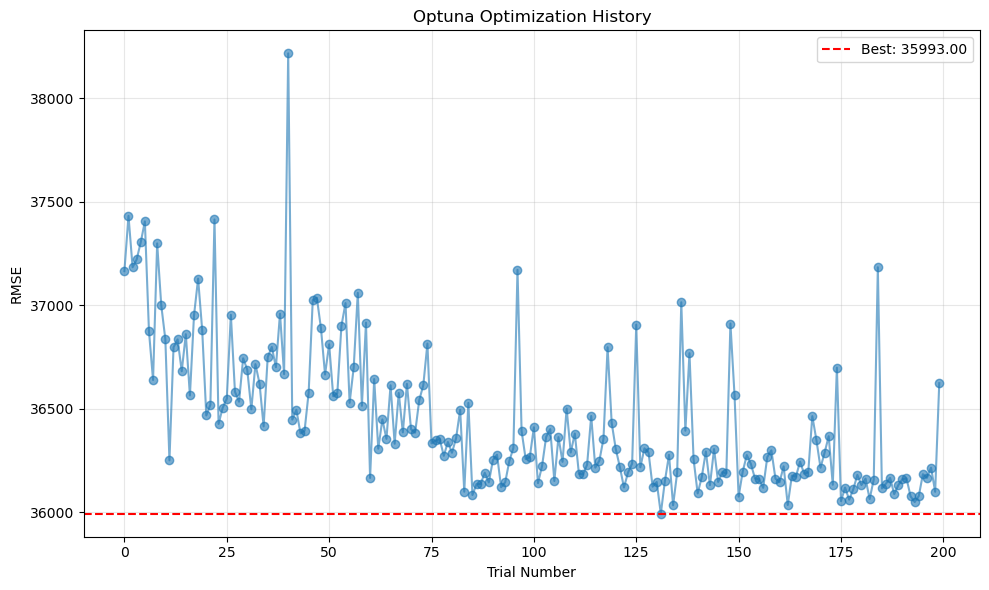

Details for mid segment:
Best trial number: 157
Best RMSE: 91669.11975578431
Best parameters: {'n_estimators': 1494, 'learning_rate': 0.0591310714508011, 'num_leaves': 143, 'max_depth': 19, 'min_child_samples': 18, 'subsample': 0.9327023224082089, 'colsample_bytree': 0.5610102961609175}


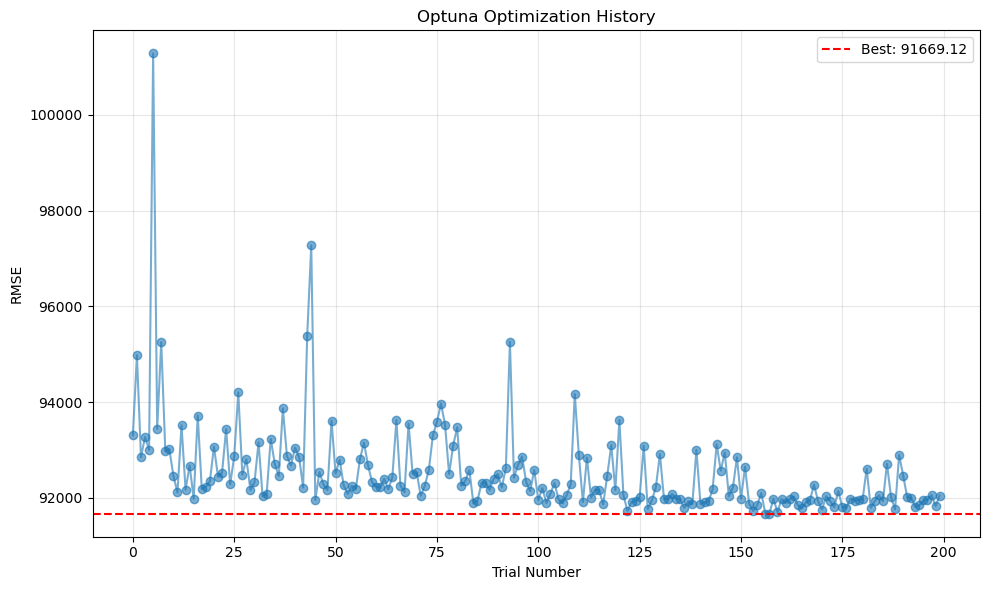

Details for high segment:
Best trial number: 156
Best RMSE: 186362.82582978558
Best parameters: {'n_estimators': 1011, 'learning_rate': 0.010555203732718746, 'num_leaves': 130, 'max_depth': 18, 'min_child_samples': 12, 'subsample': 0.8753968850598899, 'colsample_bytree': 0.5003753045491645}


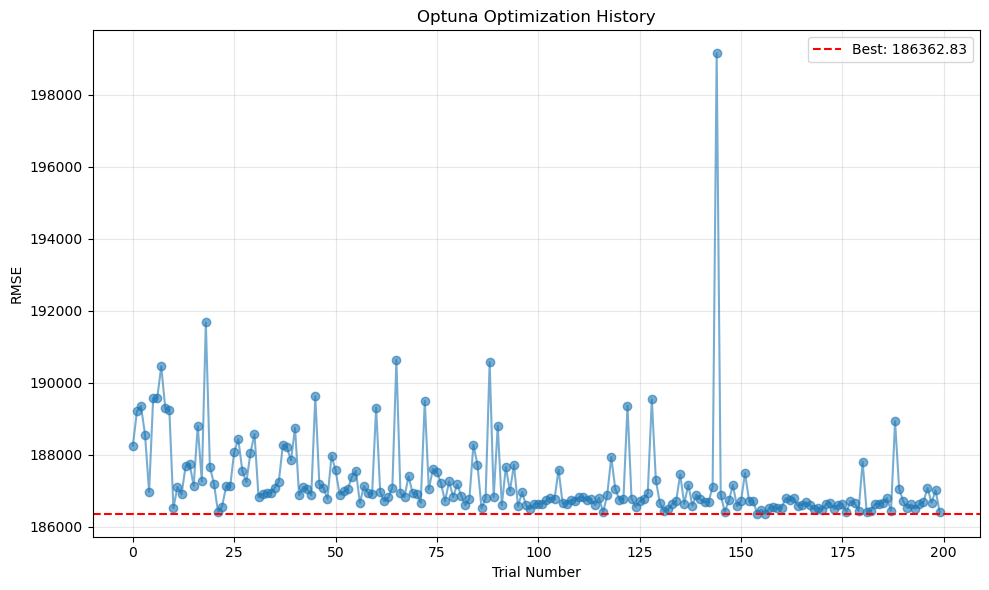

In [35]:
for name, (low, high) in segments.items():
    study = segment_studies[name]
    print(f"Details for {name} segment:")
    
    # 1. Find which trial had the best params
    print(f"Best trial number: {study.best_trial.number}")
    print(f"Best RMSE: {study.best_value}")
    print(f"Best parameters: {study.best_params}")

    # 2. Plot trial vs value (optimization history)
    trial_numbers = [trial.number for trial in study.trials]
    trial_values = [trial.value for trial in study.trials]

    plt.figure(figsize=(10, 6))
    plt.plot(trial_numbers, trial_values, 'o-', alpha=0.6)
    plt.axhline(y=study.best_value, color='r', linestyle='--', label=f'Best: {study.best_value:.2f}')
    plt.xlabel('Trial Number')
    plt.ylabel('RMSE')
    plt.title('Optuna Optimization History')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

In [45]:
# Linear calibration per segment (quick bias correction)

Y_pred_cal = Y_pred.copy()
calibration = {}

for name, (low, high) in segments.items():
    data = segment_data[name]
    preds_train = np.exp(segment_models[name].predict(data["X_train"]))
    y_train_seg = data["y_train"]

    b, a = np.polyfit(preds_train, y_train_seg, 1)  # y = a + b*x
    calibration[name] = {"a": a, "b": b}

    mask_test = (test_data[target] > low) & (test_data[target] <= high)
    Y_pred_cal.loc[mask_test] = a + b * Y_pred.loc[mask_test]

Y_pred = Y_pred_cal
calibration


{'low': {'a': -43854.532937560114, 'b': 1.2375468602695332},
 'mid': {'a': -13694.271230626557, 'b': 1.036292737296548},
 'high': {'a': -286819.74139132403, 'b': 1.2110813901670436}}

In [46]:
# Evaluate overall performance
rmse = mean_squared_error(Y_test, Y_pred, squared=False)
mean_price = Y_test.mean()
rmse_relative = (rmse / mean_price) * 100
mae = mean_absolute_error(Y_test, Y_pred)
mae_relative = (mae / mean_price) * 100
r2 = r2_score(Y_test, Y_pred)

print(f"RMSE: {rmse:.2f}")
print(f"Mean price: {mean_price:.2f}")
print(f"RMSE as percentage of mean price: {rmse_relative:.2f}%")
print(f"MAE: {mae:.2f}")
print(f"MAE as percentage of mean price: {mae_relative:.2f}%")
print(f"R-squared: {r2:.2f}")

pd.DataFrame(segment_metrics)

RMSE: 95912.48
Mean price: 592617.05
RMSE as percentage of mean price: 16.18%
MAE: 64826.34
MAE as percentage of mean price: 10.94%
R-squared: 0.91


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



,segment,n_test,rmse,rmse as a percentage of mean price,mae,mae as a percentage of mean price,loss
0,low,2042,34348.744823,0.172759,26934.034069,0.135466,huber
1,mid,28994,86737.729762,0.158812,60999.149168,0.111686,regression
2,high,2562,190257.523854,0.132848,147891.002235,0.103265,huber


In [47]:
# Calculate tolerance levels
percentage_errors = np.abs((Y_test - Y_pred) / Y_test) * 100

tolerances = [5, 10, 15, 20]

for tol in tolerances:
    within_tol = (percentage_errors <= tol).sum()
    pct = (within_tol / len(Y_test)) * 100
    print(f"Within {tol:2d}%: {pct:5.1f}% ({within_tol}/{len(Y_test)} properties)")



Within  5%:  31.6% (10625/33598 properties)
Within 10%:  57.3% (19242/33598 properties)
Within 15%:  74.8% (25124/33598 properties)
Within 20%:  85.2% (28642/33598 properties)


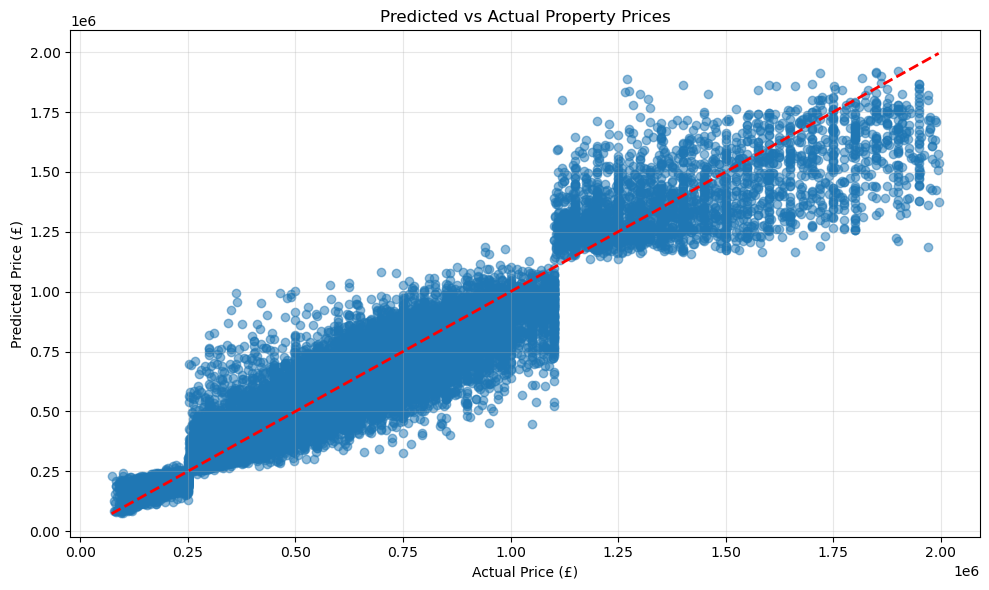

In [48]:
# Plot predicted vs actual
plt.figure(figsize=(10, 6))
plt.scatter(Y_test, Y_pred, alpha=0.5)
plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], 'r--', lw=2)  # perfect prediction line
plt.xlabel('Actual Price (£)')
plt.ylabel('Predicted Price (£)')
plt.title('Predicted vs Actual Property Prices')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Feature importance for low segment:


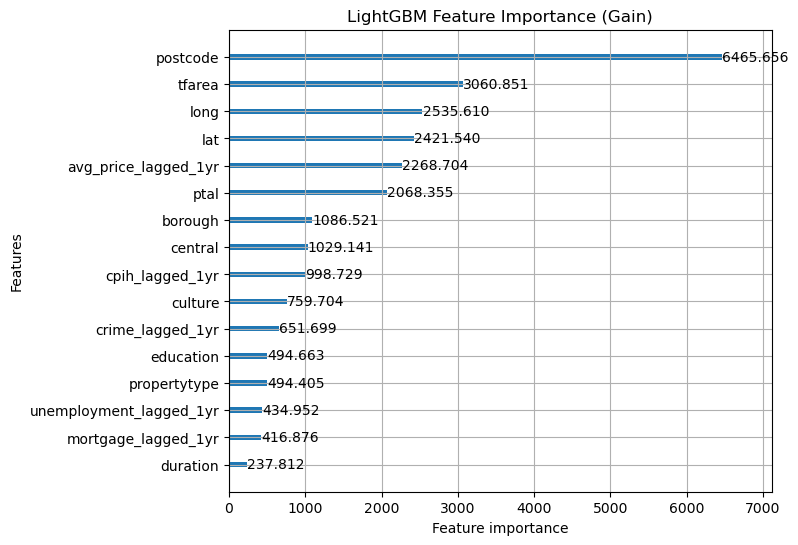

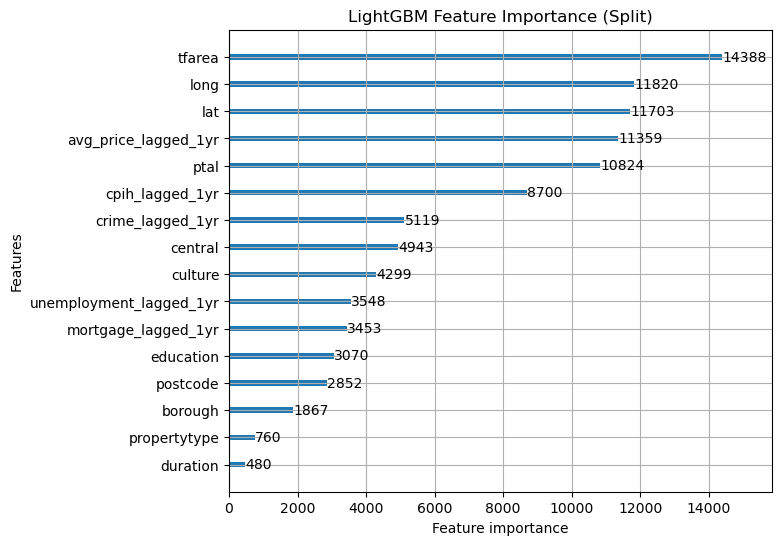

Feature importance for mid segment:


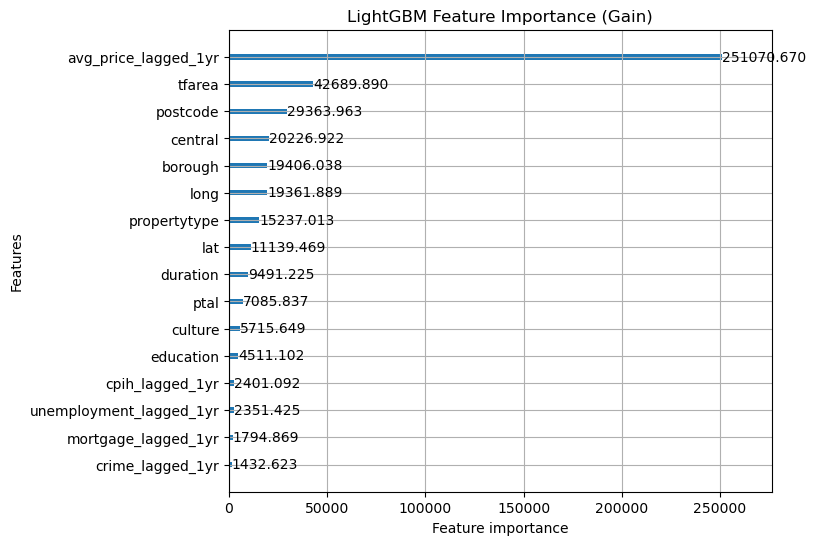

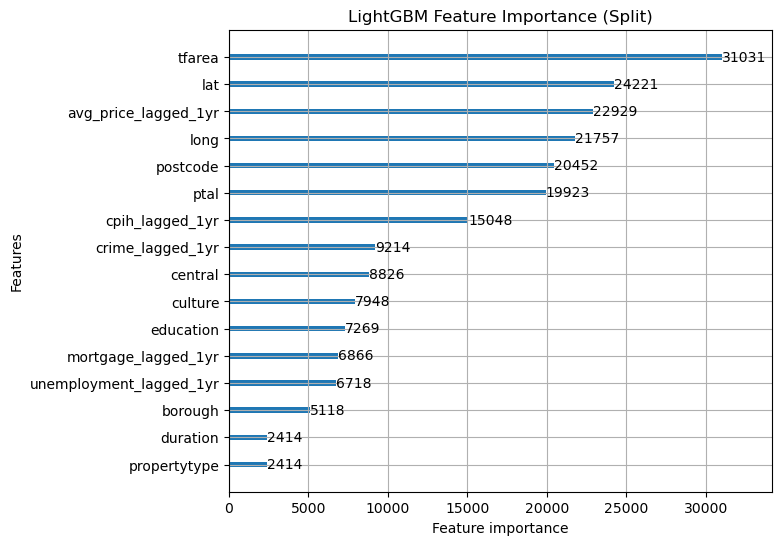

Feature importance for high segment:


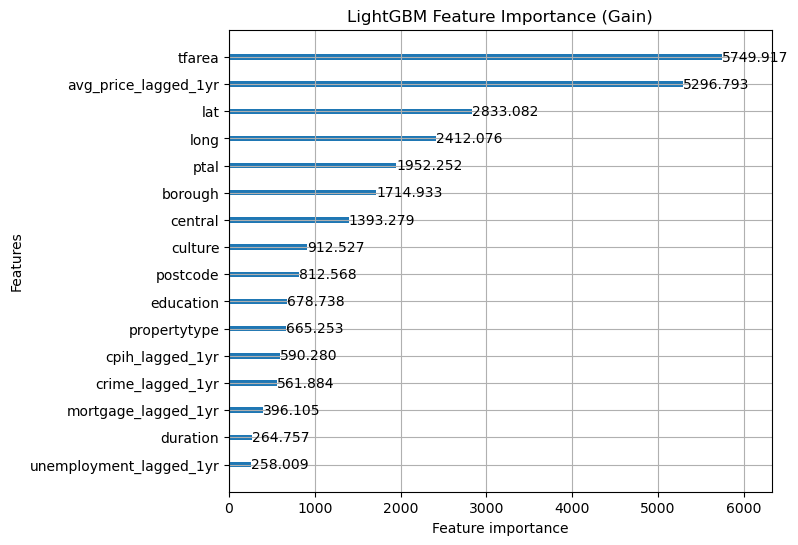

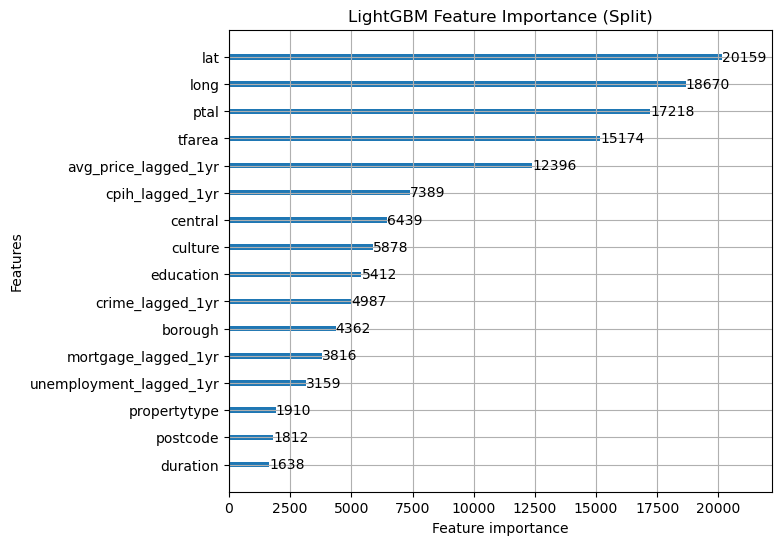

In [49]:
for name, (low, high) in segments.items():
    study = segment_studies[name]
    best_model = segment_models[name]

    print(f"Feature importance for {name} segment:")

    #Feature importance (Gain)
    lgb.plot_importance(best_model, importance_type="gain", figsize=(7,6), title="LightGBM Feature Importance (Gain)")
    plt.show()

    # Feature importance (Split)
    lgb.plot_importance(best_model, importance_type="split", figsize=(7,6), title="LightGBM Feature Importance (Split)")
    plt.show()

In [50]:
# Build results dataframe for error analysis

results_df = (
    test_data[["tfarea", "year", "postcode", "price", "propertytype"]]
    .copy()
    .join(pd.Series(Y_pred, index=test_data.index, name="predictedprice"))
)
results_df = results_df.rename(columns={"price": "actualprice"})

# compute absolute percentage error
results_df["ape"] = (results_df.actualprice - results_df.predictedprice).abs() / results_df.actualprice

# compute signed percentage error
results_df["spe"] = (results_df.actualprice - results_df.predictedprice) / results_df.actualprice

# segment label for analysis
results_df["segment"] = pd.cut(
    results_df.actualprice,
    bins=[0, LOW_MAX, HIGH_MIN, np.inf],
    labels=["low", "mid", "high"],
    include_lowest=True,
)

results_df.head()

,tfarea,year,postcode,actualprice,propertytype,predictedprice,ape,spe,segment
547873,72.0,2024,CR0 1TZ,275000,F,304844.540297,0.108526,-0.108526,mid
547874,82.0,2024,SE28 8PF,380000,T,384287.119196,0.011282,-0.011282,mid
547875,101.0,2024,TW11 9EX,650000,T,803138.196655,0.235597,-0.235597,mid
547876,65.0,2024,HA5 5JS,380000,F,351963.349237,0.073781,0.073781,mid
547877,88.0,2024,NW11 9LT,555000,F,506749.647191,0.086938,0.086938,mid


In [51]:
# SPE by property type (overall + within segments)

spe_by_type = (
    results_df.groupby("propertytype")["spe"]
    .agg(n="size", spe_mean="mean", spe_median="median", spe_std="std")
    .sort_values("spe_mean")
)

spe_by_type

spe_by_type_segment = (
    results_df.groupby(["segment", "propertytype"])["spe"]
    .agg(n="size", spe_mean="mean", spe_median="median", spe_std="std")
    .reset_index()
    .sort_values(["segment", "spe_mean"])
)

spe_by_type_segment


/var/folders/_6/n4f9pfd14lv1q8nl3892x2v80000gn/T/ipykernel_16956/3046675357.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,segment,propertytype,n,spe_mean,spe_median,spe_std
0,low,D,2,-0.614458,-0.614458,0.954255
3,low,T,107,-0.078424,-0.029563,0.276084
1,low,F,1916,-0.039860,0.014847,0.235729
2,low,S,17,-0.011238,0.004496,0.089042
4,mid,D,1337,-0.018807,0.002438,0.170628
5,mid,F,12291,-0.011684,0.000896,0.166594
6,mid,S,5759,-0.006718,0.007624,0.153720
7,mid,T,9607,0.002241,0.018033,0.154218
9,high,F,410,-0.020564,-0.015138,0.136397
8,high,D,456,-0.006333,0.000173,0.139153


In [52]:
# Error distribution (APE)
results_df["ape"].describe()

count    3.359800e+04
mean     1.133326e-01
std      1.191721e-01
min      1.014681e-07
25%      3.895735e-02
50%      8.392613e-02
75%      1.507231e-01
max      2.146071e+00
Name: ape, dtype: float64

In [53]:
# Error distribution (SPE)
results_df["spe"].describe()

count    33598.000000
mean        -0.007836
std          0.164272
min         -2.146071
25%         -0.079965
50%          0.008225
75%          0.087152
max          0.572364
Name: spe, dtype: float64

In [54]:
# Error summary by segment
results_df.groupby("segment")[["ape", "spe"]].agg(["mean", "median", "std"])

/var/folders/_6/n4f9pfd14lv1q8nl3892x2v80000gn/T/ipykernel_16956/3519657844.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



ape                           spe                    
             mean    median       std      mean    median       std
segment                                                            
low      0.156007  0.102151  0.185578 -0.042206  0.011717  0.238762
mid      0.111491  0.083036  0.115469 -0.006412  0.008219  0.160383
high     0.100163  0.081635  0.079108  0.003447  0.005231  0.127604

In [55]:
# Segment sizes
results_df["segment"].value_counts().sort_index()

segment
low      2042
mid     28994
high     2562
Name: count, dtype: int64

In [57]:
fig = px.histogram(results_df, x='ape', nbins=80, log_y=False)
fig.update_layout(
    xaxis_title='Absolute Percentage Error (APE)',
    yaxis_title='Count'
)
fig.show()

In [58]:
# RMSE by APE decile

results_df["ape_decile"] = pd.qcut(results_df.ape, 10, labels=False)

rmse_by_decile = (
    results_df.groupby("ape_decile")
      .apply(lambda x: np.sqrt(((x.actualprice - x.predictedprice) ** 2).mean()))
)

decile_summary = (
    results_df.groupby("ape_decile")
    .agg(
        n=("ape", "size"),
        ape_min=("ape", "min"),
        ape_max=("ape", "max"),
        ape_mean=("ape", "mean"),
    )
    .join(rmse_by_decile.rename("rmse"))
)

decile_summary


/var/folders/_6/n4f9pfd14lv1q8nl3892x2v80000gn/T/ipykernel_16956/1647132127.py:7: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,n,ape_min,ape_max,ape_mean,rmse
ape_decile,,,,,
0,3360,1.014681e-07,0.015331,0.007617,5746.512431
1,3360,1.533191e-02,0.030915,0.023137,15342.579824
2,3360,3.091976e-02,0.047131,0.038989,25944.961173
3,3359,4.713565e-02,0.064801,0.055877,37471.938782
4,3360,6.480550e-02,0.083925,0.074257,50434.388607
5,3360,8.392713e-02,0.106490,0.094879,64197.211845
6,3359,1.064921e-01,0.133805,0.119633,82827.234925
7,3360,1.338076e-01,0.170977,0.151312,105812.079027
8,3360,1.709872e-01,0.235355,0.199661,145578.715143


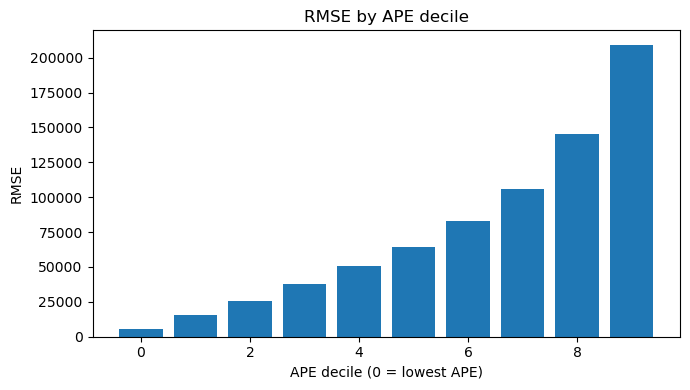

In [59]:
plt.figure(figsize=(7,4))
plt.bar(decile_summary.index, decile_summary["rmse"])
plt.xlabel("APE decile (0 = lowest APE)")
plt.ylabel("RMSE")
plt.title("RMSE by APE decile")
plt.tight_layout()
plt.show()

In [60]:
# Error by price bins

results_df['price_bin'] = pd.qcut(results_df.actualprice, 20, labels=False)
pricebins = results_df.groupby('price_bin')['ape'].mean()
pricebins

price_bin
0     0.160835
1     0.163244
2     0.138982
3     0.122540
4     0.104100
5     0.099538
6     0.095866
7     0.098318
8     0.096027
9     0.105069
10    0.095719
11    0.109265
12    0.104053
13    0.110069
14    0.107184
15    0.112017
16    0.110906
17    0.113214
18    0.117109
19    0.098636
Name: ape, dtype: float64

In [61]:
results_df['price_bin'] = pd.qcut(results_df.actualprice, 20, labels=False)
pricebins = results_df.groupby('price_bin')['spe'].mean()
pricebins

price_bin
0    -0.075420
1    -0.107796
2    -0.108195
3    -0.084103
4    -0.052619
5    -0.040343
6    -0.025236
7    -0.017572
8    -0.004703
9    -0.009806
10    0.012990
11    0.018312
12    0.024944
13    0.023401
14    0.033143
15    0.045087
16    0.064196
17    0.090065
18    0.010492
19    0.055303
Name: spe, dtype: float64

In [62]:
results_df["area_q"] = pd.qcut(results_df.tfarea, 20, labels=False)

areabins = results_df.groupby("area_q")["ape"].mean()
areabins


area_q
0     0.120834
1     0.119664
2     0.118613
3     0.114591
4     0.113954
5     0.114538
6     0.111464
7     0.111589
8     0.116657
9     0.109365
10    0.114308
11    0.113708
12    0.111676
13    0.112235
14    0.111324
15    0.114611
16    0.112928
17    0.107093
18    0.107916
19    0.108869
Name: ape, dtype: float64

In [63]:
results_df["area_q"] = pd.qcut(results_df.tfarea, 20, labels=False)

areabins = results_df.groupby("area_q")["spe"].mean()
areabins

area_q
0    -0.014579
1    -0.007207
2    -0.015951
3    -0.011424
4     0.004038
5    -0.013096
6    -0.004668
7    -0.005139
8    -0.001322
9    -0.007083
10   -0.011240
11   -0.002078
12   -0.005159
13    0.004069
14   -0.001087
15   -0.016031
16   -0.002786
17   -0.013183
18   -0.012451
19   -0.017155
Name: spe, dtype: float64

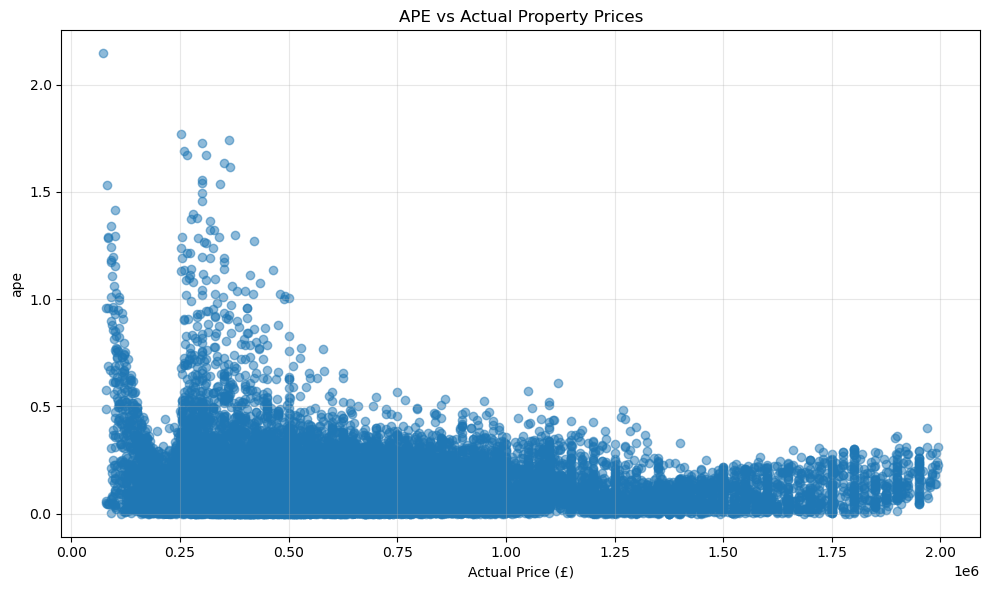

In [64]:
# Plot predicted vs actual
plt.figure(figsize=(10, 6))
plt.scatter(results_df['actualprice'], results_df['ape'], alpha=0.5)
# plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], 'r--', lw=2)  # perfect prediction line
plt.xlabel('Actual Price (£)')
plt.ylabel('ape')
plt.title('APE vs Actual Property Prices')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

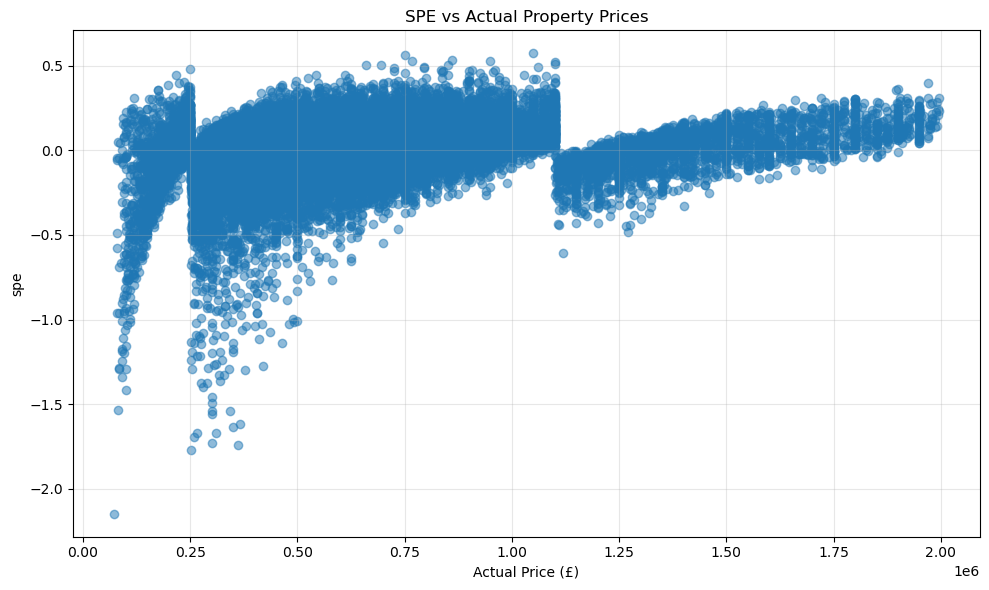

In [65]:
# Plot predicted vs actual
plt.figure(figsize=(10, 6))
plt.scatter(results_df['actualprice'], results_df['spe'], alpha=0.5)
# plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], 'r--', lw=2)  # perfect prediction line
plt.xlabel('Actual Price (£)')
plt.ylabel('spe')
plt.title('SPE vs Actual Property Prices')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [29]:

fig = px.histogram(all_data, x='price', nbins=120, title='Actual Price Distribution')
fig.show()

/var/folders/_6/n4f9pfd14lv1q8nl3892x2v80000gn/T/ipykernel_16956/1368177397.py:6: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



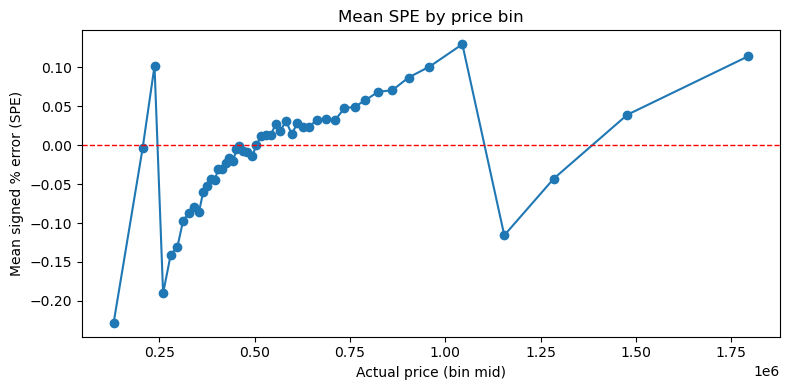

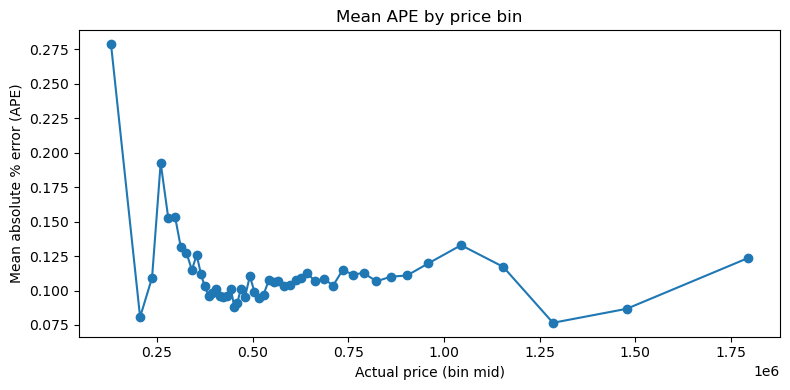

,n,spe_mean,spe_std,ape_mean,mid,spe_sign
actualprice,,,,,,
"(72999.999, 187500.0]",676,-0.228118,0.310021,0.278739,1.302500e+05,-1.0
"(225000.0, 250000.0]",696,0.101683,0.086245,0.109300,2.375000e+05,1.0
"(250000.0, 270000.0]",647,-0.190328,0.221490,0.192647,2.600000e+05,-1.0
"(510000.0, 522500.0]",575,0.012356,0.123784,0.094863,5.162500e+05,1.0
"(1100000.0, 1210000.0]",550,-0.115774,0.091087,0.117190,1.155000e+06,-1.0
"(1360000.0, 1595000.0]",658,0.038967,0.097786,0.086721,1.477500e+06,1.0


In [66]:
# Exploratory: SPE/APE by price bins to choose segmentation points

price_bins = pd.qcut(results_df.actualprice, q=50, duplicates='drop')

bin_summary = (
    results_df.groupby(price_bins)
    .agg(
        n=("spe", "size"),
        spe_mean=("spe", "mean"),
        spe_std=("spe", "std"),
        ape_mean=("ape", "mean"),
    )
)

bin_summary["mid"] = bin_summary.index.map(lambda x: x.mid)

bin_summary

plt.figure(figsize=(8, 4))
plt.plot(bin_summary["mid"], bin_summary["spe_mean"], marker="o")
plt.axhline(0, color="r", linestyle="--", linewidth=1)
plt.xlabel("Actual price (bin mid)")
plt.ylabel("Mean signed % error (SPE)")
plt.title("Mean SPE by price bin")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(bin_summary["mid"], bin_summary["ape_mean"], marker="o")
plt.xlabel("Actual price (bin mid)")
plt.ylabel("Mean absolute % error (APE)")
plt.title("Mean APE by price bin")
plt.tight_layout()
plt.show()

# Candidate split points where mean SPE changes sign
bin_summary.assign(spe_sign=np.sign(bin_summary.spe_mean)).loc[
    lambda d: d.spe_sign.diff().ne(0)
]


In [67]:
# list of intervals (each interval is the price range)
bin_table = (
    bin_summary
    .assign(price_range=bin_summary.index.astype(str))
    .loc[:, ["price_range", "spe_mean", "spe_std"]]
    .assign(
        spe_min=results_df.groupby(price_bins)["spe"].min().values,
        spe_max=results_df.groupby(price_bins)["spe"].max().values,
    )
    .reset_index(drop=True)
)

bin_table

/var/folders/_6/n4f9pfd14lv1q8nl3892x2v80000gn/T/ipykernel_16956/625367472.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/_6/n4f9pfd14lv1q8nl3892x2v80000gn/T/ipykernel_16956/625367472.py:8: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,price_range,spe_mean,spe_std,spe_min,spe_max
0,"(72999.999, 187500.0]",-0.228118,0.310021,-2.146071,0.354207
1,"(187500.0, 225000.0]",-0.004101,0.106292,-0.291199,0.442877
2,"(225000.0, 250000.0]",0.101683,0.086245,-0.163011,0.477458
3,"(250000.0, 270000.0]",-0.190328,0.221490,-1.768658,0.056177
4,"(270000.0, 290000.0]",-0.140533,0.197814,-1.398751,0.167656
5,"(290000.0, 305000.0]",-0.130781,0.231420,-1.725897,0.138046
6,"(305000.0, 320000.0]",-0.096902,0.194929,-1.671843,0.179302
7,"(320000.0, 334976.0]",-0.086867,0.184122,-1.324878,0.211205
8,"(334976.0, 348000.0]",-0.079662,0.161002,-1.536764,0.230370
9,"(348000.0, 360000.0]",-0.086056,0.178444,-1.636292,0.217121
